In [1]:
import numpy as np
import pylab as pl
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.utils import shuffle
#from sklearn.svm import SVC
#from sklearn.metrics import confusion_matrix,classification_report
#from sklearn.model_selection import cross_val_score, GridSearchCV

In [2]:
##Changes in mean amplitude or power across frequency bands can provide insights into the brain's activity and responsiveness.
##Specific patterns may indicate shifts in cognitive states, such as relaxation, attention, or engagement.
##Higher mean values may indicate increased activity or synchronization in that frequency band.

In [3]:
import pandas as pd

# Read the 'med1_feature.csv' file
data = pd.read_csv('alpha_beta_gamma_decomp_med2.csv')

# Display the first 4 rows of the DataFrame
data.head(14)

,Unnamed: 0,AF3 alpha,AF3 beta,AF4 alpha,AF4 beta,P7 alpha,P7 beta,P8 alpha,P8 beta,FC5 alpha,...,T8 alpha,T8 beta,Fp1 alpha,Fp1 beta,Fp2 alpha,Fp2 beta,Fpz alpha,Fpz beta,O1 gamma,O2 gamma
0,0,5.836437e-08,-1.741808e-08,1.310329e-07,7.688693e-10,-1.653440e-07,-3.651634e-08,-1.847209e-07,-2.579408e-08,-5.418365e-09,...,-4.369584e-08,-6.265283e-08,-2.866445e-09,-1.134238e-09,4.104145e-08,-4.437268e-08,5.591039e-08,-3.306467e-08,-1.596958e-08,-2.243411e-08
1,1,-5.637918e-08,-2.965035e-08,-9.744049e-08,-4.743568e-08,4.099162e-08,1.715935e-08,-7.938759e-08,-2.645091e-08,-4.550842e-08,...,-5.096193e-08,-3.625796e-08,1.999801e-09,7.902822e-10,-4.655166e-08,-1.506913e-08,-5.609671e-08,-2.023201e-08,-8.562850e-09,4.319239e-09
2,2,-2.971522e-09,4.798177e-08,1.705593e-08,2.247377e-08,-2.563166e-08,-3.900078e-09,3.197511e-09,1.477775e-08,-2.982253e-08,...,-3.090713e-08,3.205931e-08,-3.125187e-10,-8.622630e-11,7.923048e-09,1.611871e-08,1.165502e-08,2.376475e-08,-2.889911e-10,-7.434783e-09
3,3,2.805893e-09,-5.407907e-08,-9.625793e-09,-1.516129e-08,5.713679e-08,-1.183925e-08,4.838266e-08,-2.582889e-08,3.300062e-08,...,5.246111e-09,-1.613380e-08,-1.900398e-10,1.478861e-10,-2.950241e-08,-2.844762e-08,-2.224402e-08,-3.124071e-08,9.075755e-09,9.422787e-09
4,4,-1.420002e-07,3.284389e-08,-5.592740e-08,4.590943e-08,1.305227e-07,3.938210e-08,1.289002e-07,2.900576e-08,-7.206650e-08,...,-3.252766e-08,2.368604e-11,-8.893607e-10,-1.163043e-09,-9.281620e-08,3.972527e-08,-1.003706e-07,4.302043e-08,-1.316533e-08,-1.261118e-08
5,5,6.129847e-08,1.632350e-08,-4.883716e-08,-1.479465e-08,-1.098856e-07,-1.846715e-08,-8.633707e-08,-8.632978e-09,3.171049e-08,...,8.159268e-09,3.007203e-09,1.803744e-09,7.399143e-10,1.014233e-08,-6.487225e-09,1.066993e-08,-1.185117e-08,-2.100272e-09,-1.039498e-09
6,6,-1.055296e-07,-2.753867e-08,-3.162963e-08,-1.130917e-08,-5.237397e-08,-3.435228e-08,1.553375e-07,-2.277644e-10,-1.370463e-07,...,-3.906432e-08,-1.271358e-08,7.321946e-10,7.202115e-10,-7.284872e-08,-1.398644e-08,-7.533592e-08,-2.455103e-08,1.005261e-08,1.000333e-09
7,7,3.304980e-08,7.008910e-09,2.059874e-08,-1.938756e-08,5.165863e-08,3.742057e-08,-2.673132e-07,3.385700e-09,5.812224e-08,...,-1.114839e-07,-2.413202e-08,-2.514105e-09,-1.239387e-09,4.297096e-08,-5.375694e-09,3.783088e-08,1.391046e-08,-5.648761e-09,4.335472e-09
8,8,1.712064e-07,-4.668317e-09,8.750253e-08,-8.464460e-09,9.670604e-08,-1.483848e-08,6.083627e-08,2.928177e-09,2.131758e-07,...,1.032186e-07,1.136300e-08,3.108603e-09,6.209367e-10,9.767024e-08,-1.058592e-09,1.089793e-07,-3.834481e-09,5.074491e-09,-8.903043e-10
9,9,-9.758994e-08,-1.216170e-08,2.854609e-08,3.769892e-08,-6.516715e-08,4.867625e-09,9.224902e-08,-1.434552e-08,-1.071061e-07,...,1.096333e-07,3.741417e-08,-2.223692e-09,-8.481238e-10,-1.041394e-08,1.092087e-08,-5.187630e-08,-4.279605e-09,-2.133884e-09,5.078749e-09


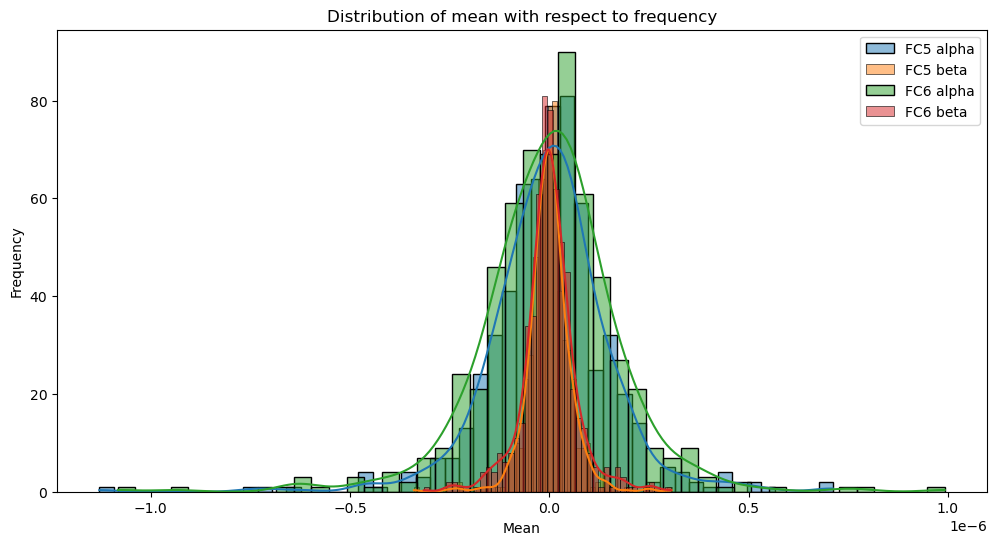

In [4]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
data = pd.read_csv('alpha_beta_gamma_decomp_med2.csv')

# Select the numerical columns you want to plot
numerical_columns = ['FC5 alpha','FC5 beta','FC6 alpha','FC6 beta']

# Plot histograms for each numerical column
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
for column in numerical_columns:
    sns.histplot(data=data, x=column, kde=True, label=column)

plt.legend()
plt.xlabel('Mean')
plt.ylabel('Frequency')
plt.title('Distribution of mean with respect to frequency')
plt.show()

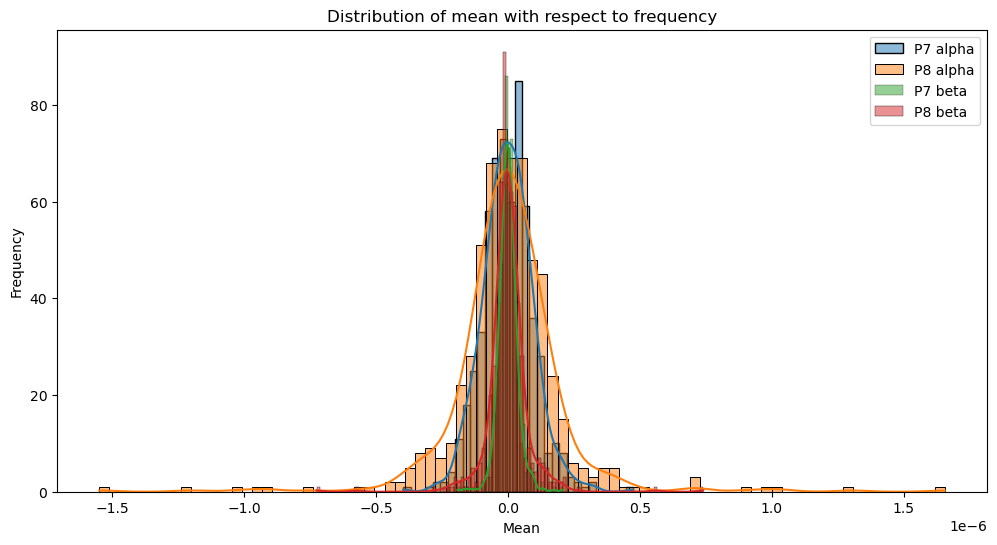

In [5]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
data = pd.read_csv('alpha_beta_gamma_decomp_med2.csv')

# Select the numerical columns you want to plot
numerical_columns = ['P7 alpha','P8 alpha','P7 beta','P8 beta']

# Plot histograms for each numerical column
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
for column in numerical_columns:
    sns.histplot(data=data, x=column, kde=True, label=column)

plt.legend()
plt.xlabel('Mean')
plt.ylabel('Frequency')
plt.title('Distribution of mean with respect to frequency')
plt.show()

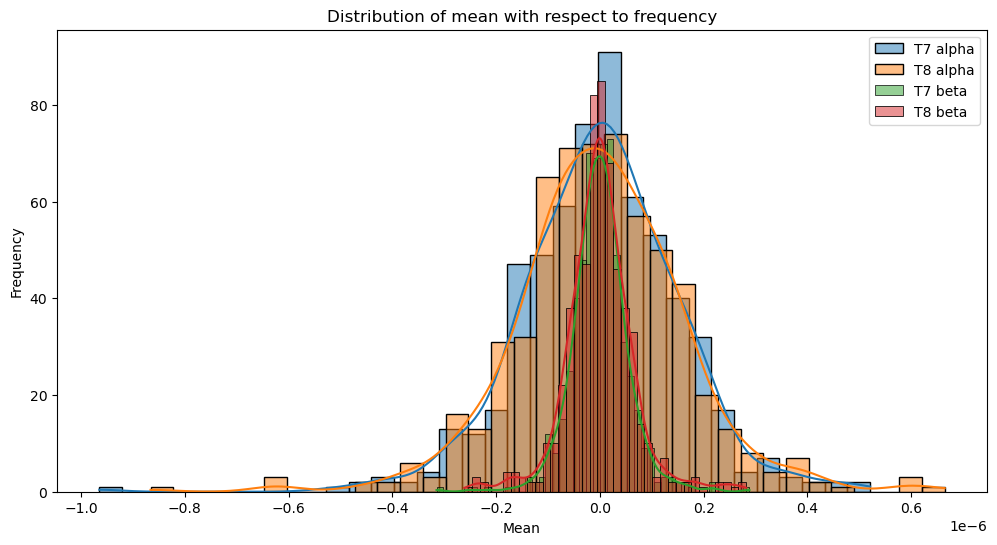

In [6]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
data = pd.read_csv('alpha_beta_gamma_decomp_med2.csv')

# Select the numerical columns you want to plot
numerical_columns = ['T7 alpha','T8 alpha','T7 beta','T8 beta']

# Plot histograms for each numerical column
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
for column in numerical_columns:
    sns.histplot(data=data, x=column, kde=True, label=column)

plt.legend()
plt.xlabel('Mean')
plt.ylabel('Frequency')
plt.title('Distribution of mean with respect to frequency')
plt.show()

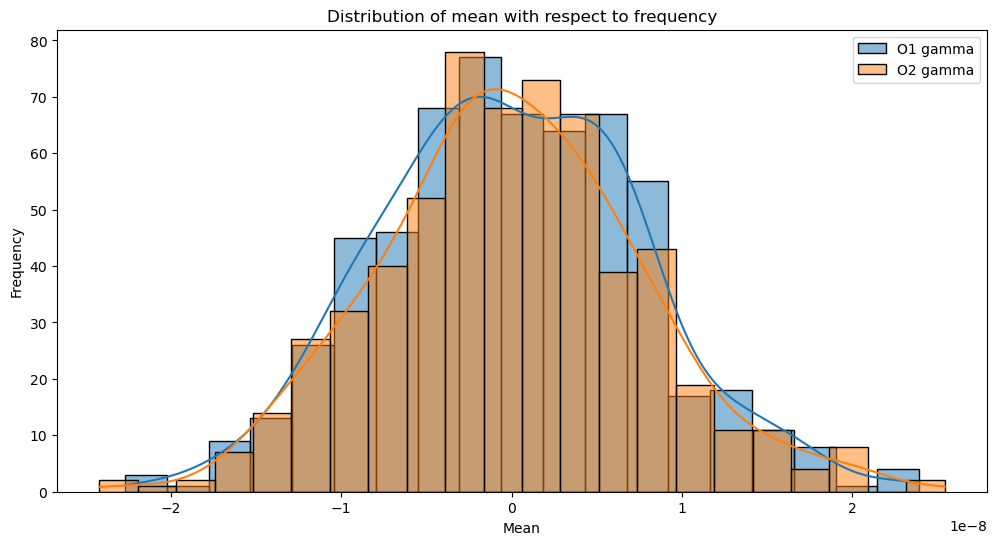

In [7]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
data = pd.read_csv('alpha_beta_gamma_decomp_med2.csv')

# Select the numerical columns you want to plot
numerical_columns = ['O1 gamma','O2 gamma']

# Plot histograms for each numerical column
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
for column in numerical_columns:
    sns.histplot(data=data, x=column, kde=True, label=column)

plt.legend()
plt.xlabel('Mean')
plt.ylabel('Frequency')
plt.title('Distribution of mean with respect to frequency')
plt.show()

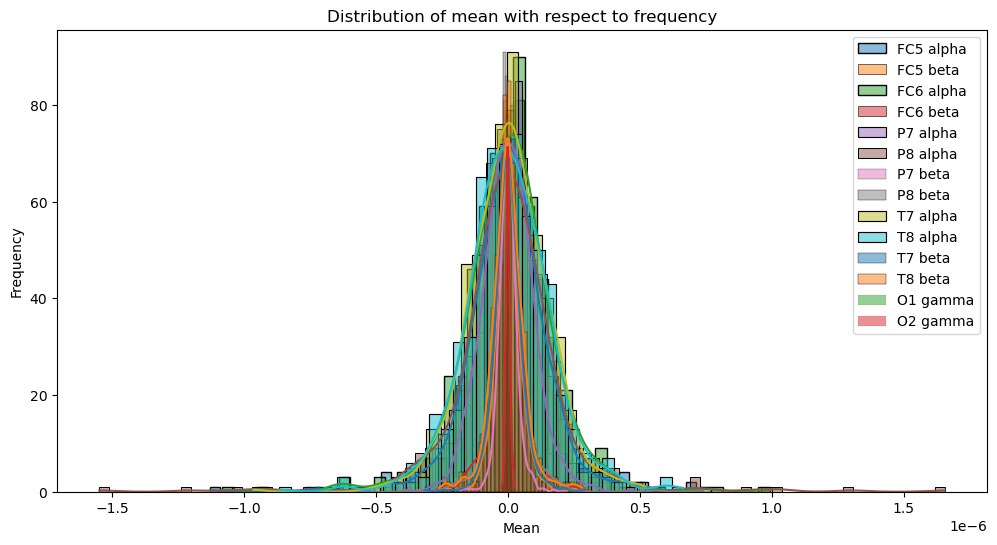

In [8]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
data = pd.read_csv('alpha_beta_gamma_decomp_med2.csv')

# Select the numerical columns you want to plot
numerical_columns = ['FC5 alpha','FC5 beta','FC6 alpha','FC6 beta','P7 alpha','P8 alpha','P7 beta','P8 beta','T7 alpha','T8 alpha','T7 beta','T8 beta','O1 gamma','O2 gamma']

# Plot histograms for each numerical column
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
for column in numerical_columns:
    sns.histplot(data=data, x=column, kde=True, label=column)

plt.legend()
plt.xlabel('Mean')
plt.ylabel('Frequency')
plt.title('Distribution of mean with respect to frequency')
plt.show()

In [9]:
import pandas as pd

# Read the 'med1_feature.csv' file
data = pd.read_csv('Mean_Psd_abg_think1.csv')

# Display the first 4 rows of the DataFrame
data.head(14)

,Unnamed: 0,channel,mean,psd_mean
0,0,AF3 alpha,-5.923139e-10,6.431642e-16
1,1,AF3 beta,-1.658459e-10,1.260369e-17
2,2,AF4 alpha,-5.512093e-10,7.196533e-16
3,3,AF4 beta,-1.568048e-10,1.561231e-17
4,4,P7 alpha,-7.559385e-10,1.400364e-16
5,5,P7 beta,-1.581913e-10,5.268875e-18
6,6,P8 alpha,-1.302140e-10,2.910428e-16
7,7,P8 beta,9.479226e-12,1.077375e-17
8,8,FC5 alpha,-7.943666e-10,4.245999e-16
9,9,FC5 beta,-1.793580e-10,9.662461e-18


In [10]:
df=pd.read_csv("main_ctrl.csv")

In [11]:
df

,Unnamed: 0,AF3 alpha mean,AF3 alpha psd_mean,AF3 beta mean,AF3 beta psd_mean,AF4 alpha mean,AF4 alpha psd_mean,AF4 beta mean,AF4 beta psd_mean,P7 alpha mean,...,Fp2 beta psd_mean,Fpz alpha mean,Fpz alpha psd_mean,Fpz beta mean,Fpz beta psd_mean,O1 gamma mean,O1 gamma psd_mean,O2 gamma mean,O2 gamma psd_mean,task
0,0,-1.234209e-10,5.835755e-16,8.626931e-11,2.480530e-17,-4.868209e-10,6.139898e-16,-2.357428e-11,2.850148e-17,-4.460695e-10,...,2.627109e-17,-4.350041e-10,6.189793e-16,4.292408e-11,2.418235e-17,-9.218526e-12,7.469438e-19,6.413911e-12,7.755573e-19,ctrl
1,1,-1.965114e-10,7.637409e-16,-1.446261e-11,2.013617e-17,-2.158502e-10,7.880605e-16,-1.126985e-10,2.189538e-17,-1.350438e-10,...,2.042605e-17,-7.421432e-11,7.742777e-16,-8.257470e-11,2.048001e-17,-6.642992e-11,3.734154e-19,-4.270474e-11,5.839003e-19,ctrl
2,2,-4.993310e-11,8.741939e-16,-5.646477e-11,6.072227e-18,-1.892014e-10,8.721920e-16,-1.015070e-10,6.266062e-18,1.681699e-12,...,6.608201e-18,1.337527e-11,8.852896e-16,-2.663222e-11,6.309775e-18,1.346601e-11,9.000208e-19,-3.739915e-11,2.378463e-18,ctrl
3,3,4.231512e-10,3.911875e-16,4.374723e-11,2.110377e-17,4.298605e-10,4.100043e-16,1.273237e-10,2.062264e-17,3.220579e-10,...,1.862973e-17,4.668211e-10,4.010663e-16,1.108412e-10,1.938712e-17,-3.761283e-10,1.090512e-17,-3.857390e-11,7.937103e-19,ctrl
4,4,-7.616775e-10,4.497852e-16,-1.340900e-10,1.354855e-16,-7.469075e-10,4.581505e-16,-1.105409e-10,1.408442e-16,-1.521248e-10,...,1.455974e-16,-6.761241e-10,4.864915e-16,-1.308083e-10,1.433334e-16,-3.457981e-11,9.182013e-19,-1.200232e-11,1.658331e-18,ctrl
5,5,3.288995e-10,7.229660e-16,1.606532e-10,2.823650e-17,9.000252e-10,7.736956e-16,2.216980e-10,3.464487e-17,1.133368e-10,...,3.010779e-17,3.650331e-10,7.355986e-16,1.332561e-10,2.972186e-17,1.738258e-12,2.792363e-19,9.154189e-12,4.412054e-19,ctrl
6,6,-3.181805e-10,3.144850e-16,-4.397132e-11,1.106732e-17,-4.517513e-11,2.881519e-16,2.661766e-11,1.021192e-17,-4.899657e-10,...,1.017707e-17,-2.086440e-10,3.126937e-16,-7.035249e-11,1.062278e-17,7.430013e-12,2.799835e-19,3.089218e-11,3.475604e-19,ctrl
7,7,-3.472044e-10,1.861347e-16,-9.143152e-11,1.533293e-17,-3.572433e-10,1.922614e-16,-1.096401e-10,1.574816e-17,-5.719440e-11,...,1.583144e-17,-3.626532e-10,1.865657e-16,-1.158191e-10,1.521894e-17,-4.050423e-11,2.195850e-18,9.479166e-11,5.831835e-18,ctrl


In [12]:
columns_to_mean = ['AF3 alpha psd_mean','AF4 alpha psd_mean', 'P7 alpha psd_mean', 'P8 alpha psd_mean','T7 alpha psd_mean','T8 alpha psd_mean','FC5 alpha psd_mean','FC6 alpha psd_mean',]


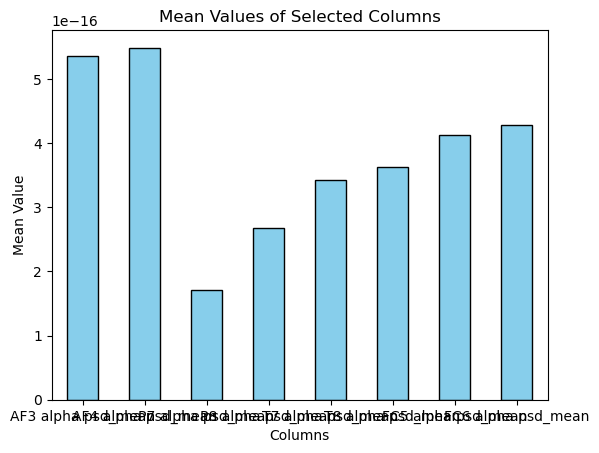

In [13]:
mean_values = df[columns_to_mean].mean()
mean_values.plot(kind='bar', rot=0, color='skyblue', edgecolor='black')
plt.xlabel('Columns')
plt.ylabel('Mean Value')
plt.title('Mean Values of Selected Columns')
plt.show()

In [14]:
print(mean_values)


AF3 alpha psd_mean    5.357586e-16
AF4 alpha psd_mean    5.495633e-16
P7 alpha psd_mean     1.714472e-16
P8 alpha psd_mean     2.681022e-16
T7 alpha psd_mean     3.425342e-16
T8 alpha psd_mean     3.637112e-16
FC5 alpha psd_mean    4.126563e-16
FC6 alpha psd_mean    4.290613e-16
dtype: float64


In [15]:
df=pd.read_csv("main_htr.csv")

In [16]:
df

,Unnamed: 0,AF3 alpha mean,AF3 alpha psd_mean,AF3 beta mean,AF3 beta psd_mean,AF4 alpha mean,AF4 alpha psd_mean,AF4 beta mean,AF4 beta psd_mean,P7 alpha mean,...,Fp2 beta psd_mean,Fpz alpha mean,Fpz alpha psd_mean,Fpz beta mean,Fpz beta psd_mean,O1 gamma mean,O1 gamma psd_mean,O2 gamma mean,O2 gamma psd_mean,task
0,0,-1.234209e-10,5.835755e-16,8.626931e-11,2.480530e-17,-4.868209e-10,6.139898e-16,-2.357428e-11,2.850148e-17,-4.460695e-10,...,2.627109e-17,-4.350041e-10,6.189793e-16,4.292408e-11,2.418235e-17,-9.218526e-12,7.469438e-19,6.413911e-12,7.755573e-19,htr
1,1,-1.965114e-10,7.637409e-16,-1.446261e-11,2.013617e-17,-2.158502e-10,7.880605e-16,-1.126985e-10,2.189538e-17,-1.350438e-10,...,2.042605e-17,-7.421432e-11,7.742777e-16,-8.257470e-11,2.048001e-17,-6.642992e-11,3.734154e-19,-4.270474e-11,5.839003e-19,htr
2,2,-4.993310e-11,8.741939e-16,-5.646477e-11,6.072227e-18,-1.892014e-10,8.721920e-16,-1.015070e-10,6.266062e-18,1.681699e-12,...,6.608201e-18,1.337527e-11,8.852896e-16,-2.663222e-11,6.309775e-18,1.346601e-11,9.000208e-19,-3.739915e-11,2.378463e-18,htr
3,3,4.231512e-10,3.911875e-16,4.374723e-11,2.110377e-17,4.298605e-10,4.100043e-16,1.273237e-10,2.062264e-17,3.220579e-10,...,1.862973e-17,4.668211e-10,4.010663e-16,1.108412e-10,1.938712e-17,-3.761283e-10,1.090512e-17,-3.857390e-11,7.937103e-19,htr
4,4,-7.616775e-10,4.497852e-16,-1.340900e-10,1.354855e-16,-7.469075e-10,4.581505e-16,-1.105409e-10,1.408442e-16,-1.521248e-10,...,1.455974e-16,-6.761241e-10,4.864915e-16,-1.308083e-10,1.433334e-16,-3.457981e-11,9.182013e-19,-1.200232e-11,1.658331e-18,htr
5,5,3.288995e-10,7.229660e-16,1.606532e-10,2.823650e-17,9.000252e-10,7.736956e-16,2.216980e-10,3.464487e-17,1.133368e-10,...,3.010779e-17,3.650331e-10,7.355986e-16,1.332561e-10,2.972186e-17,1.738258e-12,2.792363e-19,9.154189e-12,4.412054e-19,htr
6,6,-3.181805e-10,3.144850e-16,-4.397132e-11,1.106732e-17,-4.517513e-11,2.881519e-16,2.661766e-11,1.021192e-17,-4.899657e-10,...,1.017707e-17,-2.086440e-10,3.126937e-16,-7.035249e-11,1.062278e-17,7.430013e-12,2.799835e-19,3.089218e-11,3.475604e-19,htr
7,7,-3.472044e-10,1.861347e-16,-9.143152e-11,1.533293e-17,-3.572433e-10,1.922614e-16,-1.096401e-10,1.574816e-17,-5.719440e-11,...,1.583144e-17,-3.626532e-10,1.865657e-16,-1.158191e-10,1.521894e-17,-4.050423e-11,2.195850e-18,9.479166e-11,5.831835e-18,htr
8,8,-4.836307e-10,1.463762e-16,-6.057227e-12,9.529278e-18,-5.647640e-10,1.789775e-16,4.804241e-11,1.248500e-17,9.497007e-11,...,1.208274e-17,-4.997515e-10,1.624686e-16,4.063321e-11,1.084634e-17,5.975980e-11,4.053926e-19,6.038006e-11,3.823864e-19,htr
9,9,6.598404e-10,5.915395e-16,4.332964e-11,1.586581e-17,7.118755e-10,5.771545e-16,-9.449923e-12,1.762636e-17,-3.435646e-10,...,1.605431e-17,6.867574e-10,5.750787e-16,4.840356e-11,1.551312e-17,7.124439e-12,1.100158e-18,-8.627181e-11,2.456868e-18,htr


In [17]:
columns_to_mean = ['AF3 alpha psd_mean','AF4 alpha psd_mean', 'P7 alpha psd_mean', 'P8 alpha psd_mean','T7 alpha psd_mean','T8 alpha psd_mean','FC5 alpha psd_mean','FC6 alpha psd_mean',]


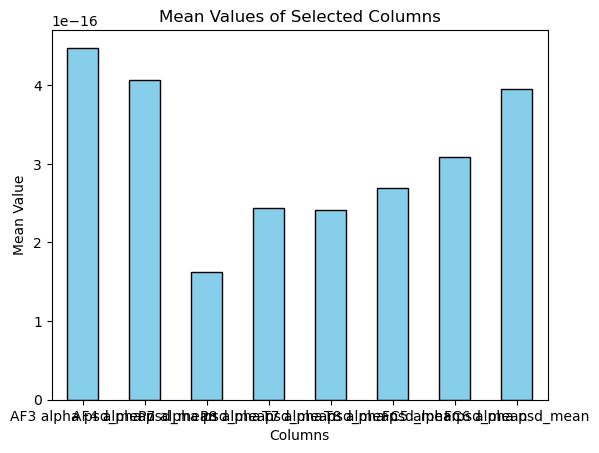

In [18]:
mean_values = df[columns_to_mean].mean()
mean_values.plot(kind='bar', rot=0, color='skyblue', edgecolor='black')
plt.xlabel('Columns')
plt.ylabel('Mean Value')
plt.title('Mean Values of Selected Columns')
plt.show()

In [19]:
print(mean_values)

AF3 alpha psd_mean    4.478716e-16
AF4 alpha psd_mean    4.062339e-16
P7 alpha psd_mean     1.625531e-16
P8 alpha psd_mean     2.441620e-16
T7 alpha psd_mean     2.405844e-16
T8 alpha psd_mean     2.695824e-16
FC5 alpha psd_mean    3.091626e-16
FC6 alpha psd_mean    3.956446e-16
dtype: float64


In [20]:
df=pd.read_csv("main_syn.csv")

In [21]:
df


,Unnamed: 0,AF3 alpha mean,AF3 alpha psd_mean,AF3 beta mean,AF3 beta psd_mean,AF4 alpha mean,AF4 alpha psd_mean,AF4 beta mean,AF4 beta psd_mean,P7 alpha mean,...,Fp2 beta psd_mean,Fpz alpha mean,Fpz alpha psd_mean,Fpz beta mean,Fpz beta psd_mean,O1 gamma mean,O1 gamma psd_mean,O2 gamma mean,O2 gamma psd_mean,task
0,0,-1.234209e-10,5.835755e-16,8.626931e-11,2.480530e-17,-4.868209e-10,6.139898e-16,-2.357428e-11,2.850148e-17,-4.460695e-10,...,2.627109e-17,-4.350041e-10,6.189793e-16,4.292408e-11,2.418235e-17,-9.218526e-12,7.469438e-19,6.413911e-12,7.755573e-19,syn
1,1,-1.965114e-10,7.637409e-16,-1.446261e-11,2.013617e-17,-2.158502e-10,7.880605e-16,-1.126985e-10,2.189538e-17,-1.350438e-10,...,2.042605e-17,-7.421432e-11,7.742777e-16,-8.257470e-11,2.048001e-17,-6.642992e-11,3.734154e-19,-4.270474e-11,5.839003e-19,syn
2,2,-4.993310e-11,8.741939e-16,-5.646477e-11,6.072227e-18,-1.892014e-10,8.721920e-16,-1.015070e-10,6.266062e-18,1.681699e-12,...,6.608201e-18,1.337527e-11,8.852896e-16,-2.663222e-11,6.309775e-18,1.346601e-11,9.000208e-19,-3.739915e-11,2.378463e-18,syn
3,3,4.231512e-10,3.911875e-16,4.374723e-11,2.110377e-17,4.298605e-10,4.100043e-16,1.273237e-10,2.062264e-17,3.220579e-10,...,1.862973e-17,4.668211e-10,4.010663e-16,1.108412e-10,1.938712e-17,-3.761283e-10,1.090512e-17,-3.857390e-11,7.937103e-19,syn
4,4,-7.616775e-10,4.497852e-16,-1.340900e-10,1.354855e-16,-7.469075e-10,4.581505e-16,-1.105409e-10,1.408442e-16,-1.521248e-10,...,1.455974e-16,-6.761241e-10,4.864915e-16,-1.308083e-10,1.433334e-16,-3.457981e-11,9.182013e-19,-1.200232e-11,1.658331e-18,syn
5,5,3.288995e-10,7.229660e-16,1.606532e-10,2.823650e-17,9.000252e-10,7.736956e-16,2.216980e-10,3.464487e-17,1.133368e-10,...,3.010779e-17,3.650331e-10,7.355986e-16,1.332561e-10,2.972186e-17,1.738258e-12,2.792363e-19,9.154189e-12,4.412054e-19,syn
6,6,-3.181805e-10,3.144850e-16,-4.397132e-11,1.106732e-17,-4.517513e-11,2.881519e-16,2.661766e-11,1.021192e-17,-4.899657e-10,...,1.017707e-17,-2.086440e-10,3.126937e-16,-7.035249e-11,1.062278e-17,7.430013e-12,2.799835e-19,3.089218e-11,3.475604e-19,syn
7,7,-3.472044e-10,1.861347e-16,-9.143152e-11,1.533293e-17,-3.572433e-10,1.922614e-16,-1.096401e-10,1.574816e-17,-5.719440e-11,...,1.583144e-17,-3.626532e-10,1.865657e-16,-1.158191e-10,1.521894e-17,-4.050423e-11,2.195850e-18,9.479166e-11,5.831835e-18,syn
8,8,-4.836307e-10,1.463762e-16,-6.057227e-12,9.529278e-18,-5.647640e-10,1.789775e-16,4.804241e-11,1.248500e-17,9.497007e-11,...,1.208274e-17,-4.997515e-10,1.624686e-16,4.063321e-11,1.084634e-17,5.975980e-11,4.053926e-19,6.038006e-11,3.823864e-19,syn
9,9,6.598404e-10,5.915395e-16,4.332964e-11,1.586581e-17,7.118755e-10,5.771545e-16,-9.449923e-12,1.762636e-17,-3.435646e-10,...,1.605431e-17,6.867574e-10,5.750787e-16,4.840356e-11,1.551312e-17,7.124439e-12,1.100158e-18,-8.627181e-11,2.456868e-18,syn


In [22]:
columns_to_mean = ['AF3 alpha psd_mean','AF4 alpha psd_mean', 'P7 alpha psd_mean', 'P8 alpha psd_mean','T7 alpha psd_mean','T8 alpha psd_mean','FC5 alpha psd_mean','FC6 alpha psd_mean',]


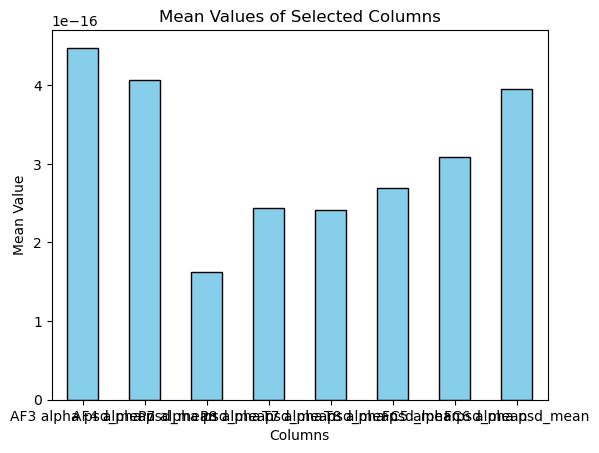

In [23]:
mean_values = df[columns_to_mean].mean()
mean_values.plot(kind='bar', rot=0, color='skyblue', edgecolor='black')
plt.xlabel('Columns')
plt.ylabel('Mean Value')
plt.title('Mean Values of Selected Columns')
plt.show()

In [24]:
df=pd.read_csv("main_syn.csv")

In [25]:
df

,Unnamed: 0,AF3 alpha mean,AF3 alpha psd_mean,AF3 beta mean,AF3 beta psd_mean,AF4 alpha mean,AF4 alpha psd_mean,AF4 beta mean,AF4 beta psd_mean,P7 alpha mean,...,Fp2 beta psd_mean,Fpz alpha mean,Fpz alpha psd_mean,Fpz beta mean,Fpz beta psd_mean,O1 gamma mean,O1 gamma psd_mean,O2 gamma mean,O2 gamma psd_mean,task
0,0,-1.234209e-10,5.835755e-16,8.626931e-11,2.480530e-17,-4.868209e-10,6.139898e-16,-2.357428e-11,2.850148e-17,-4.460695e-10,...,2.627109e-17,-4.350041e-10,6.189793e-16,4.292408e-11,2.418235e-17,-9.218526e-12,7.469438e-19,6.413911e-12,7.755573e-19,syn
1,1,-1.965114e-10,7.637409e-16,-1.446261e-11,2.013617e-17,-2.158502e-10,7.880605e-16,-1.126985e-10,2.189538e-17,-1.350438e-10,...,2.042605e-17,-7.421432e-11,7.742777e-16,-8.257470e-11,2.048001e-17,-6.642992e-11,3.734154e-19,-4.270474e-11,5.839003e-19,syn
2,2,-4.993310e-11,8.741939e-16,-5.646477e-11,6.072227e-18,-1.892014e-10,8.721920e-16,-1.015070e-10,6.266062e-18,1.681699e-12,...,6.608201e-18,1.337527e-11,8.852896e-16,-2.663222e-11,6.309775e-18,1.346601e-11,9.000208e-19,-3.739915e-11,2.378463e-18,syn
3,3,4.231512e-10,3.911875e-16,4.374723e-11,2.110377e-17,4.298605e-10,4.100043e-16,1.273237e-10,2.062264e-17,3.220579e-10,...,1.862973e-17,4.668211e-10,4.010663e-16,1.108412e-10,1.938712e-17,-3.761283e-10,1.090512e-17,-3.857390e-11,7.937103e-19,syn
4,4,-7.616775e-10,4.497852e-16,-1.340900e-10,1.354855e-16,-7.469075e-10,4.581505e-16,-1.105409e-10,1.408442e-16,-1.521248e-10,...,1.455974e-16,-6.761241e-10,4.864915e-16,-1.308083e-10,1.433334e-16,-3.457981e-11,9.182013e-19,-1.200232e-11,1.658331e-18,syn
5,5,3.288995e-10,7.229660e-16,1.606532e-10,2.823650e-17,9.000252e-10,7.736956e-16,2.216980e-10,3.464487e-17,1.133368e-10,...,3.010779e-17,3.650331e-10,7.355986e-16,1.332561e-10,2.972186e-17,1.738258e-12,2.792363e-19,9.154189e-12,4.412054e-19,syn
6,6,-3.181805e-10,3.144850e-16,-4.397132e-11,1.106732e-17,-4.517513e-11,2.881519e-16,2.661766e-11,1.021192e-17,-4.899657e-10,...,1.017707e-17,-2.086440e-10,3.126937e-16,-7.035249e-11,1.062278e-17,7.430013e-12,2.799835e-19,3.089218e-11,3.475604e-19,syn
7,7,-3.472044e-10,1.861347e-16,-9.143152e-11,1.533293e-17,-3.572433e-10,1.922614e-16,-1.096401e-10,1.574816e-17,-5.719440e-11,...,1.583144e-17,-3.626532e-10,1.865657e-16,-1.158191e-10,1.521894e-17,-4.050423e-11,2.195850e-18,9.479166e-11,5.831835e-18,syn
8,8,-4.836307e-10,1.463762e-16,-6.057227e-12,9.529278e-18,-5.647640e-10,1.789775e-16,4.804241e-11,1.248500e-17,9.497007e-11,...,1.208274e-17,-4.997515e-10,1.624686e-16,4.063321e-11,1.084634e-17,5.975980e-11,4.053926e-19,6.038006e-11,3.823864e-19,syn
9,9,6.598404e-10,5.915395e-16,4.332964e-11,1.586581e-17,7.118755e-10,5.771545e-16,-9.449923e-12,1.762636e-17,-3.435646e-10,...,1.605431e-17,6.867574e-10,5.750787e-16,4.840356e-11,1.551312e-17,7.124439e-12,1.100158e-18,-8.627181e-11,2.456868e-18,syn


In [26]:
columns_to_mean = ['AF3 alpha psd_mean','AF4 alpha psd_mean', 'P7 alpha psd_mean', 'P8 alpha psd_mean','T7 alpha psd_mean','T8 alpha psd_mean','FC5 alpha psd_mean','FC6 alpha psd_mean',]


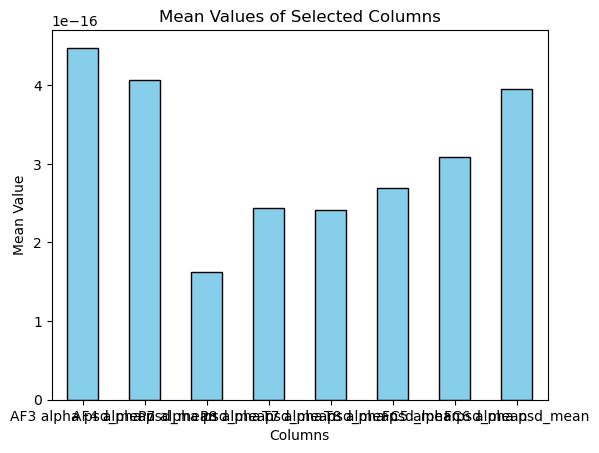

In [27]:
mean_values = df[columns_to_mean].mean()
mean_values.plot(kind='bar', rot=0, color='skyblue', edgecolor='black')
plt.xlabel('Columns')
plt.ylabel('Mean Value')
plt.title('Mean Values of Selected Columns')
plt.show()

In [28]:
print(mean_values)

AF3 alpha psd_mean    4.478716e-16
AF4 alpha psd_mean    4.062339e-16
P7 alpha psd_mean     1.625531e-16
P8 alpha psd_mean     2.441620e-16
T7 alpha psd_mean     2.405844e-16
T8 alpha psd_mean     2.695824e-16
FC5 alpha psd_mean    3.091626e-16
FC6 alpha psd_mean    3.956446e-16
dtype: float64


In [29]:
import pandas as pd

# Assuming df is your DataFrame containing the data
data = {
    'AF3 alpha psd_mean': [4.478716e-16],
    'AF4 alpha psd_mean': [4.062339e-16],
    'P7 alpha psd_mean': [1.625531e-16],
    'P8 alpha psd_mean': [2.441620e-16],
    'T7 alpha psd_mean': [2.405844e-16],
    'T8 alpha psd_mean': [2.695824e-16],
    'FC5 alpha psd_mean': [3.091626e-16],
    'FC6 alpha psd_mean': [3.956446e-16],
}

df = pd.DataFrame(data)

# Calculate the median along the columns
median_values = df.median()

# Print the result
print(median_values)


AF3 alpha psd_mean    4.478716e-16
AF4 alpha psd_mean    4.062339e-16
P7 alpha psd_mean     1.625531e-16
P8 alpha psd_mean     2.441620e-16
T7 alpha psd_mean     2.405844e-16
T8 alpha psd_mean     2.695824e-16
FC5 alpha psd_mean    3.091626e-16
FC6 alpha psd_mean    3.956446e-16
dtype: float64


In [30]:
df=pd.read_csv("main_vip.csv")

In [31]:
df

,Unnamed: 0,AF3 alpha mean,AF3 alpha psd_mean,AF3 beta mean,AF3 beta psd_mean,AF4 alpha mean,AF4 alpha psd_mean,AF4 beta mean,AF4 beta psd_mean,P7 alpha mean,...,Fp2 beta psd_mean,Fpz alpha mean,Fpz alpha psd_mean,Fpz beta mean,Fpz beta psd_mean,O1 gamma mean,O1 gamma psd_mean,O2 gamma mean,O2 gamma psd_mean,task
0,0,-1.234209e-10,5.835755e-16,8.626931e-11,2.480530e-17,-4.868209e-10,6.139898e-16,-2.357428e-11,2.850148e-17,-4.460695e-10,...,2.627109e-17,-4.350041e-10,6.189793e-16,4.292408e-11,2.418235e-17,-9.218526e-12,7.469438e-19,6.413911e-12,7.755573e-19,vip
1,1,-1.965114e-10,7.637409e-16,-1.446261e-11,2.013617e-17,-2.158502e-10,7.880605e-16,-1.126985e-10,2.189538e-17,-1.350438e-10,...,2.042605e-17,-7.421432e-11,7.742777e-16,-8.257470e-11,2.048001e-17,-6.642992e-11,3.734154e-19,-4.270474e-11,5.839003e-19,vip
2,2,-4.993310e-11,8.741939e-16,-5.646477e-11,6.072227e-18,-1.892014e-10,8.721920e-16,-1.015070e-10,6.266062e-18,1.681699e-12,...,6.608201e-18,1.337527e-11,8.852896e-16,-2.663222e-11,6.309775e-18,1.346601e-11,9.000208e-19,-3.739915e-11,2.378463e-18,vip
3,3,4.231512e-10,3.911875e-16,4.374723e-11,2.110377e-17,4.298605e-10,4.100043e-16,1.273237e-10,2.062264e-17,3.220579e-10,...,1.862973e-17,4.668211e-10,4.010663e-16,1.108412e-10,1.938712e-17,-3.761283e-10,1.090512e-17,-3.857390e-11,7.937103e-19,vip
4,4,-7.616775e-10,4.497852e-16,-1.340900e-10,1.354855e-16,-7.469075e-10,4.581505e-16,-1.105409e-10,1.408442e-16,-1.521248e-10,...,1.455974e-16,-6.761241e-10,4.864915e-16,-1.308083e-10,1.433334e-16,-3.457981e-11,9.182013e-19,-1.200232e-11,1.658331e-18,vip
5,5,3.288995e-10,7.229660e-16,1.606532e-10,2.823650e-17,9.000252e-10,7.736956e-16,2.216980e-10,3.464487e-17,1.133368e-10,...,3.010779e-17,3.650331e-10,7.355986e-16,1.332561e-10,2.972186e-17,1.738258e-12,2.792363e-19,9.154189e-12,4.412054e-19,vip
6,6,-3.181805e-10,3.144850e-16,-4.397132e-11,1.106732e-17,-4.517513e-11,2.881519e-16,2.661766e-11,1.021192e-17,-4.899657e-10,...,1.017707e-17,-2.086440e-10,3.126937e-16,-7.035249e-11,1.062278e-17,7.430013e-12,2.799835e-19,3.089218e-11,3.475604e-19,vip
7,7,-3.472044e-10,1.861347e-16,-9.143152e-11,1.533293e-17,-3.572433e-10,1.922614e-16,-1.096401e-10,1.574816e-17,-5.719440e-11,...,1.583144e-17,-3.626532e-10,1.865657e-16,-1.158191e-10,1.521894e-17,-4.050423e-11,2.195850e-18,9.479166e-11,5.831835e-18,vip
8,8,-4.836307e-10,1.463762e-16,-6.057227e-12,9.529278e-18,-5.647640e-10,1.789775e-16,4.804241e-11,1.248500e-17,9.497007e-11,...,1.208274e-17,-4.997515e-10,1.624686e-16,4.063321e-11,1.084634e-17,5.975980e-11,4.053926e-19,6.038006e-11,3.823864e-19,vip
9,9,6.598404e-10,5.915395e-16,4.332964e-11,1.586581e-17,7.118755e-10,5.771545e-16,-9.449923e-12,1.762636e-17,-3.435646e-10,...,1.605431e-17,6.867574e-10,5.750787e-16,4.840356e-11,1.551312e-17,7.124439e-12,1.100158e-18,-8.627181e-11,2.456868e-18,vip


In [32]:
columns_to_mean = ['AF3 alpha psd_mean','AF4 alpha psd_mean', 'P7 alpha psd_mean', 'P8 alpha psd_mean','T7 alpha psd_mean','T8 alpha psd_mean','FC5 alpha psd_mean','FC6 alpha psd_mean',]


In [33]:
columns_to_mean1 = ['AF3 beta psd_mean','AF4 beta psd_mean', 'P7 beta psd_mean', 'P8 beta psd_mean','T7 beta psd_mean','T8 beta psd_mean','FC5 beta psd_mean','FC6 beta psd_mean',]


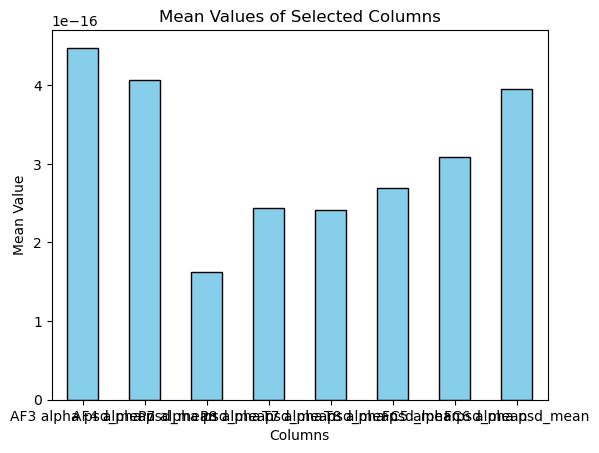

In [34]:
mean_values = df[columns_to_mean].mean()
mean_values.plot(kind='bar', rot=0, color='skyblue', edgecolor='black')
plt.xlabel('Columns')
plt.ylabel('Mean Value')
plt.title('Mean Values of Selected Columns')
plt.show()

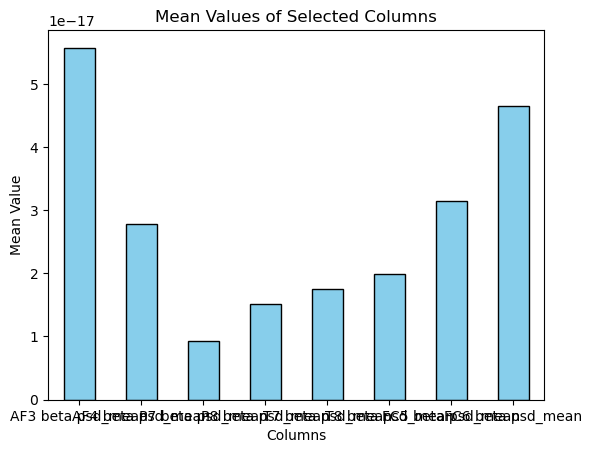

In [35]:
mean_values = df[columns_to_mean1].mean()
mean_values.plot(kind='bar', rot=0, color='skyblue', edgecolor='black')
plt.xlabel('Columns')
plt.ylabel('Mean Value')
plt.title('Mean Values of Selected Columns')
plt.show()

In [36]:
df=pd.read_csv("merged_meditation_dataset.csv")

In [37]:
df

,Unnamed: 0,AF3 alpha mean,AF3 alpha psd_mean,AF3 beta mean,AF3 beta psd_mean,AF4 alpha mean,AF4 alpha psd_mean,AF4 beta mean,AF4 beta psd_mean,P7 alpha mean,...,Fp2 beta psd_mean,Fpz alpha mean,Fpz alpha psd_mean,Fpz beta mean,Fpz beta psd_mean,O1 gamma mean,O1 gamma psd_mean,O2 gamma mean,O2 gamma psd_mean,task
0,0,-1.234209e-10,5.835755e-16,8.626931e-11,2.480530e-17,-4.868209e-10,6.139898e-16,-2.357428e-11,2.850148e-17,-4.460695e-10,...,2.627109e-17,-4.350041e-10,6.189793e-16,4.292408e-11,2.418235e-17,-9.218526e-12,7.469438e-19,6.413911e-12,7.755573e-19,ctrl
1,1,-1.965114e-10,7.637409e-16,-1.446261e-11,2.013617e-17,-2.158502e-10,7.880605e-16,-1.126985e-10,2.189538e-17,-1.350438e-10,...,2.042605e-17,-7.421432e-11,7.742777e-16,-8.257470e-11,2.048001e-17,-6.642992e-11,3.734154e-19,-4.270474e-11,5.839003e-19,ctrl
2,2,-4.993310e-11,8.741939e-16,-5.646477e-11,6.072227e-18,-1.892014e-10,8.721920e-16,-1.015070e-10,6.266062e-18,1.681699e-12,...,6.608201e-18,1.337527e-11,8.852896e-16,-2.663222e-11,6.309775e-18,1.346601e-11,9.000208e-19,-3.739915e-11,2.378463e-18,ctrl
3,3,4.231512e-10,3.911875e-16,4.374723e-11,2.110377e-17,4.298605e-10,4.100043e-16,1.273237e-10,2.062264e-17,3.220579e-10,...,1.862973e-17,4.668211e-10,4.010663e-16,1.108412e-10,1.938712e-17,-3.761283e-10,1.090512e-17,-3.857390e-11,7.937103e-19,ctrl
4,4,-7.616775e-10,4.497852e-16,-1.340900e-10,1.354855e-16,-7.469075e-10,4.581505e-16,-1.105409e-10,1.408442e-16,-1.521248e-10,...,1.455974e-16,-6.761241e-10,4.864915e-16,-1.308083e-10,1.433334e-16,-3.457981e-11,9.182013e-19,-1.200232e-11,1.658331e-18,ctrl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,22,1.754557e-10,4.621449e-17,-4.768297e-11,9.308643e-18,5.367510e-11,5.488037e-17,-3.011026e-11,1.122788e-17,3.826507e-10,...,1.147843e-17,1.240344e-10,5.469775e-17,-6.000703e-11,1.076173e-17,-6.857147e-11,8.349057e-19,-3.790397e-11,1.468286e-18,vip
85,23,3.924739e-11,1.235858e-16,7.263216e-11,3.509472e-18,-3.288455e-11,1.265631e-16,6.074246e-11,4.743107e-18,7.131992e-12,...,3.979521e-18,1.124213e-10,1.289331e-16,9.382000e-11,3.683342e-18,2.834881e-11,5.841110e-19,-1.109379e-09,7.509942e-16,vip
86,24,-1.917338e-09,2.040536e-15,-2.615797e-10,9.710435e-16,-1.376577e-09,4.880977e-16,-3.854965e-10,1.848302e-16,-5.739638e-10,...,2.098192e-15,-2.923785e-10,3.005607e-15,4.035961e-10,1.283045e-15,9.993402e-12,2.919981e-18,3.028076e-12,3.740625e-18,vip
87,25,-6.876219e-11,1.155988e-15,5.708166e-10,2.917419e-17,1.130920e-10,1.174721e-15,4.917589e-10,3.651917e-17,-1.739053e-10,...,3.328693e-17,-4.622219e-10,1.187404e-15,4.210573e-10,3.033169e-17,2.128052e-11,4.120105e-19,3.583396e-11,6.269687e-19,vip


C:\Users\admin\AppData\Local\Temp\ipykernel_11248\149031421.py:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='task', y='AF3 alpha psd_mean', data=df, ci=None)  # ci=None disables error bars


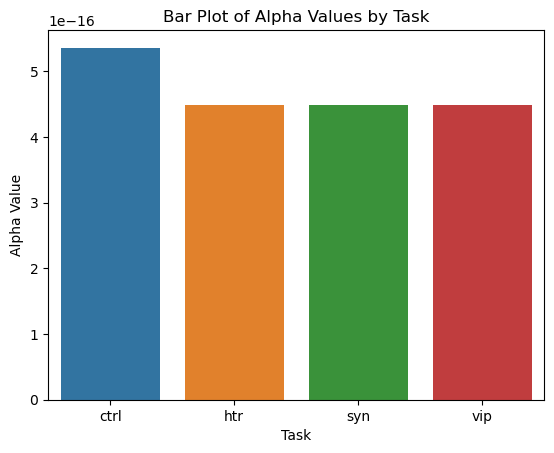

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.barplot(x='task', y='AF3 alpha psd_mean', data=df, ci=None)  # ci=None disables error bars
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Bar Plot of Alpha Values by Task')
plt.show()


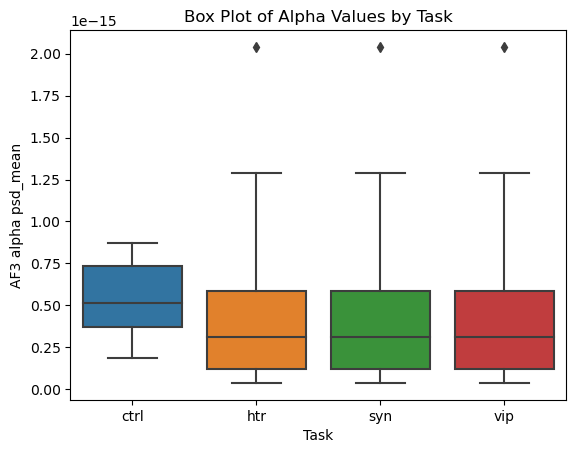

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('AF3 alpha psd_mean')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


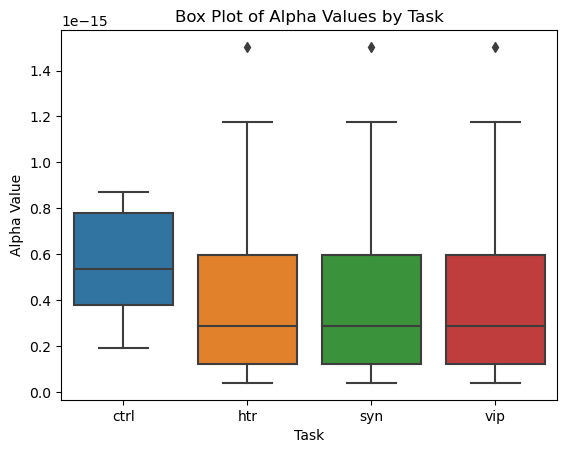

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='AF4 alpha psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


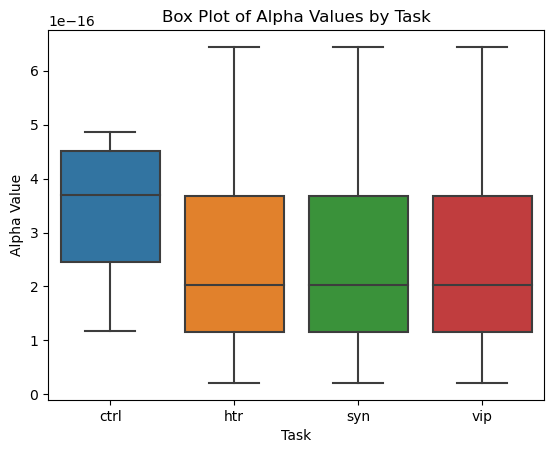

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='T7 alpha psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


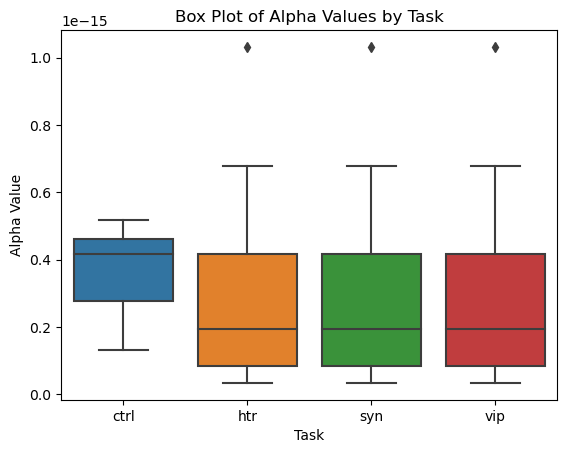

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='T8 alpha psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


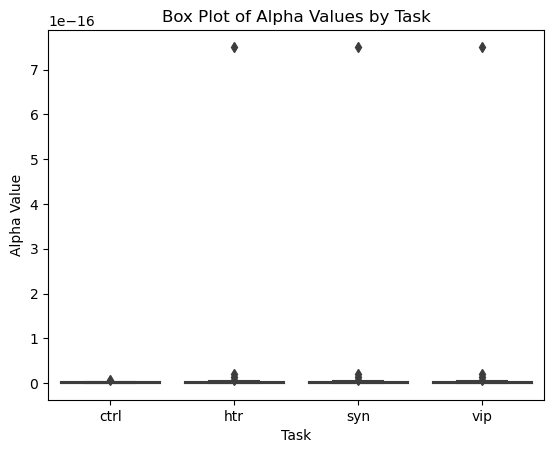

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='O2 gamma psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


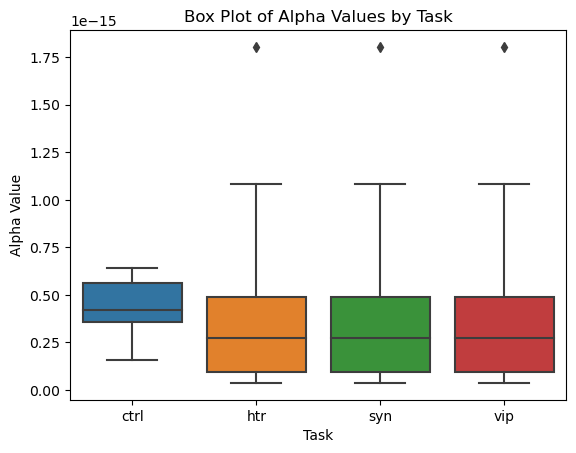

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


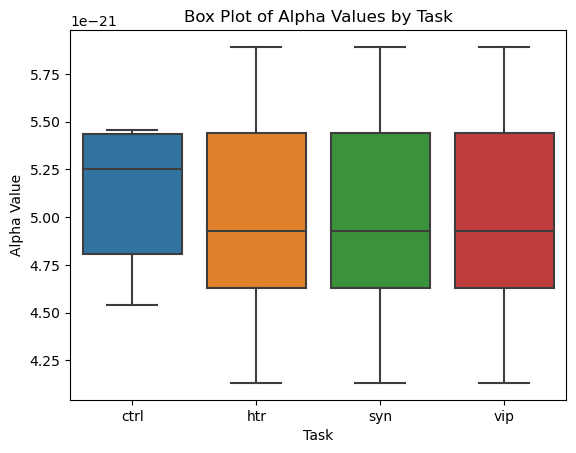

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='Fp1 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


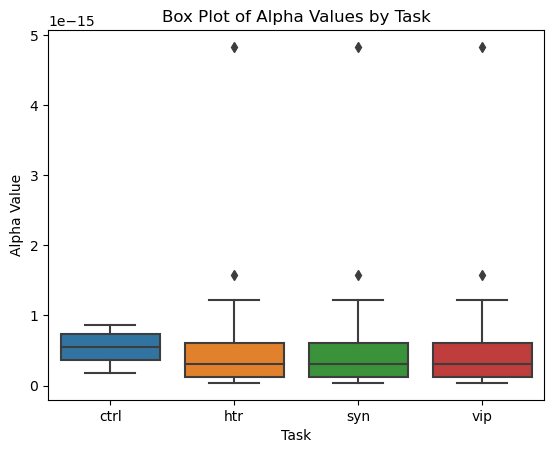

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


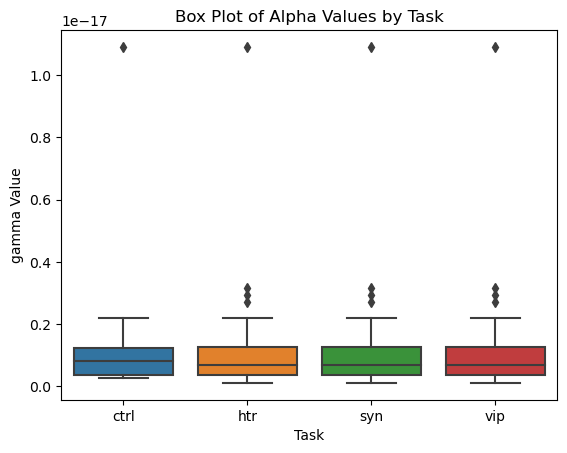

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='O1 gamma psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('gamma Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


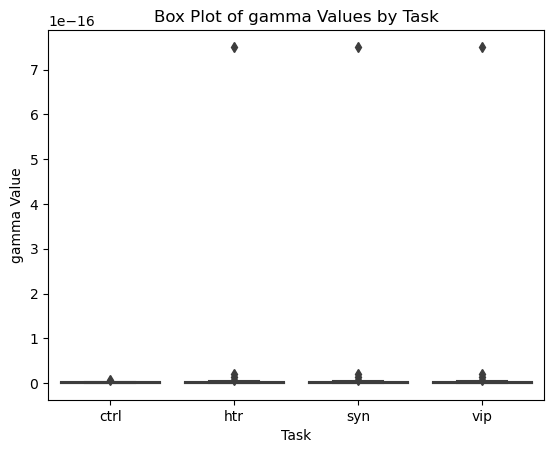

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='O2 gamma psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('gamma Value')
plt.title('Box Plot of gamma Values by Task')
plt.show()


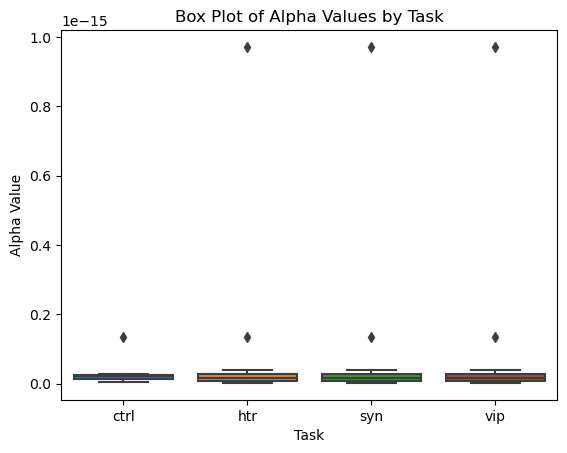

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='AF3 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


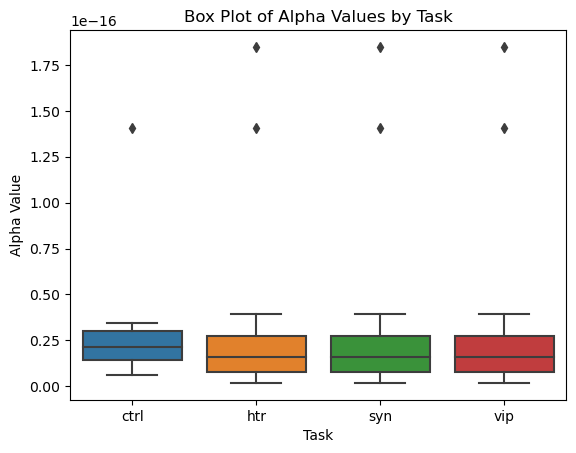

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='AF4 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


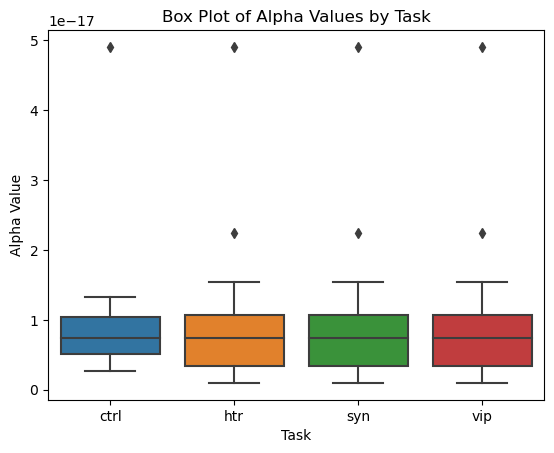

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='P7 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


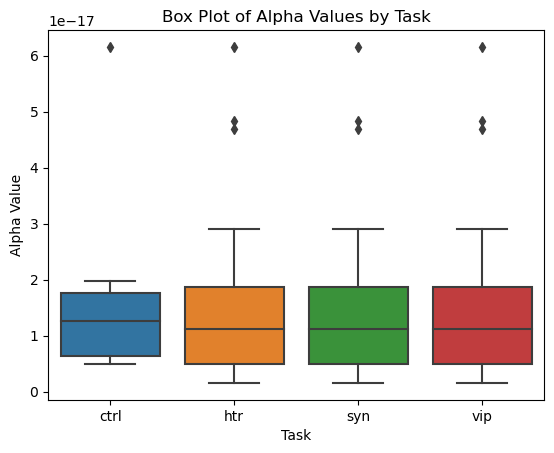

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='P8 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


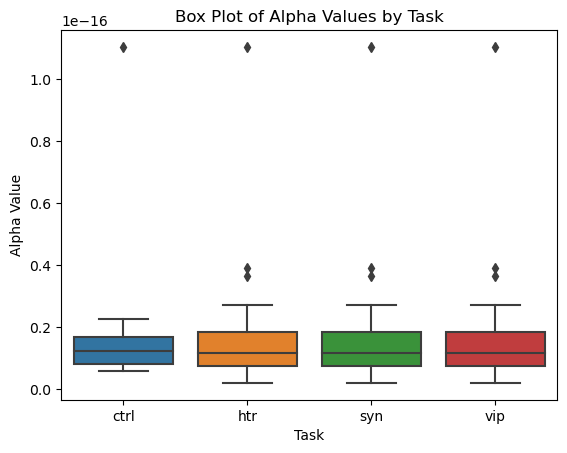

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='T7 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


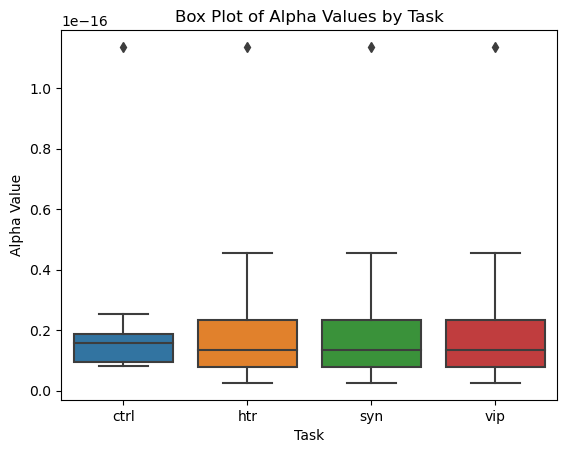

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='T8 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


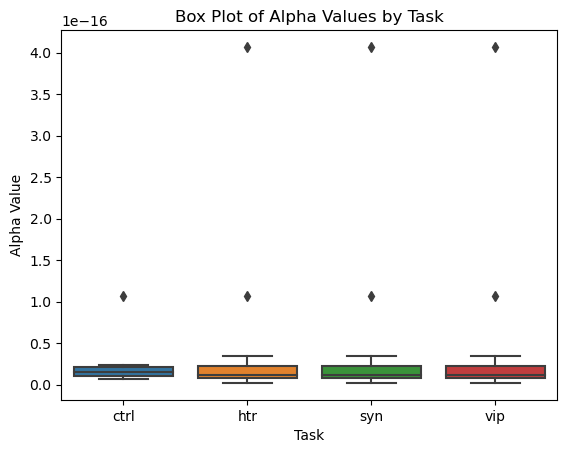

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='FC5 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


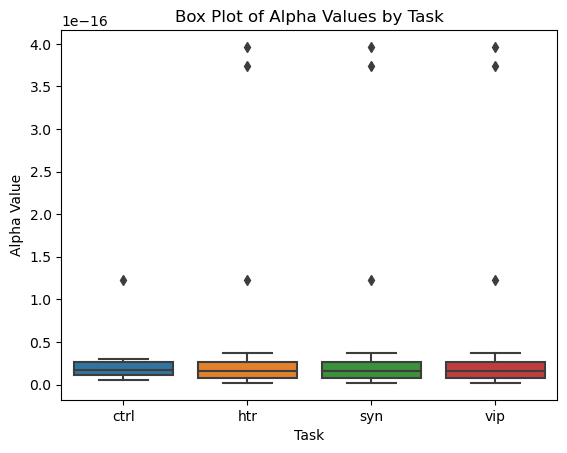

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='FC6 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


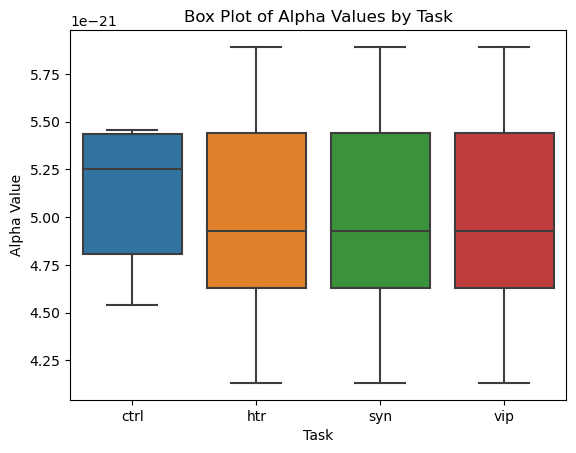

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='Fp1 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


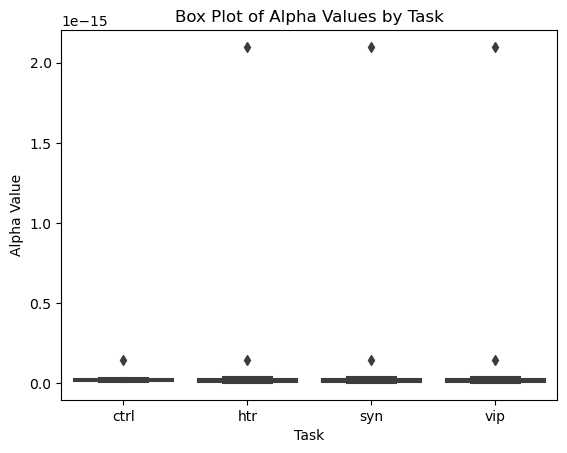

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='Fp2 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


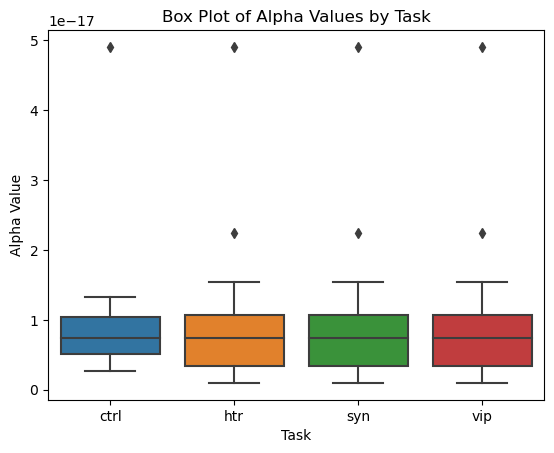

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='P7 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


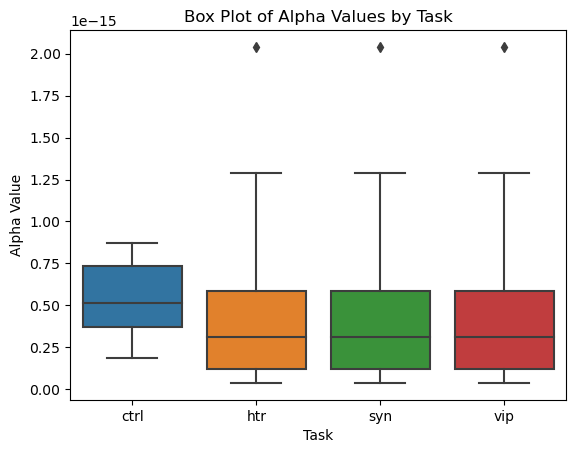

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('Alpha Value')
plt.title('Box Plot of Alpha Values by Task')
plt.show()


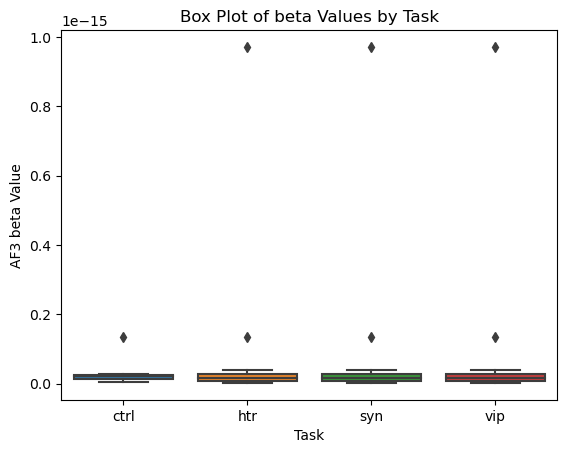

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='AF3 beta psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('AF3 beta Value')
plt.title('Box Plot of beta Values by Task')
plt.show()


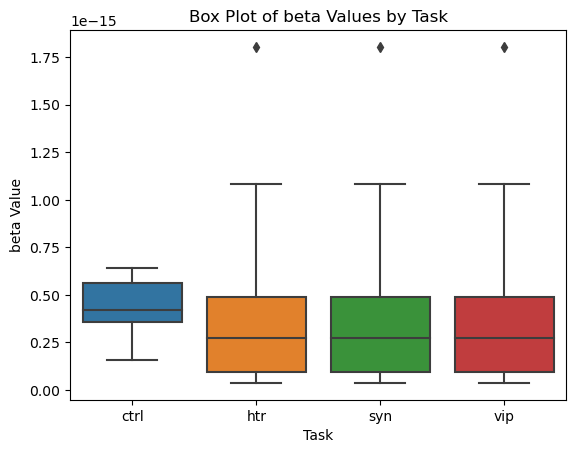

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_meditation_dataset.csv')

# Assuming 'task' is a categorical column and 'alpha' is the alpha values column
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=df)
plt.xlabel('Task')
plt.ylabel('beta Value')
plt.title('Box Plot of beta Values by Task')
plt.show()


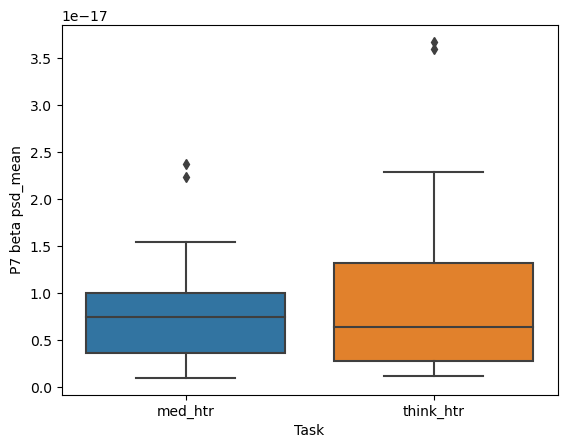

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 beta psd_mean')

plt.show()


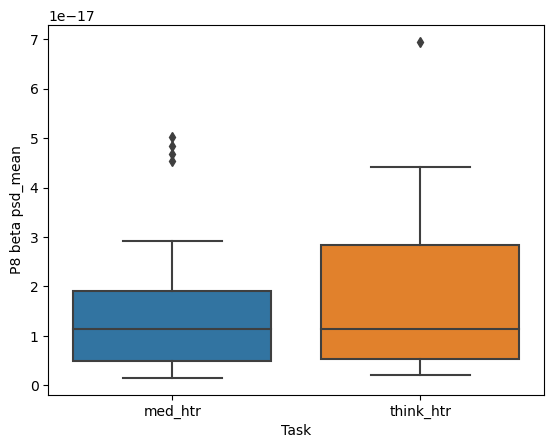

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 beta psd_mean')

plt.show()


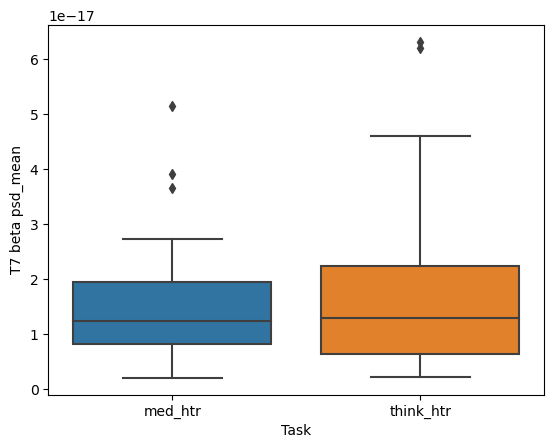

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T7 beta psd_mean')

plt.show()

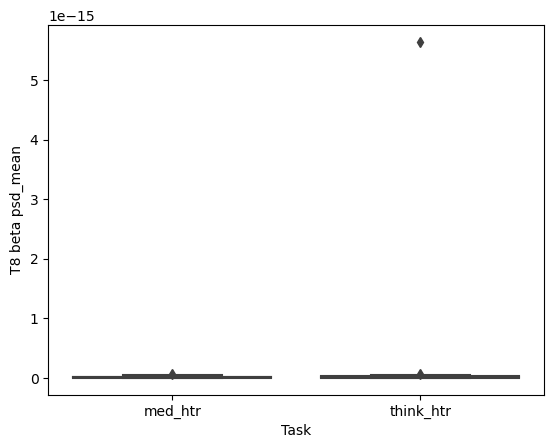

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T8 beta psd_mean')

plt.show()

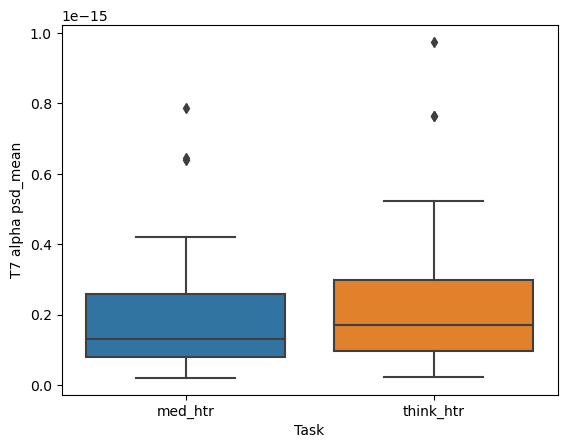

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T7 alpha psd_mean')

plt.show()


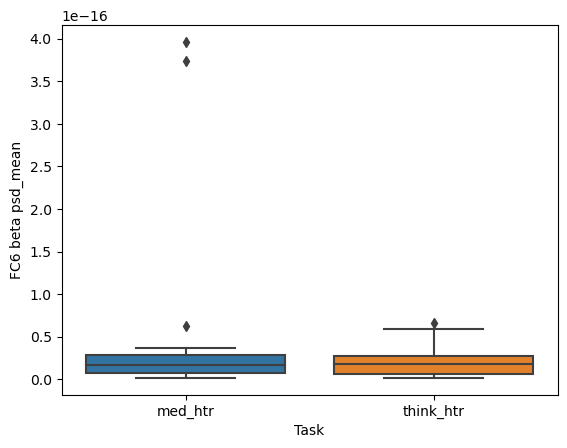

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC6 beta psd_mean')

plt.show()

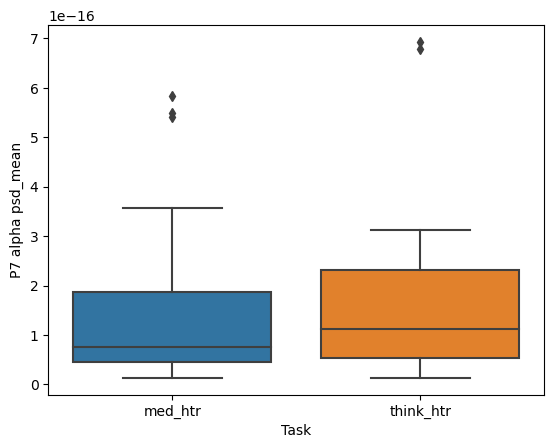

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 alpha psd_mean')

plt.show()

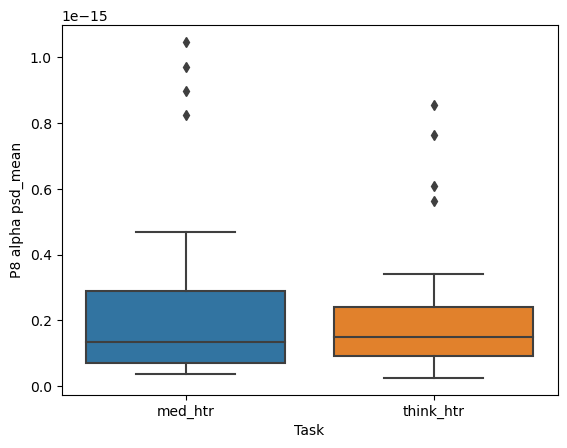

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 alpha psd_mean')

plt.show()

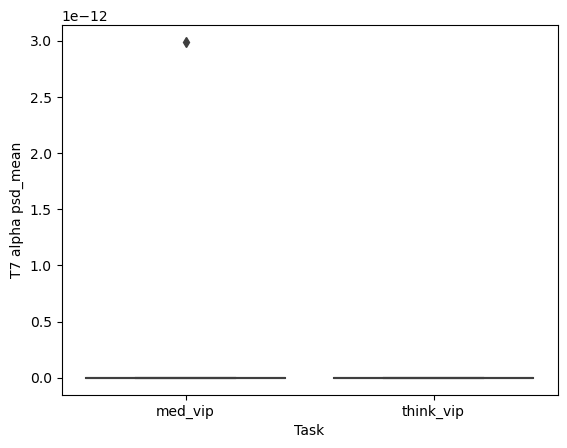

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T7 alpha psd_mean')

plt.show()

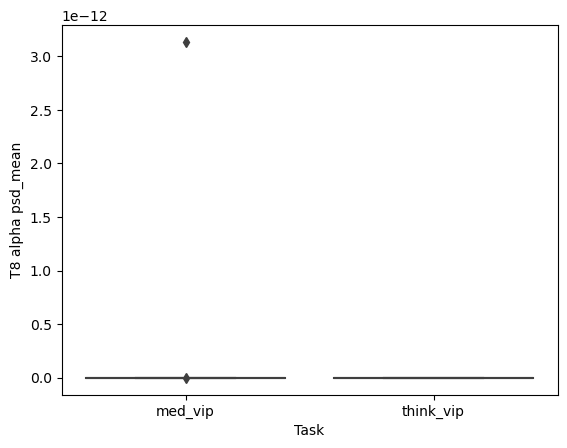

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T8 alpha psd_mean')

plt.show()

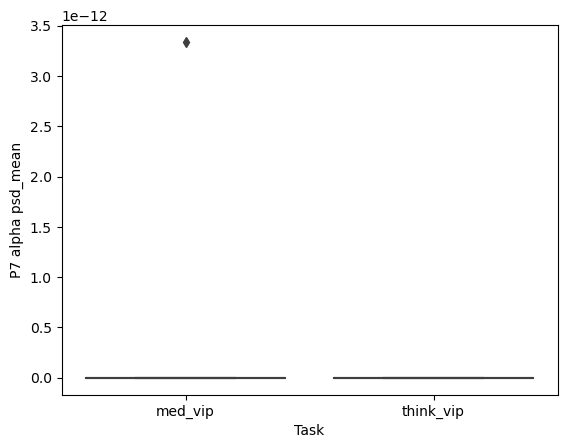

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 alpha psd_mean')

plt.show()

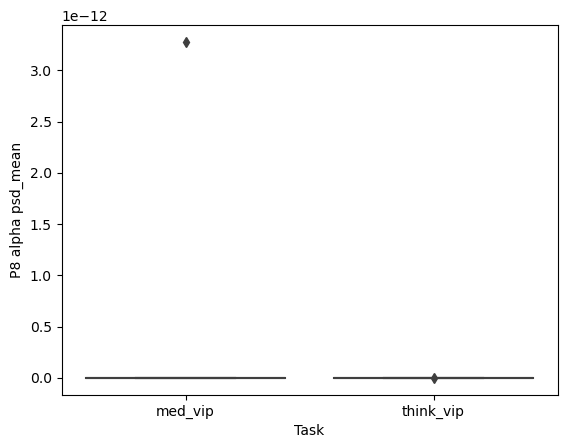

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 alpha psd_mean')

plt.show()

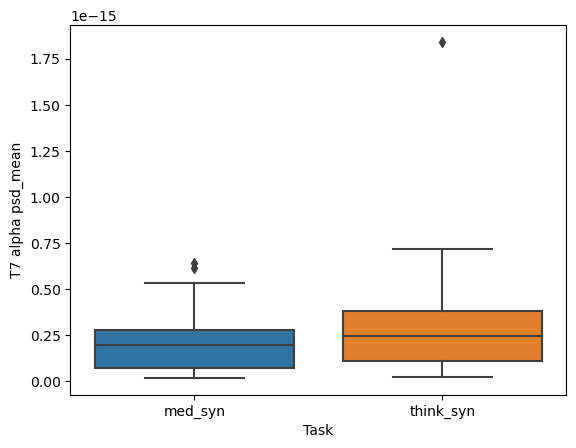

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T7 alpha psd_mean')

plt.show()

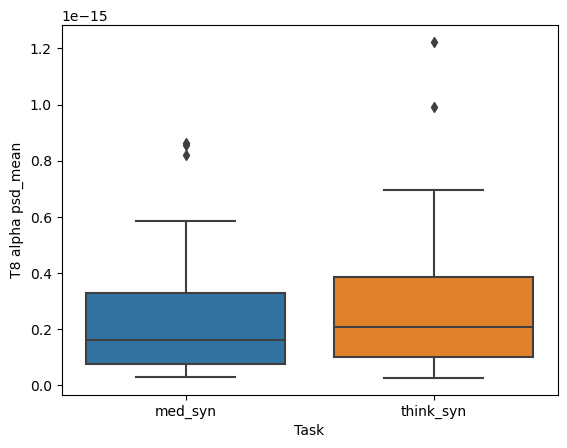

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T8 alpha psd_mean')

plt.show()

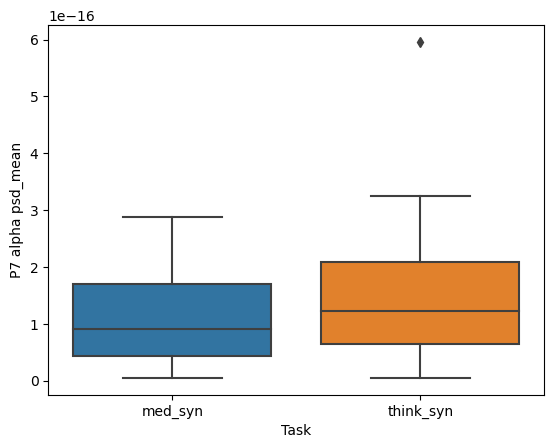

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 alpha psd_mean')

plt.show()

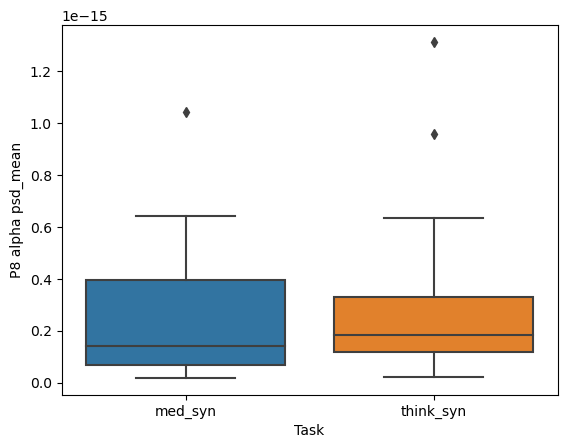

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 alpha psd_mean')

plt.show()

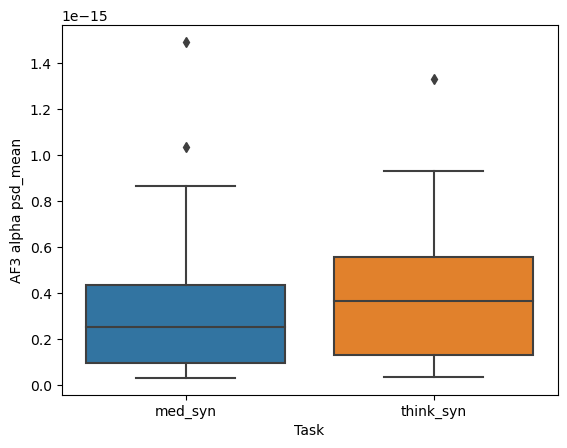

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF3 alpha psd_mean')

plt.show()

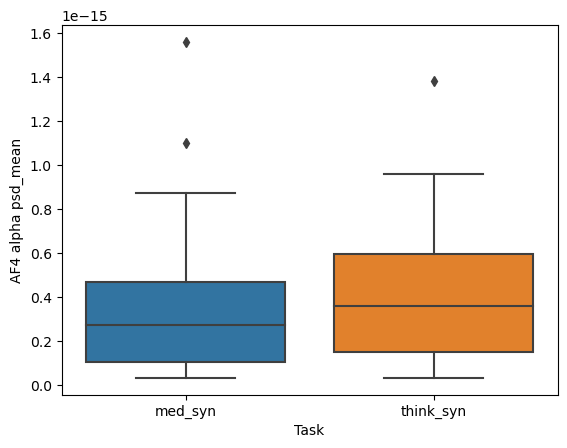

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF4 alpha psd_mean')

plt.show()

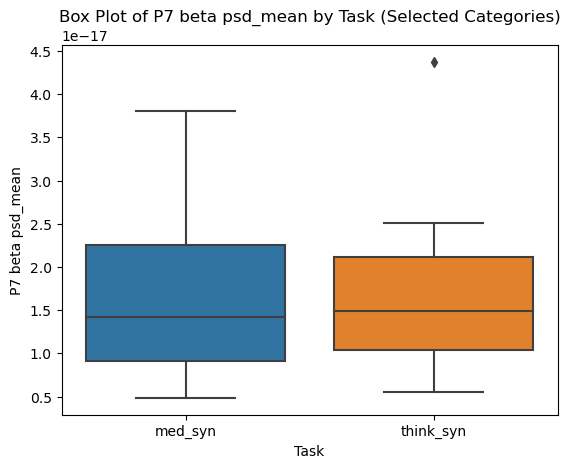

In [71]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fpz beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fpz beta psd_mean')
plt.title('Box Plot of P7 beta psd_mean by Task (Selected Categories)')
plt.show()

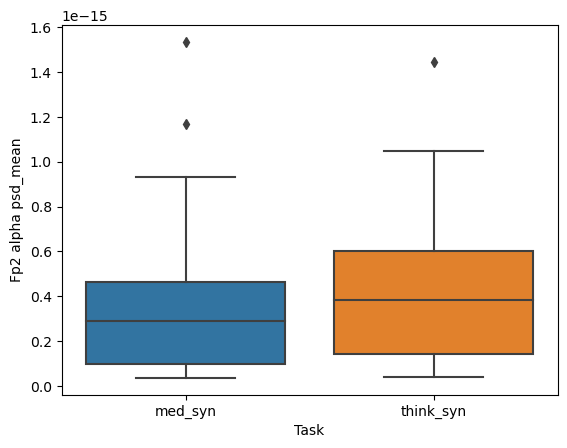

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp2 alpha psd_mean')

plt.show()

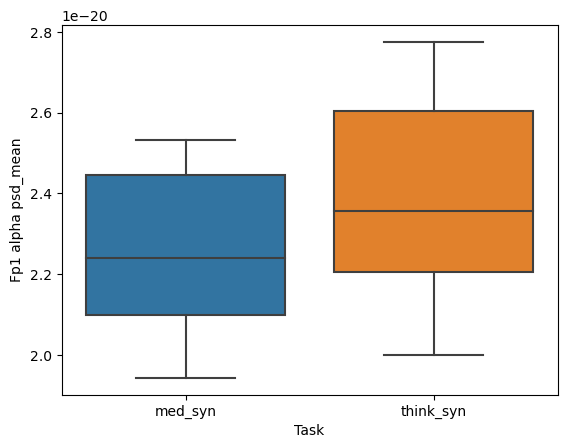

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp1 alpha psd_mean')

plt.show()

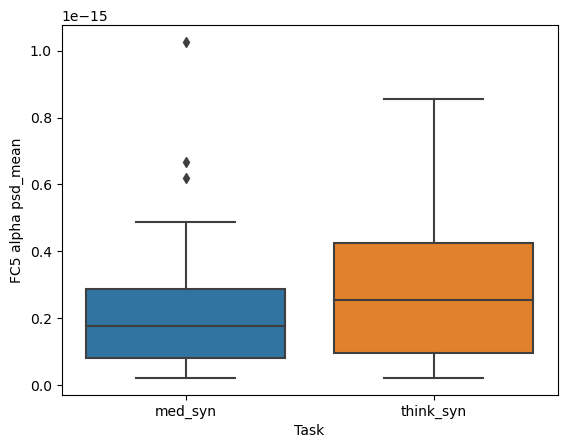

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC5 alpha psd_mean')

plt.show()

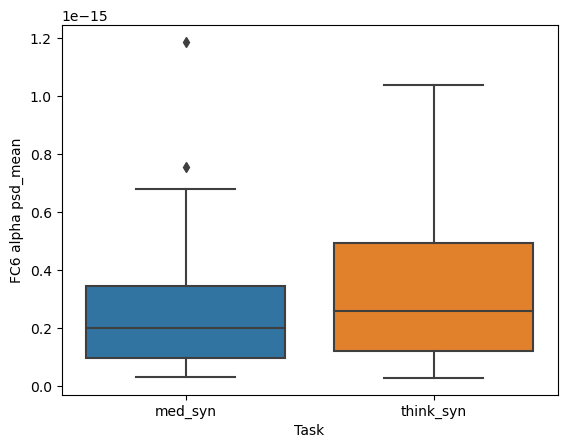

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC6 alpha psd_mean')

plt.show()

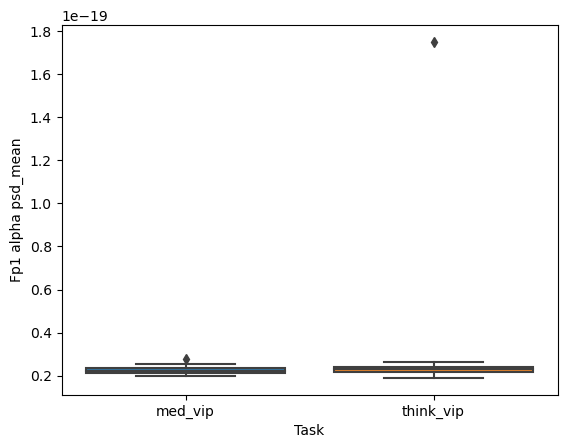

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp1 alpha psd_mean')

plt.show()

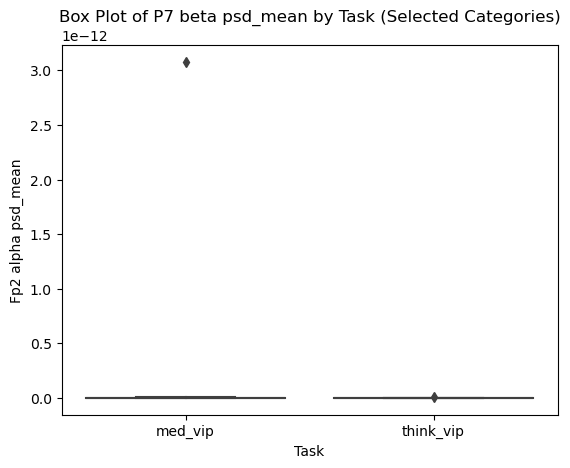

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp2 alpha psd_mean')

plt.show()

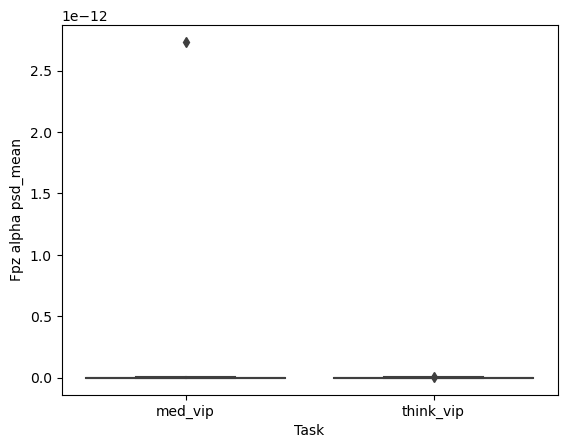

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fpz alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fpz alpha psd_mean')

plt.show()

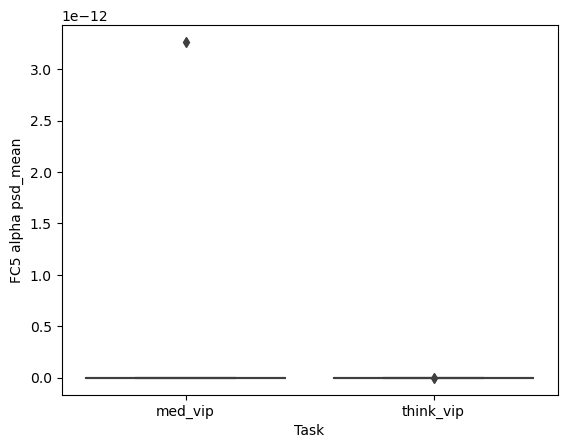

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC5 alpha psd_mean')

plt.show()

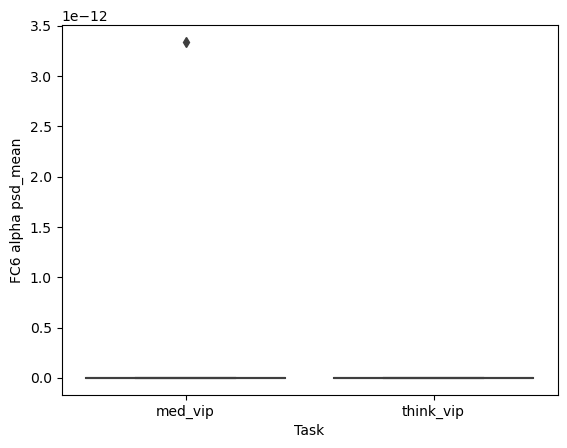

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC6 alpha psd_mean')

plt.show()

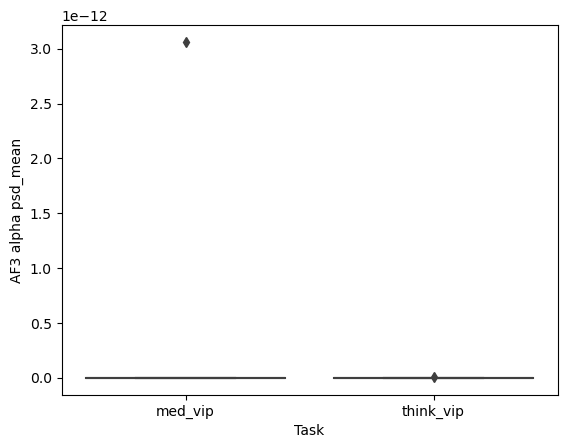

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF3 alpha psd_mean')

plt.show()

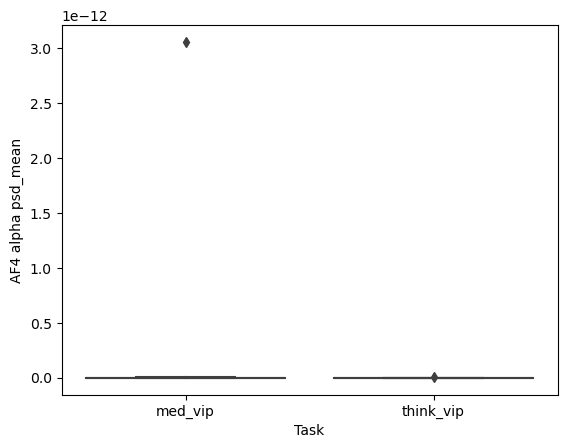

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF4 alpha psd_mean')

plt.show()

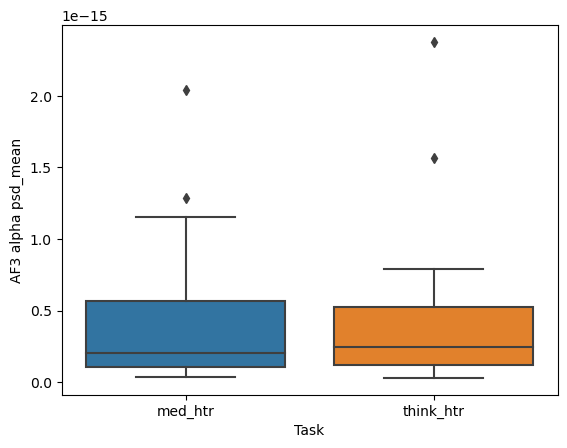

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF3 alpha psd_mean')

plt.show()

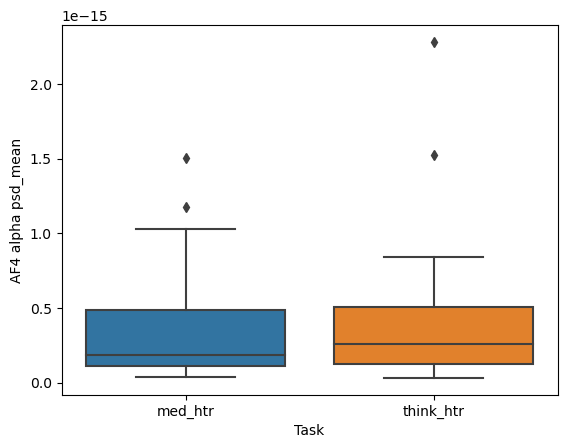

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF4 alpha psd_mean')

plt.show()

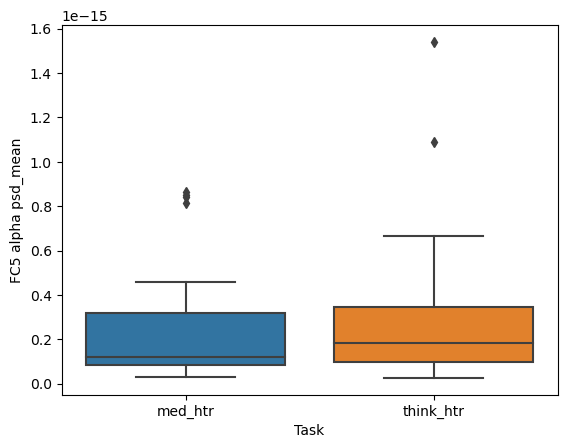

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC5 alpha psd_mean')

plt.show()

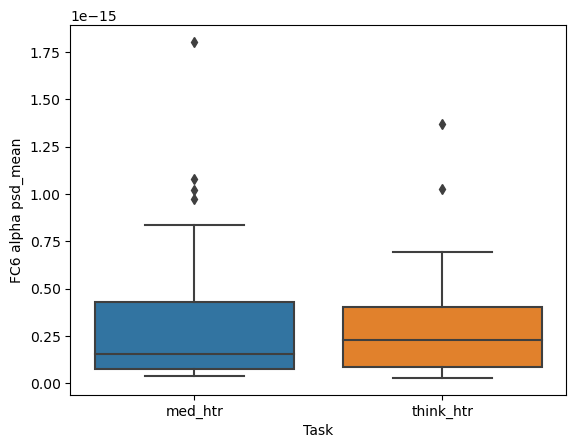

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC6 alpha psd_mean')

plt.show()

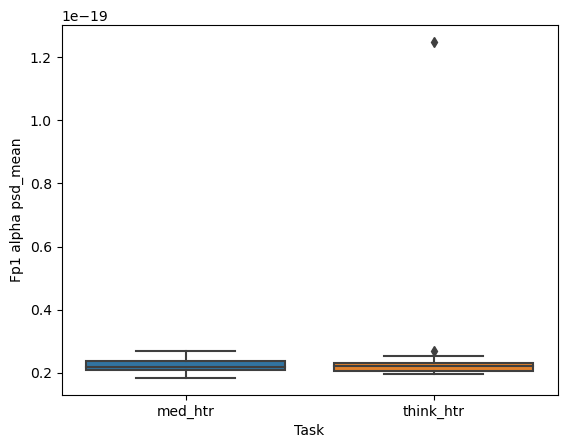

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp1 alpha psd_mean')

plt.show()

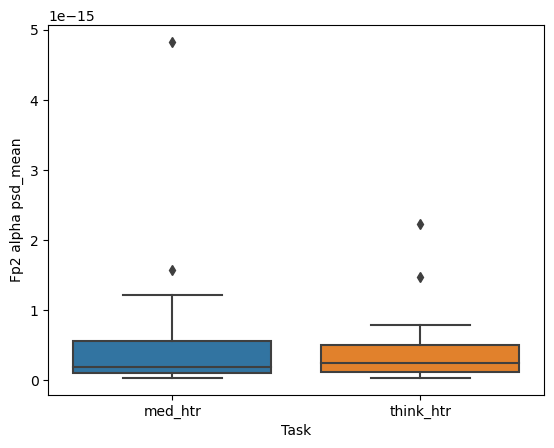

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp2 alpha psd_mean')

plt.show()

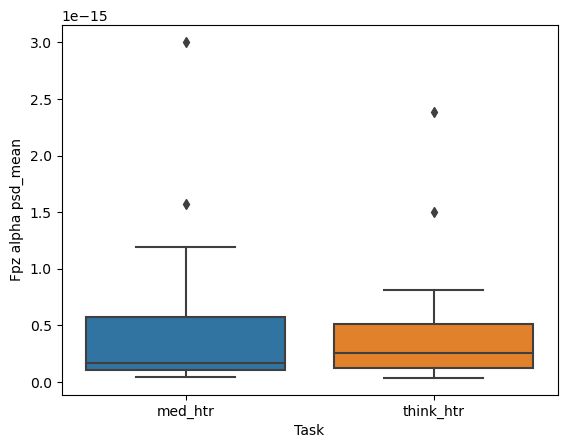

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr', 'think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fpz alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fpz alpha psd_mean')

plt.show()

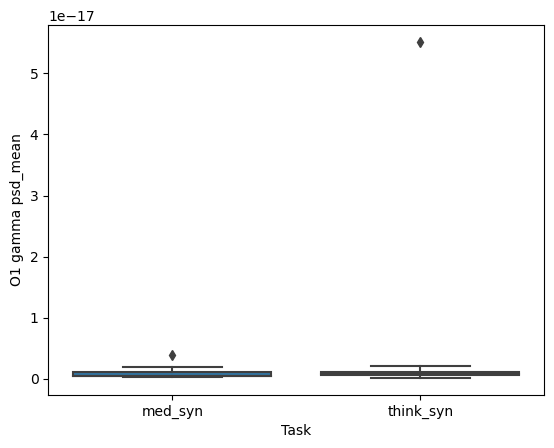

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]


# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')

plt.show()

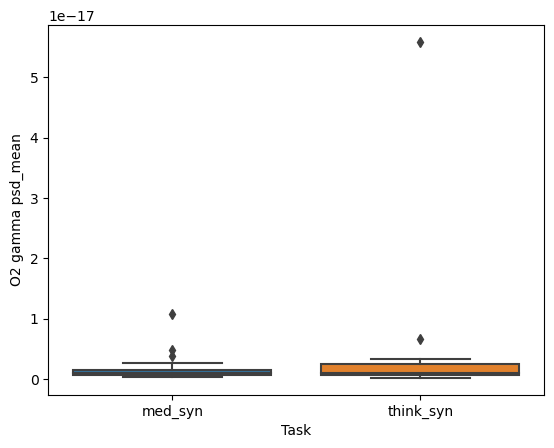

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn', 'think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O2 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O2 gamma psd_mean')

plt.show()

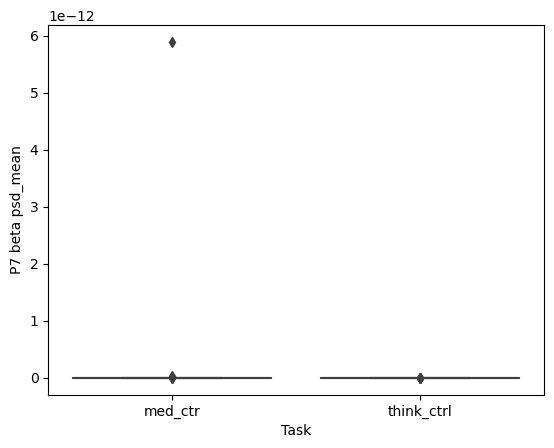

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_ctr', 'think_ctrl']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 beta psd_mean')

plt.show()

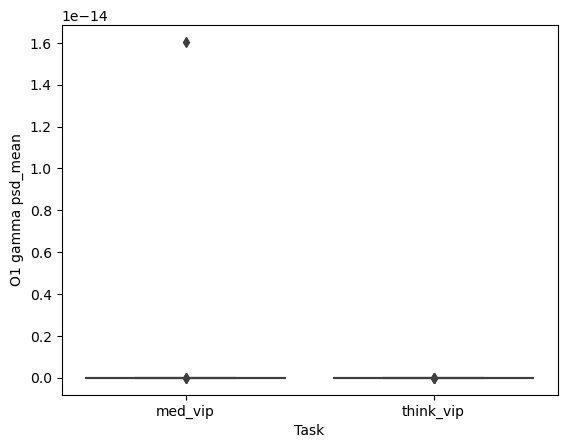

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip', 'think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')

plt.show()

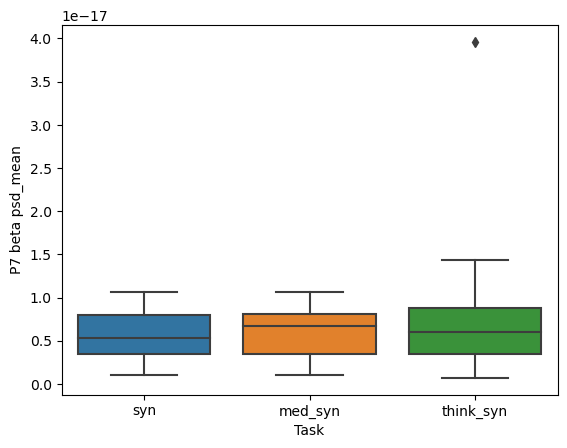

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 beta psd_mean')

plt.show()

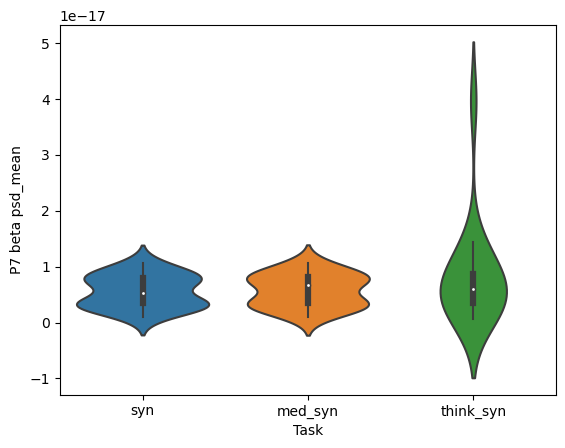

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='P7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 beta psd_mean')

plt.show()


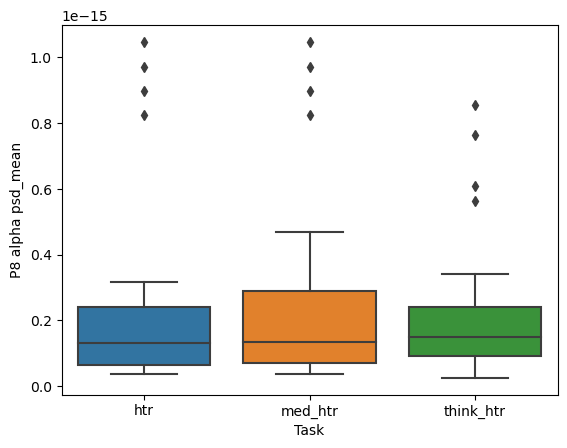

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 alpha psd_mean')

plt.show()

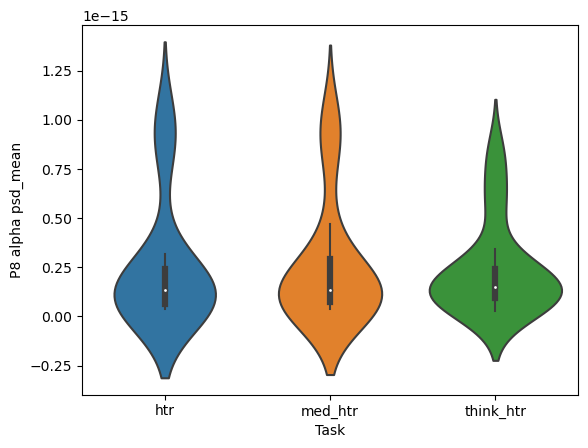

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='P8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 alpha psd_mean')

plt.show()

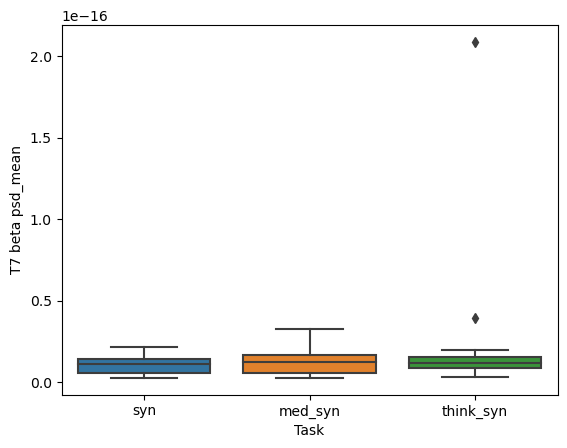

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T7 beta psd_mean')

plt.show()

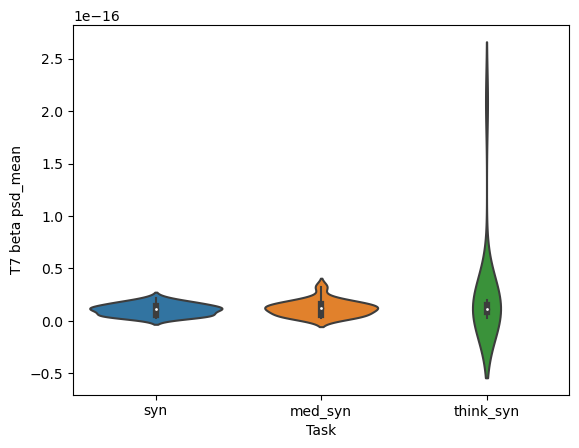

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='T7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T7 beta psd_mean')

plt.show()


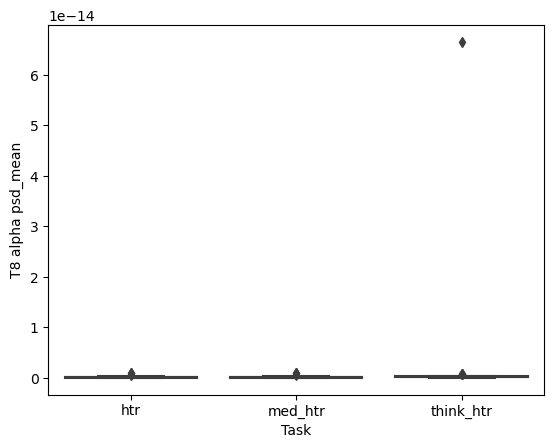

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T8 alpha psd_mean')

plt.show()

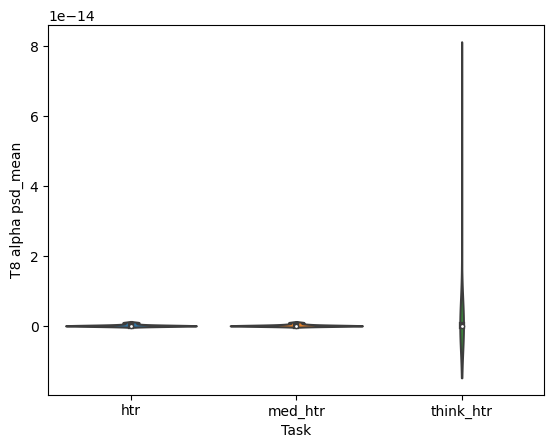

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='T8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T8 alpha psd_mean')

plt.show()


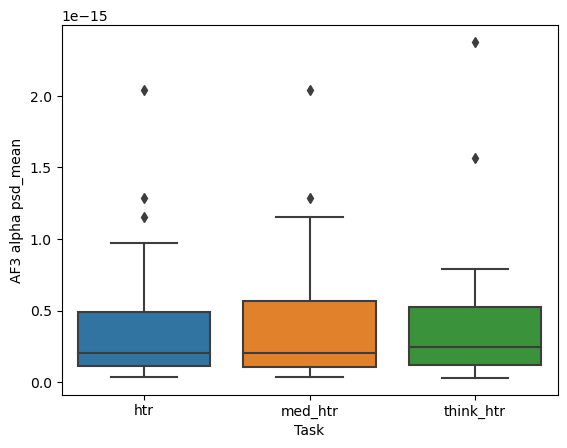

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF3 alpha psd_mean')

plt.show()

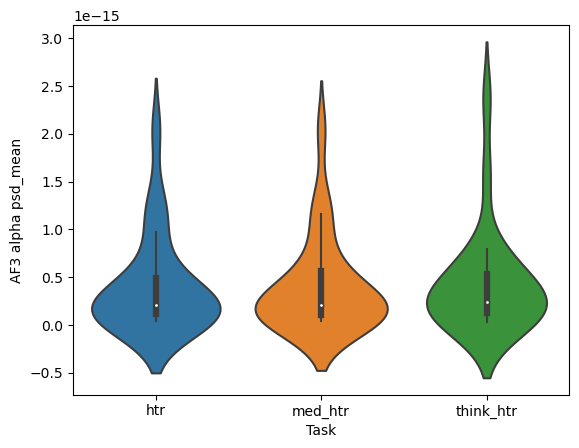

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF3 alpha psd_mean')

plt.show()


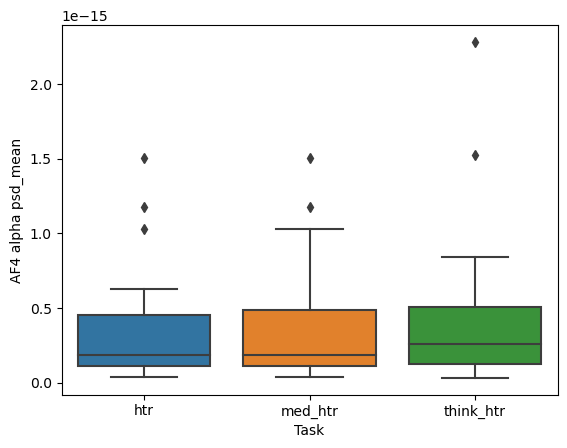

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF4 alpha psd_mean')

plt.show()

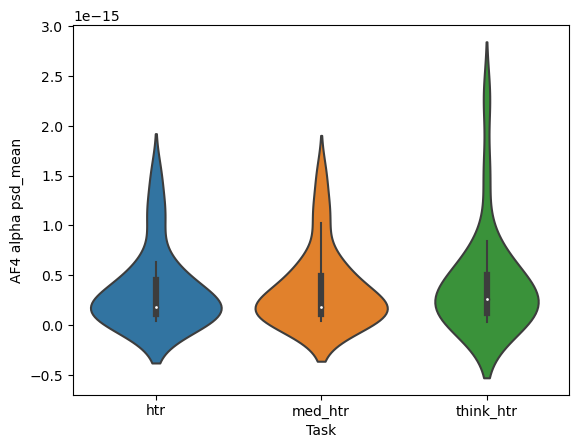

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='AF4 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF4 alpha psd_mean')

plt.show()

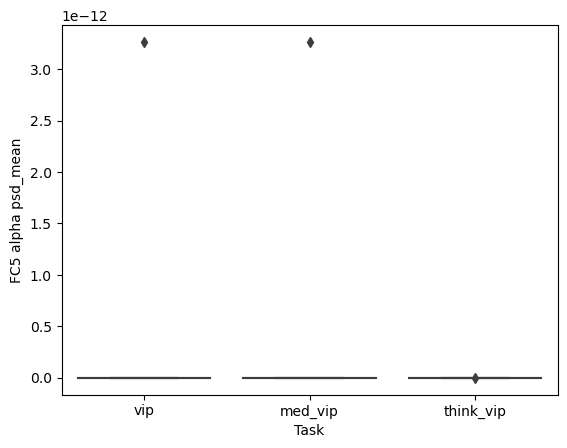

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['vip', 'med_vip','think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC5 alpha psd_mean')

plt.show()

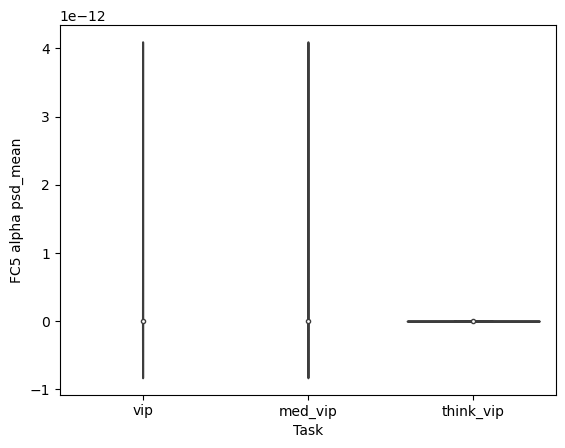

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['vip', 'med_vip','think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='FC5 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC5 alpha psd_mean')

plt.show()

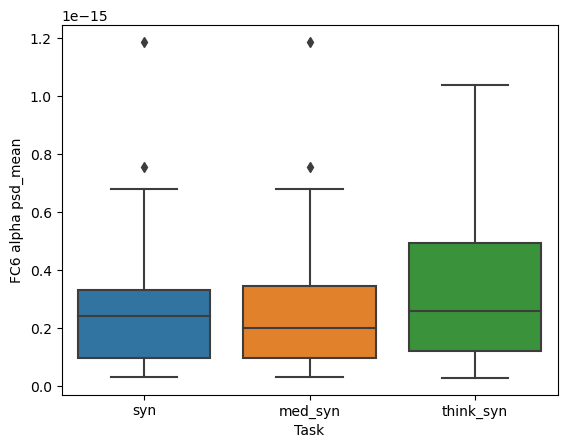

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC6 alpha psd_mean')

plt.show()

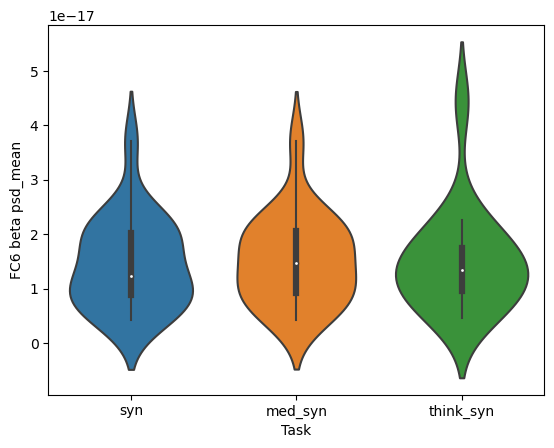

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='FC6 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC6 beta psd_mean')

plt.show()

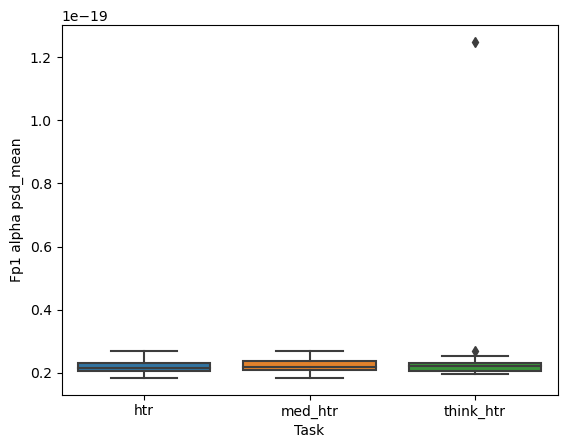

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp1 alpha psd_mean')

plt.show()

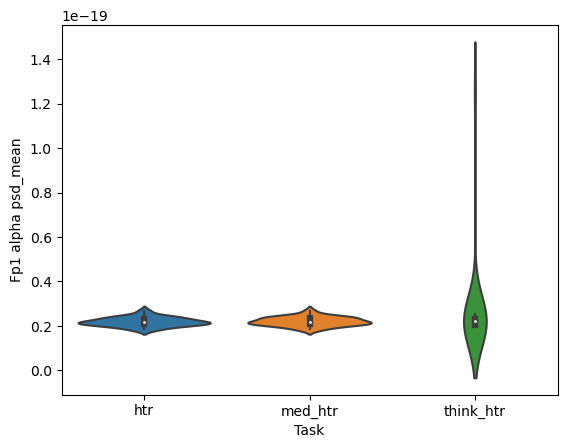

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='Fp1 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp1 alpha psd_mean')

plt.show()

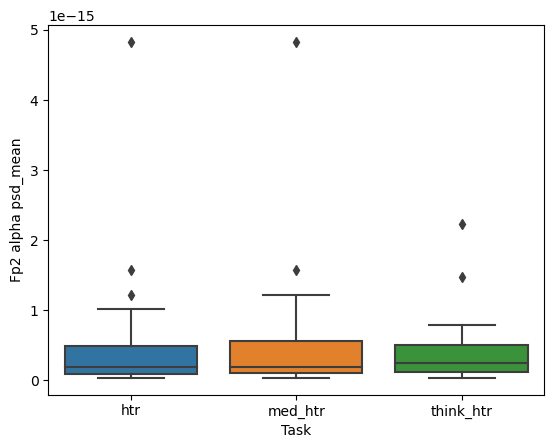

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp2 alpha psd_mean')

plt.show()

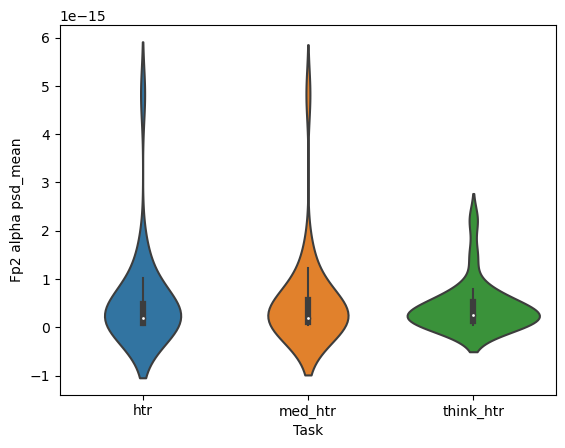

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp2 alpha psd_mean')

plt.show()

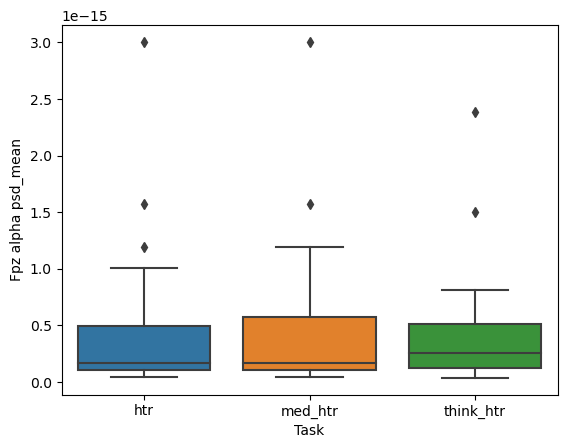

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fpz alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fpz alpha psd_mean')

plt.show()

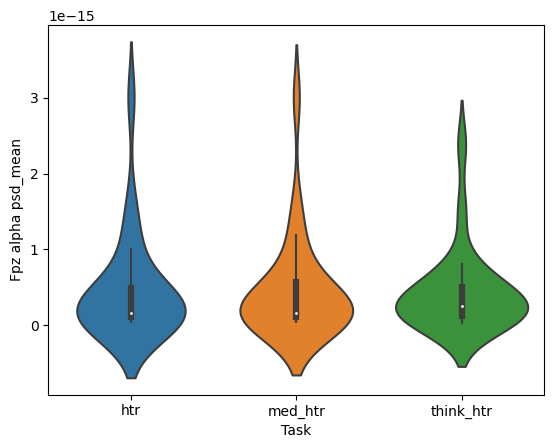

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='Fpz alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fpz alpha psd_mean')

plt.show()

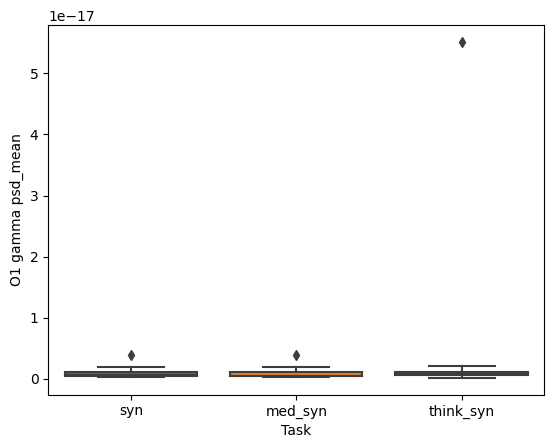

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')

plt.show()

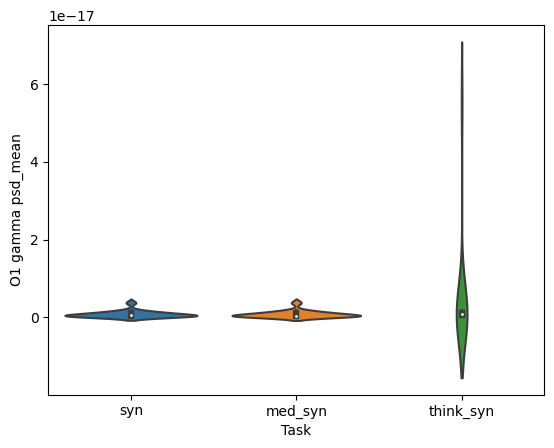

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')

plt.show()

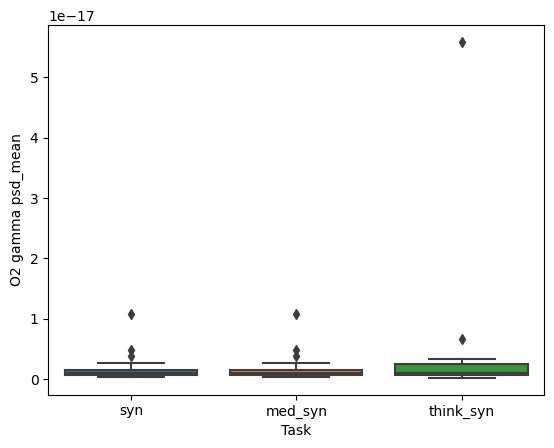

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O2 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O2 gamma psd_mean')

plt.show()

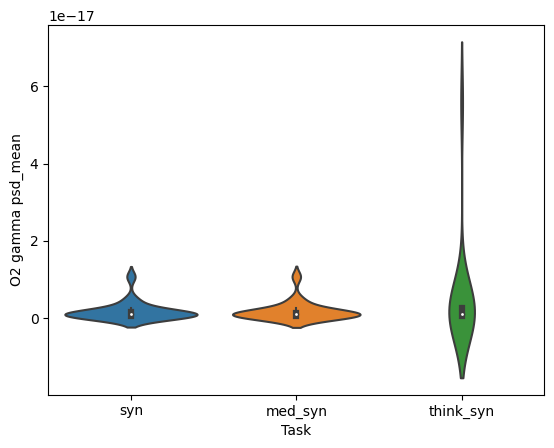

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a violin plot using the filtered DataFrame
sns.violinplot(x='task', y='O2 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O2 gamma psd_mean')

plt.show()

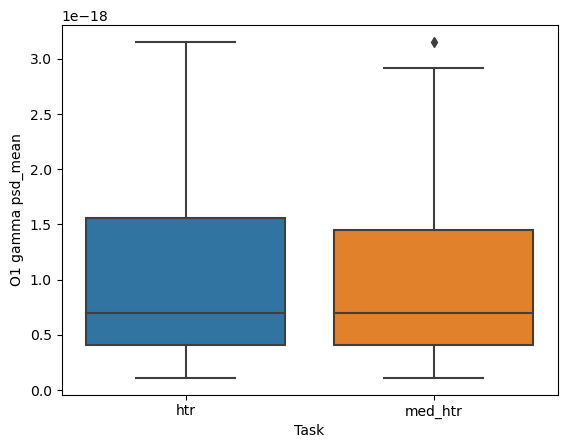

In [121]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')

plt.show()

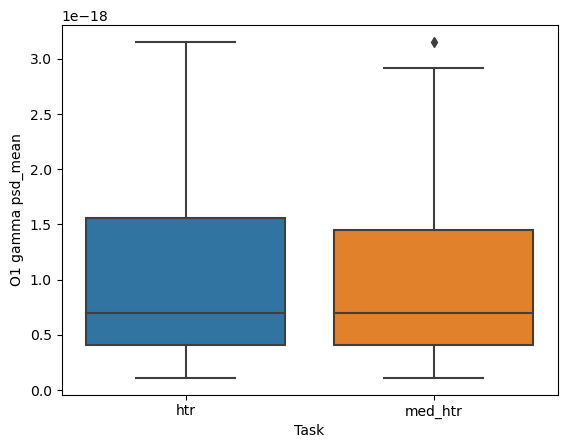

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')

plt.show()

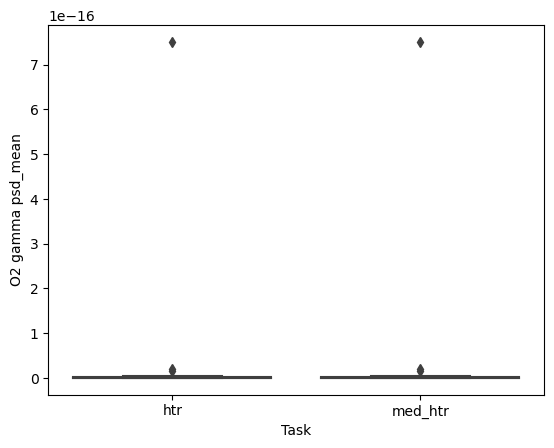

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O2 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O2 gamma psd_mean')

plt.show()

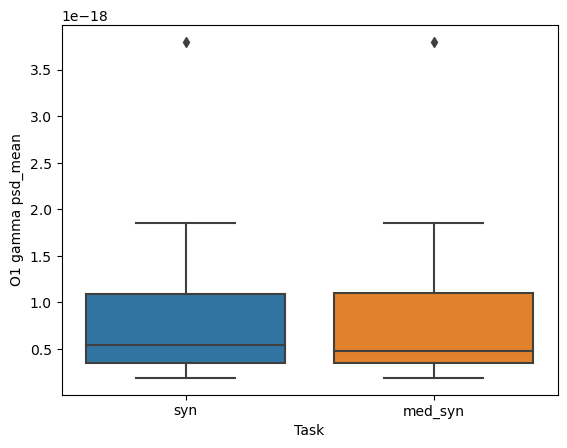

In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')

plt.show()

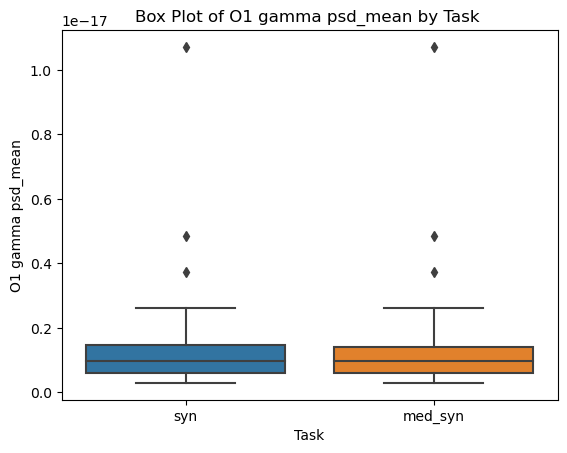

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O2 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

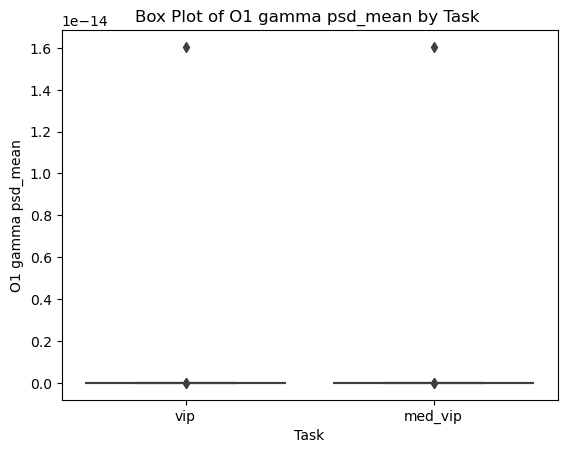

In [158]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

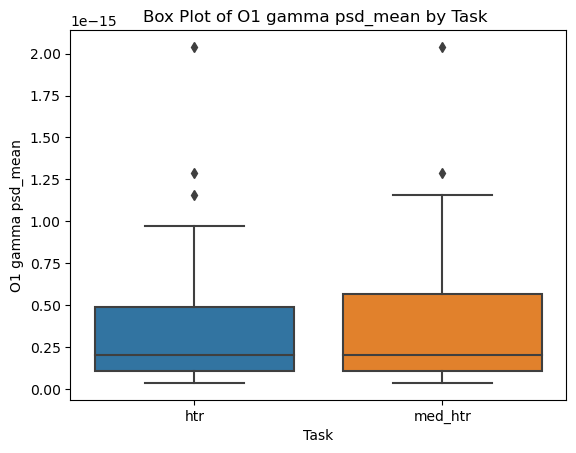

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

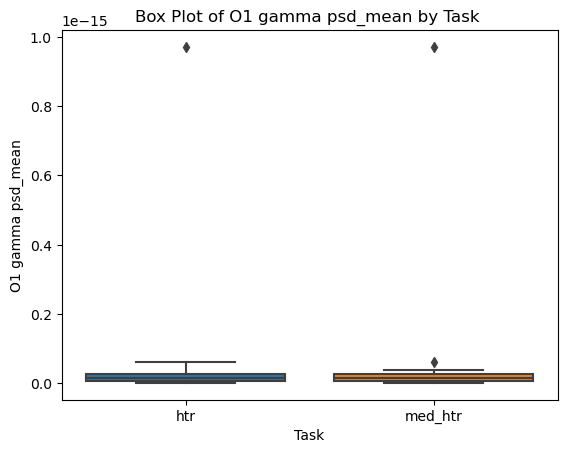

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

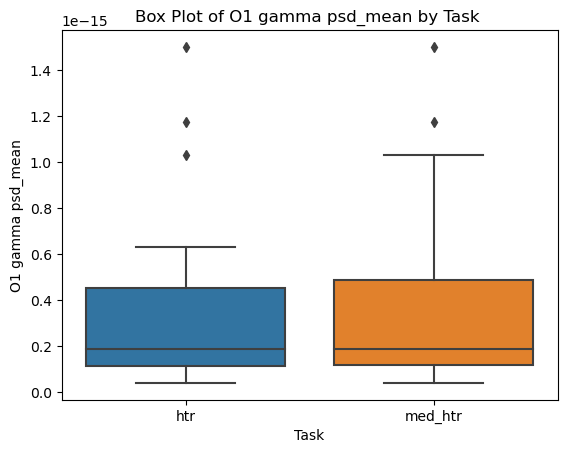

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

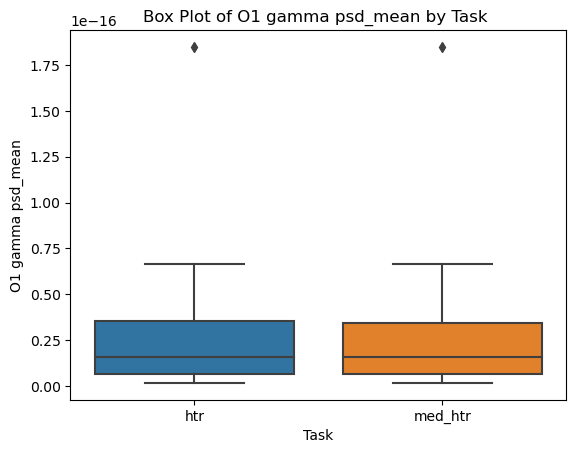

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

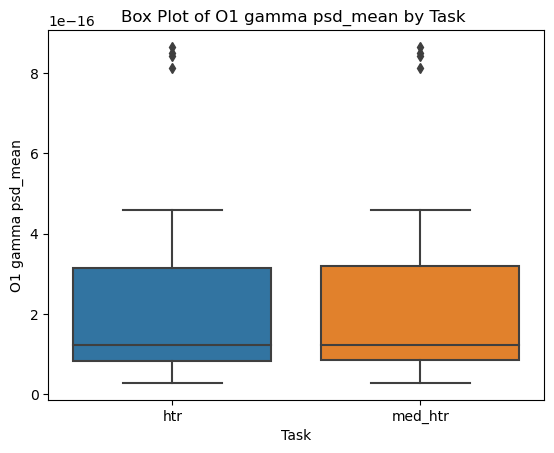

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

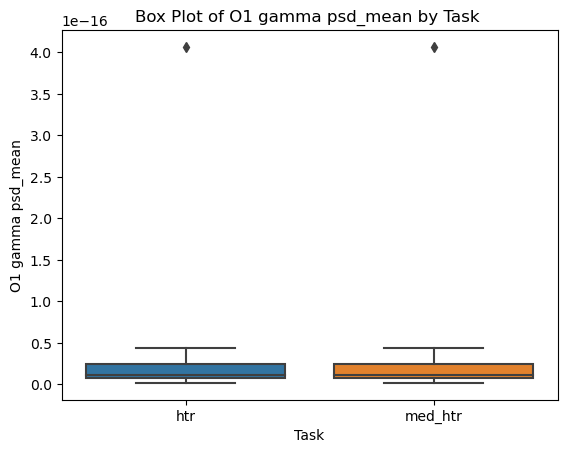

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

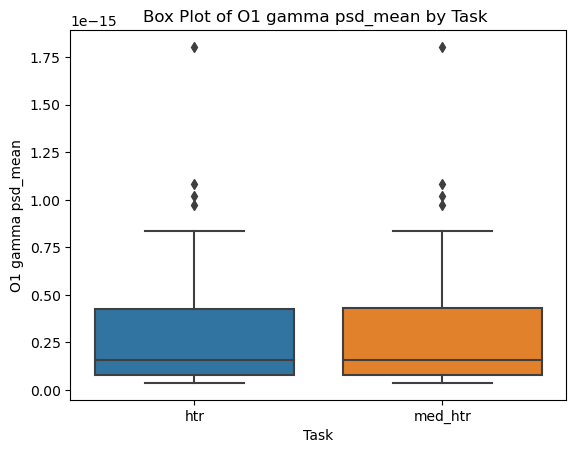

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

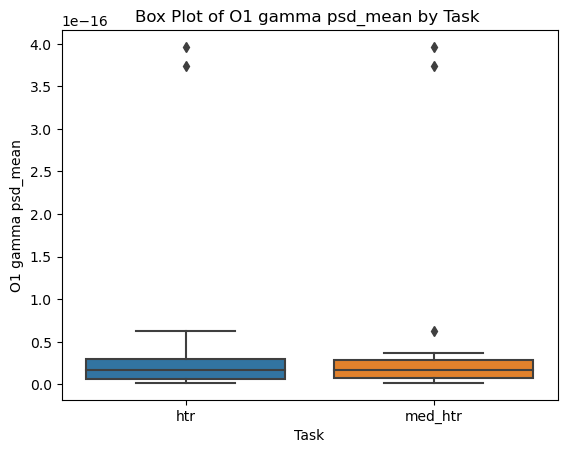

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

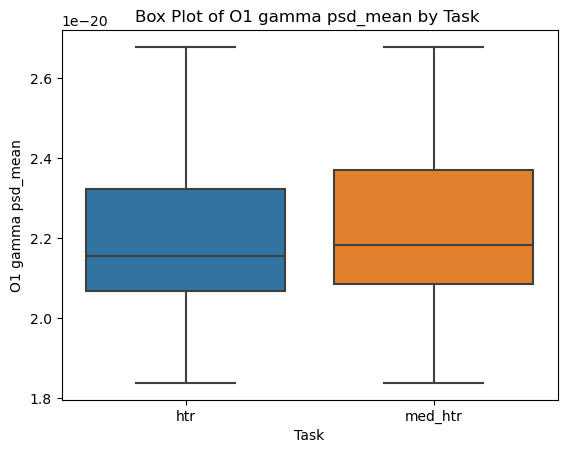

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

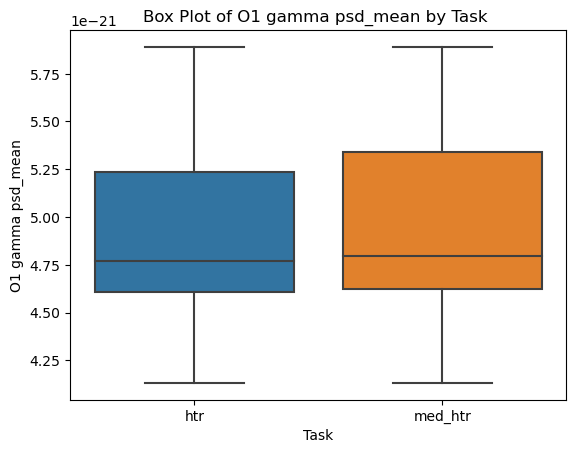

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

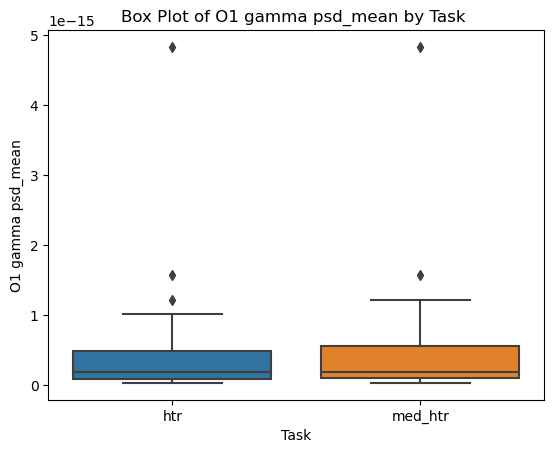

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

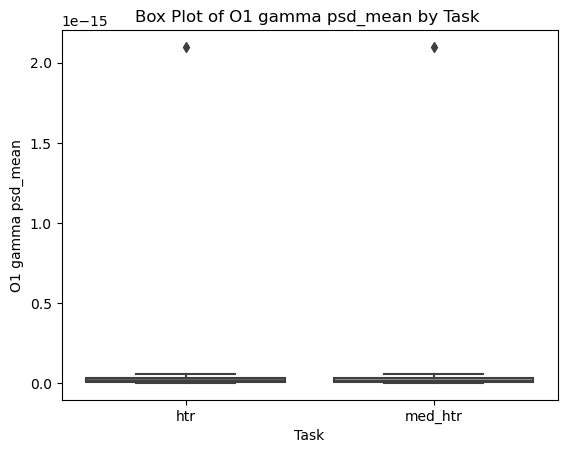

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

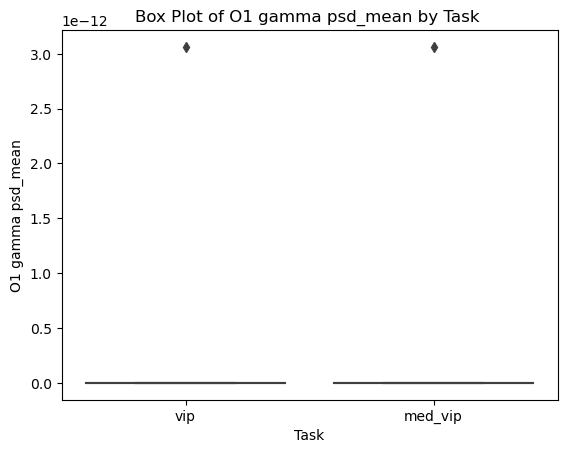

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

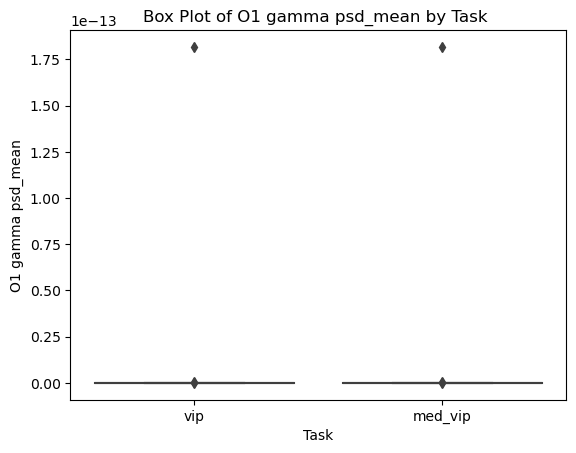

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

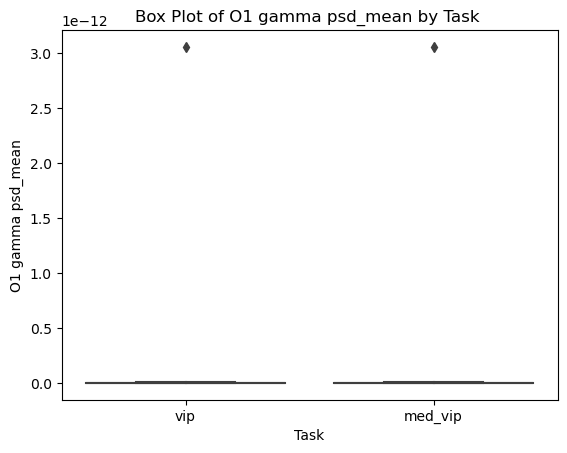

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

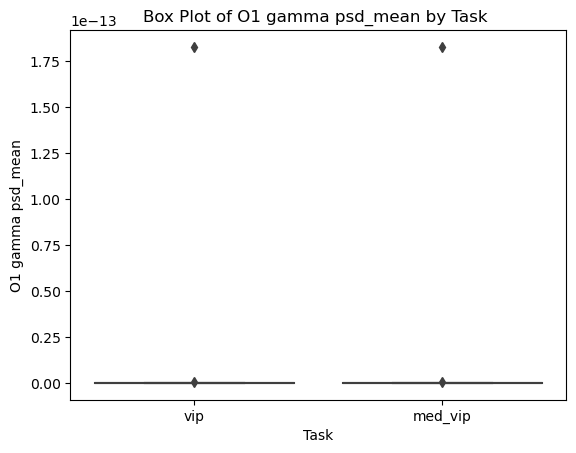

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

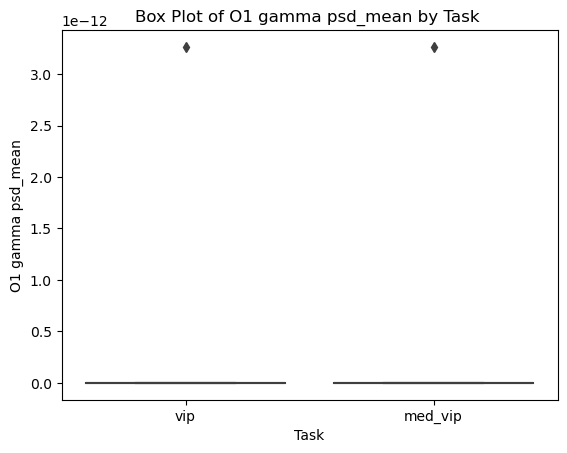

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

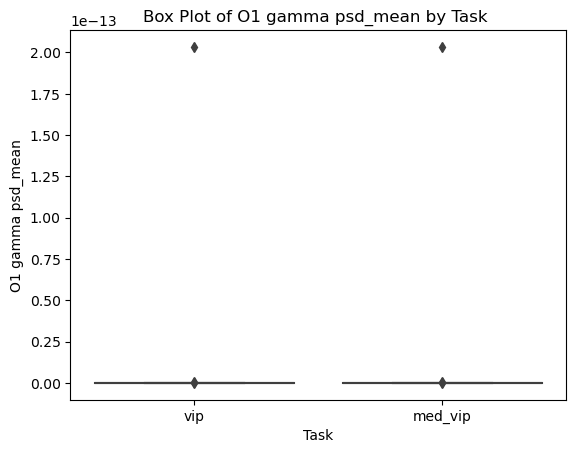

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

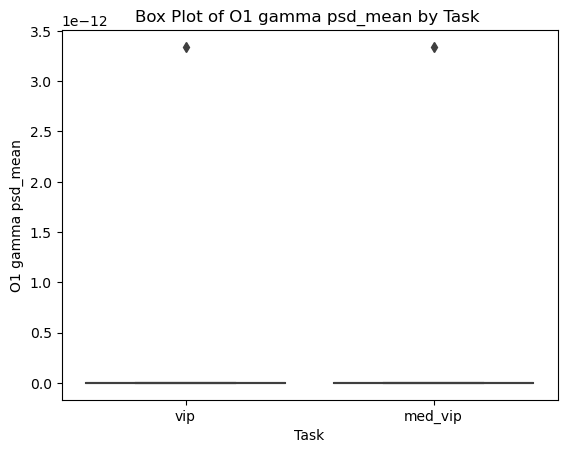

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

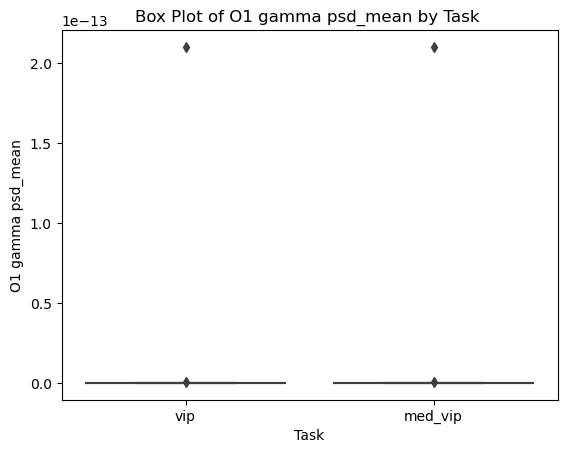

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

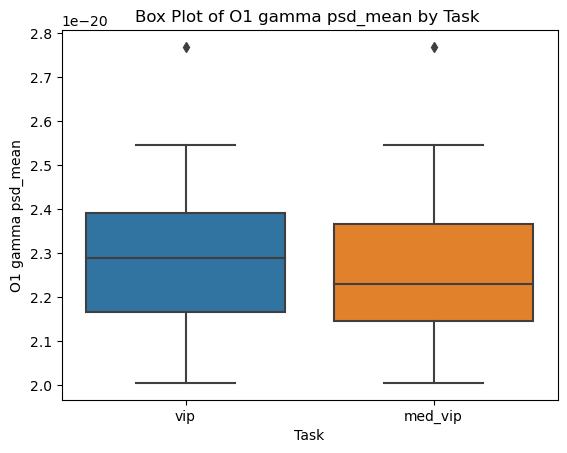

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

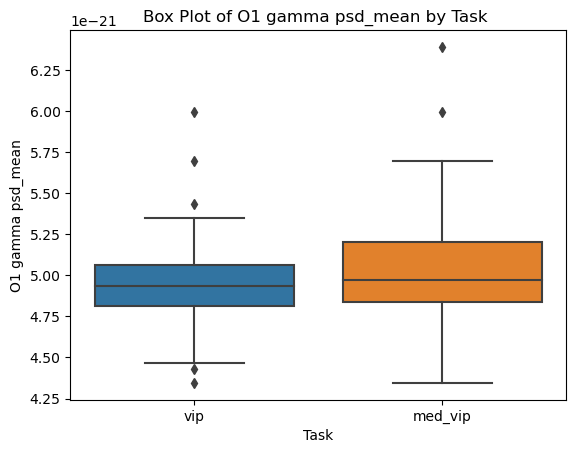

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

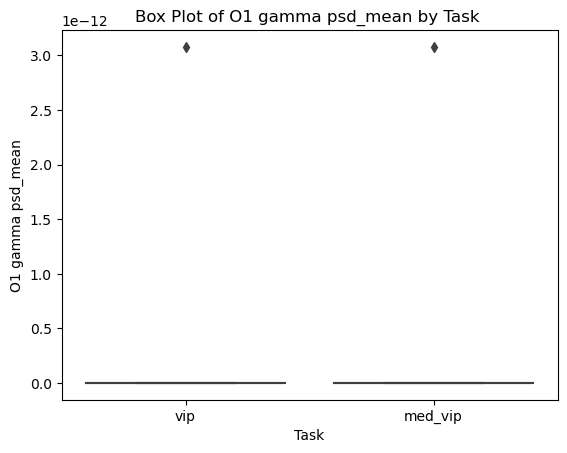

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

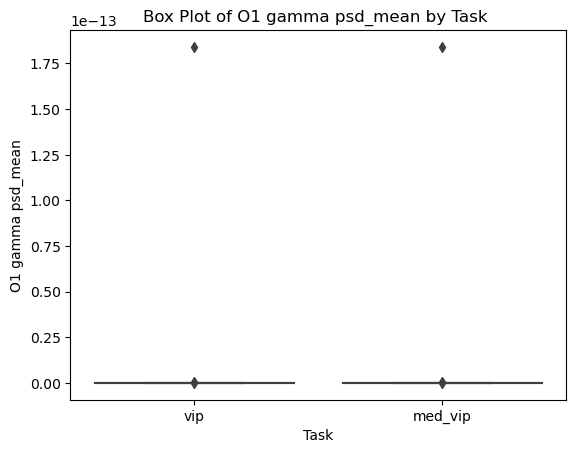

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

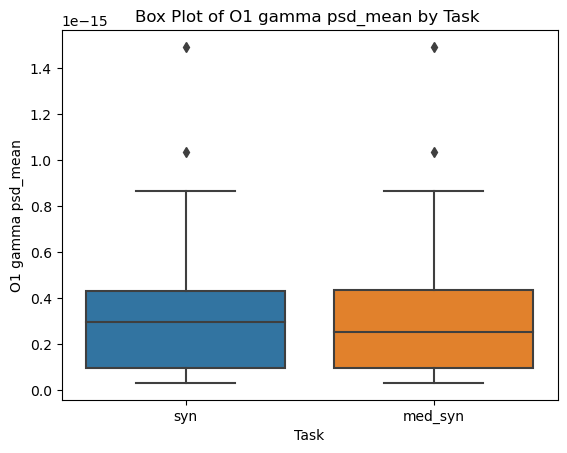

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

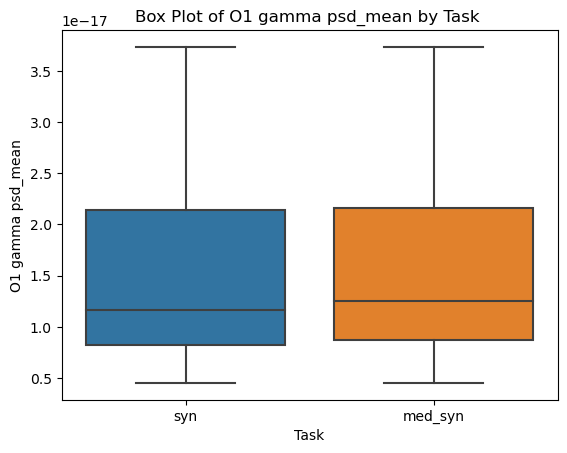

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

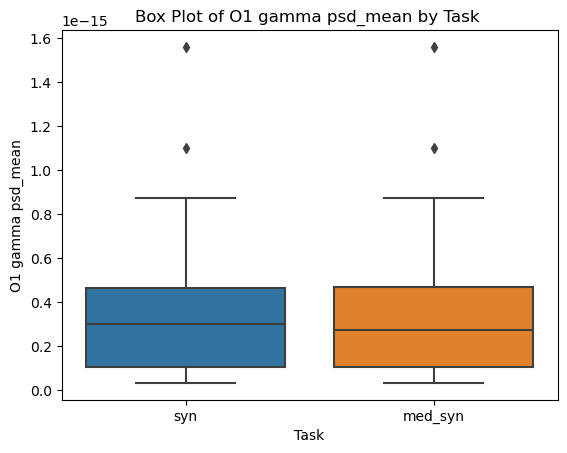

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

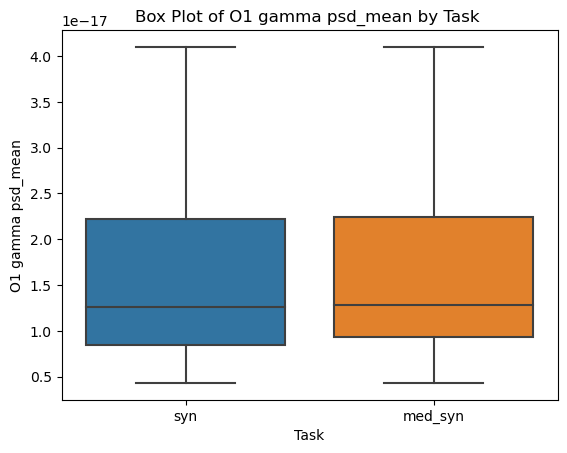

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

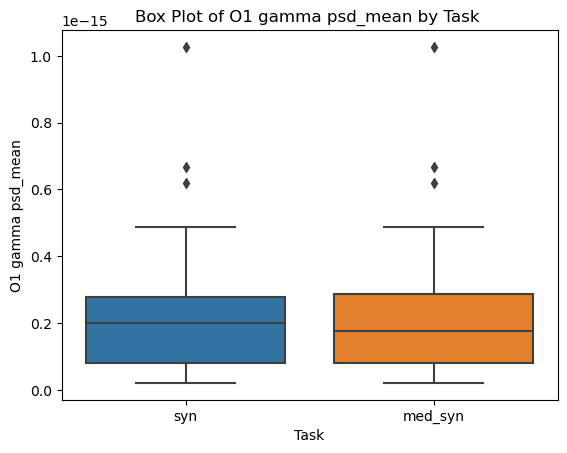

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

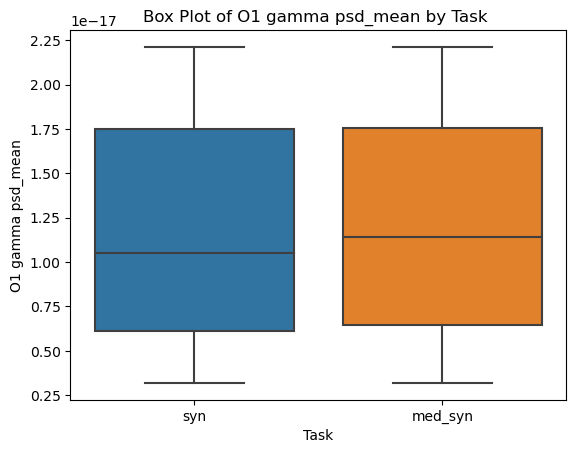

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

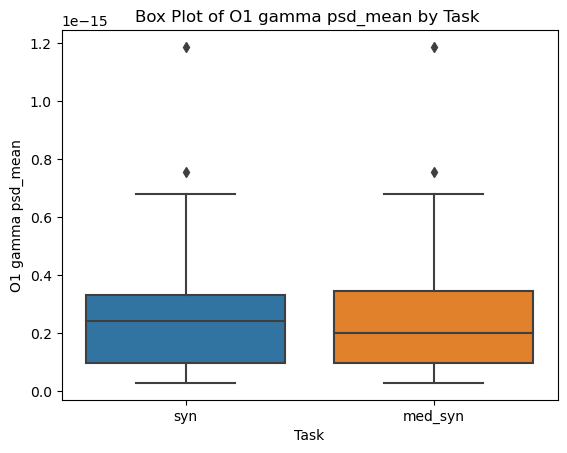

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

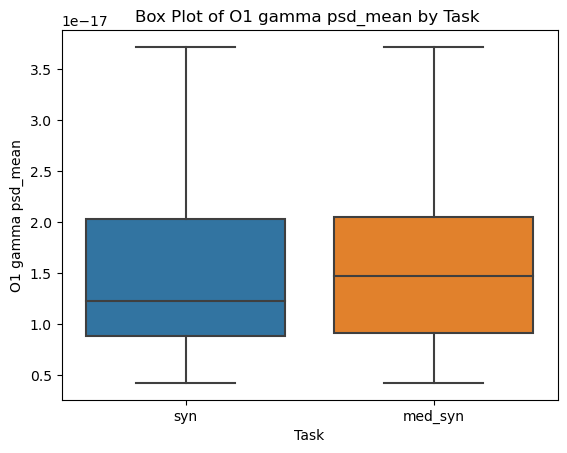

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

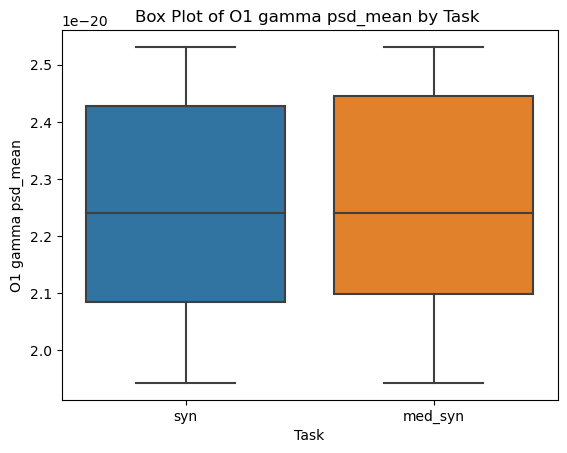

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

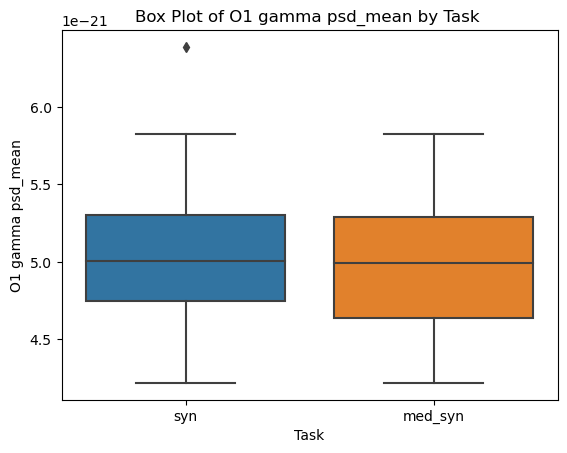

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

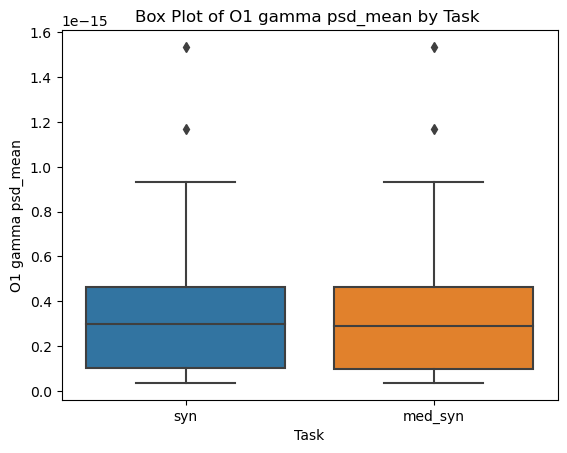

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

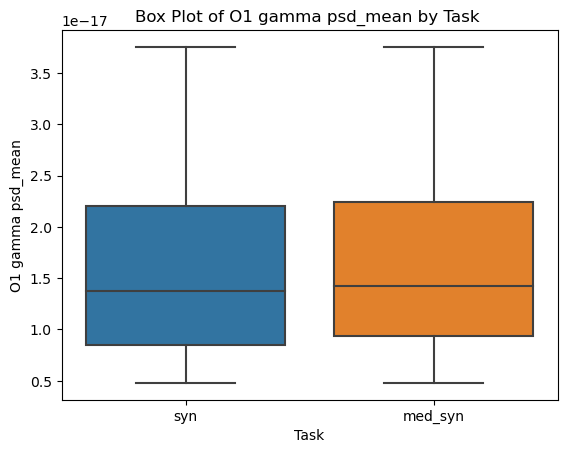

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

In [16]:
##############

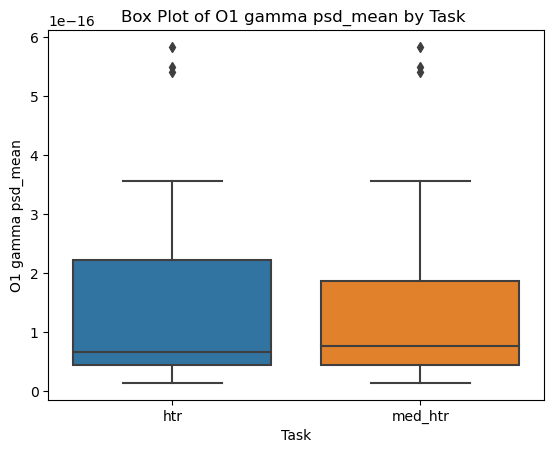

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

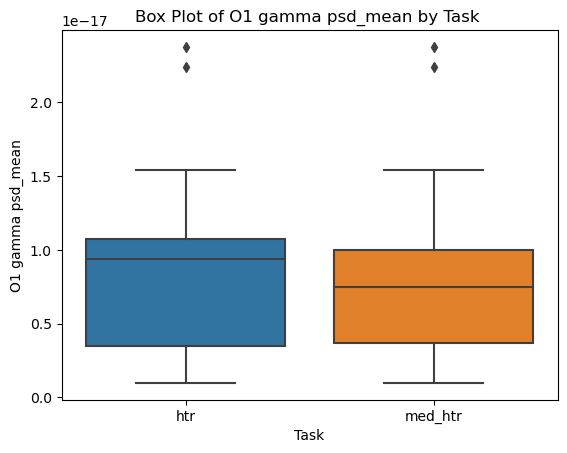

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

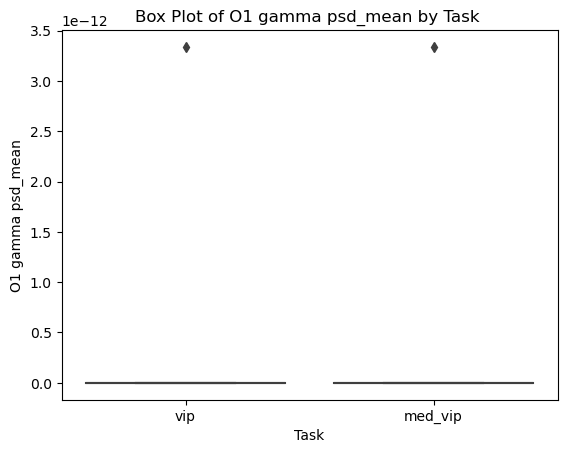

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

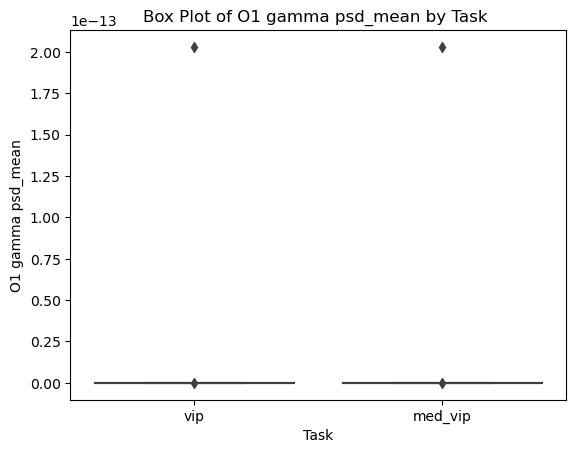

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

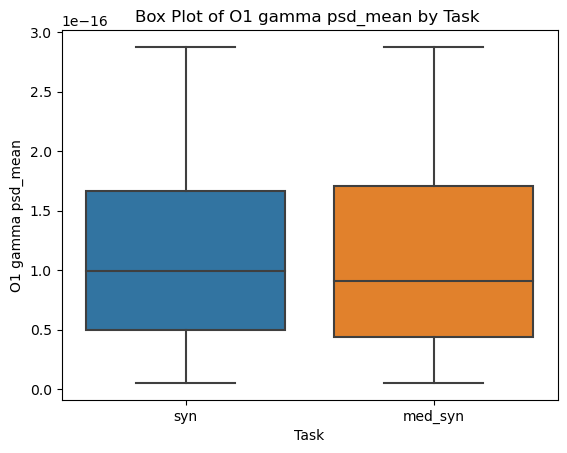

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

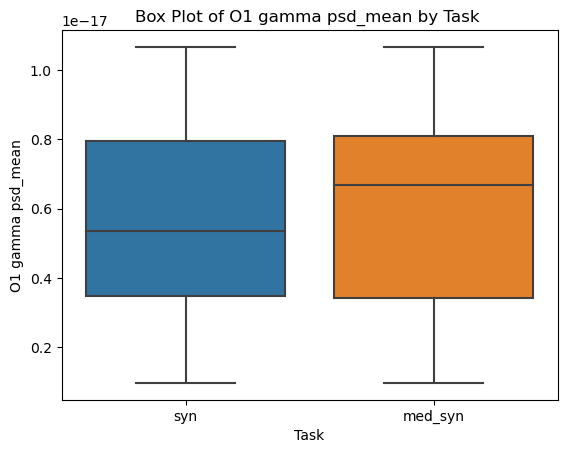

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

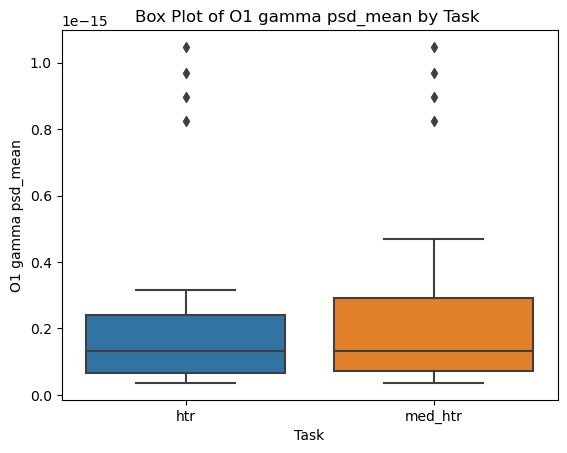

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

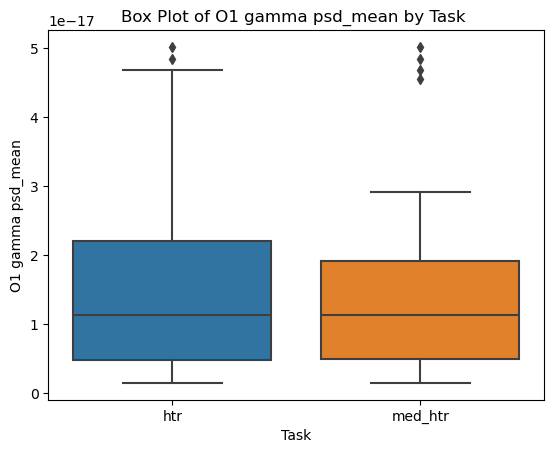

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

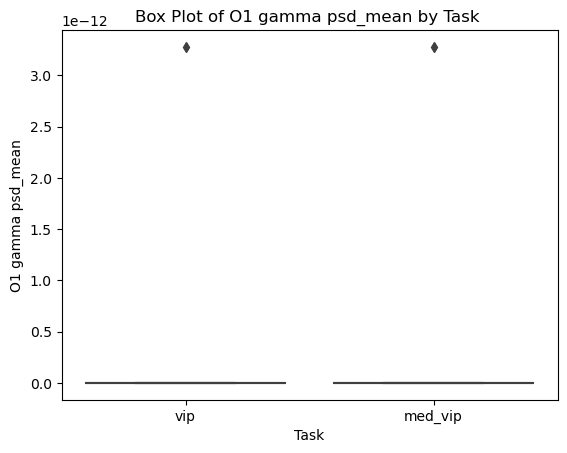

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

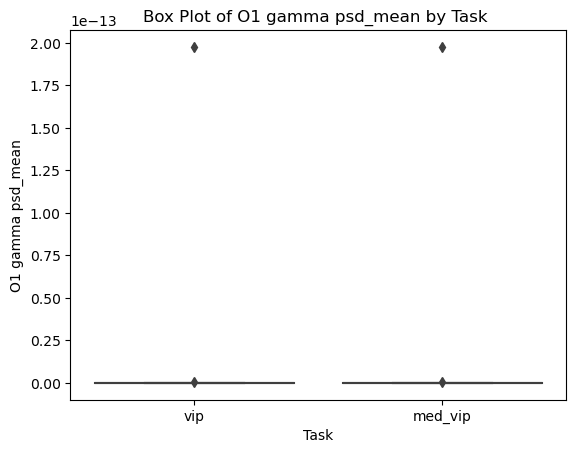

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

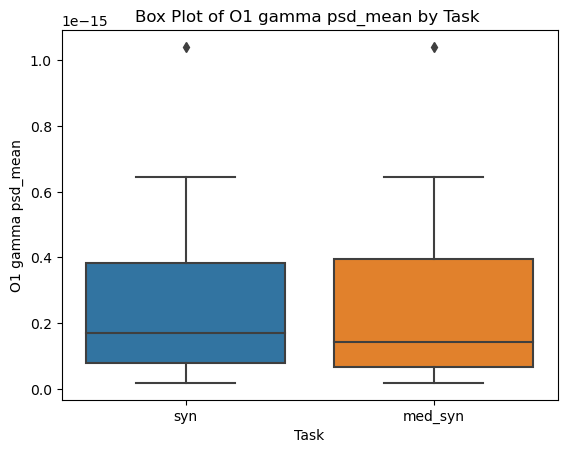

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

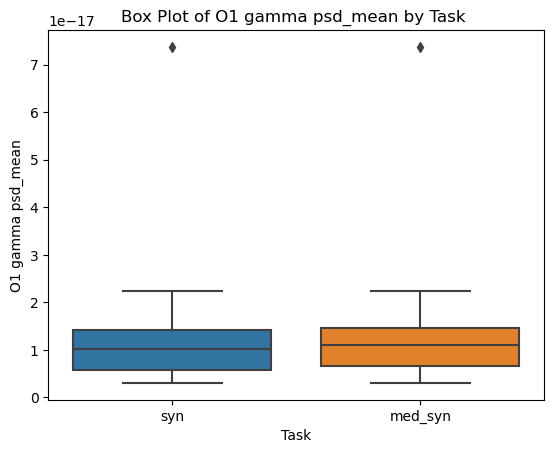

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

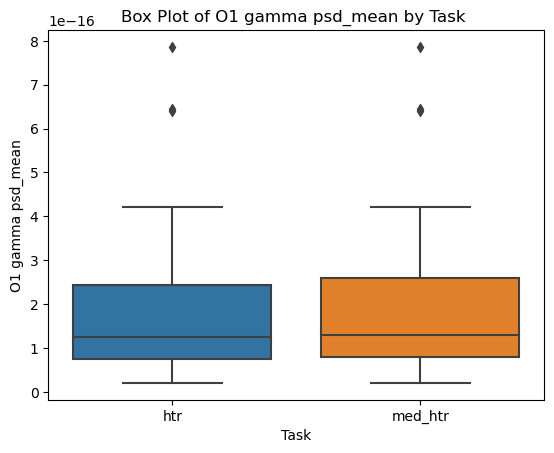

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

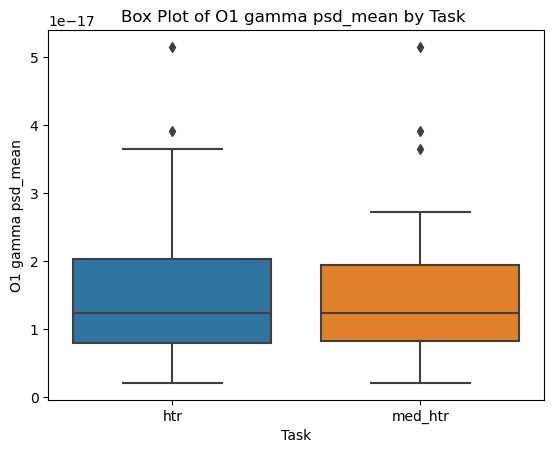

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

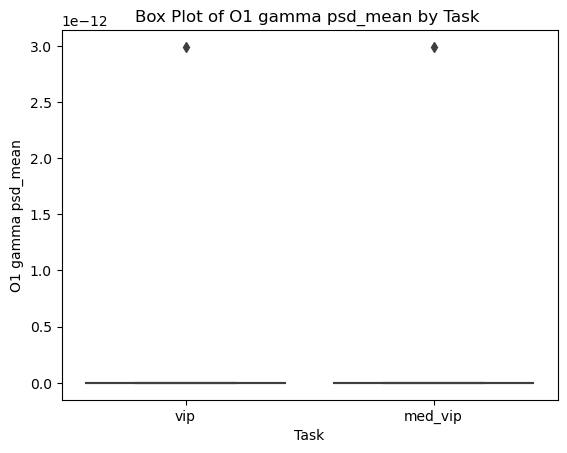

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

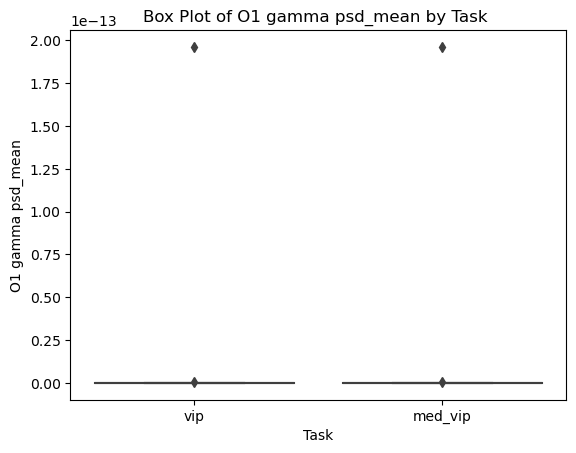

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

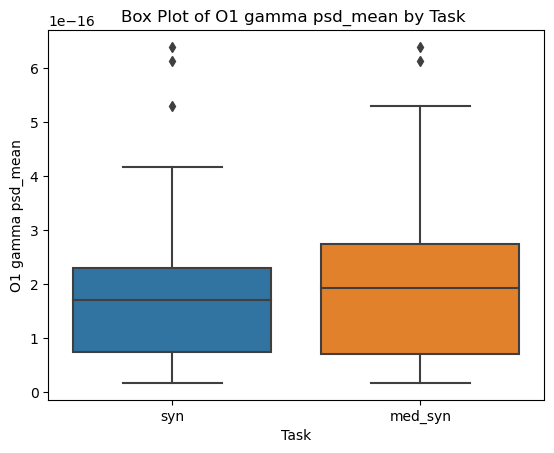

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

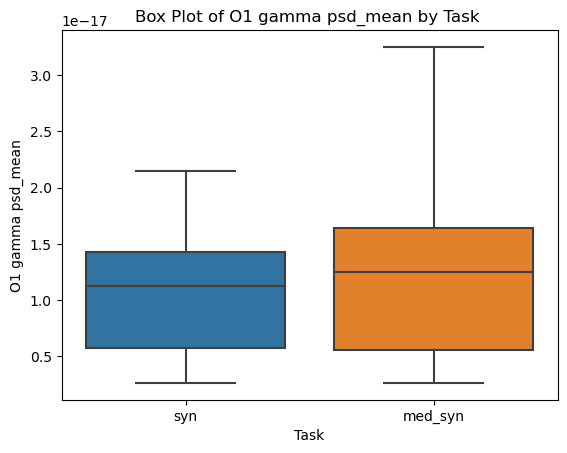

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

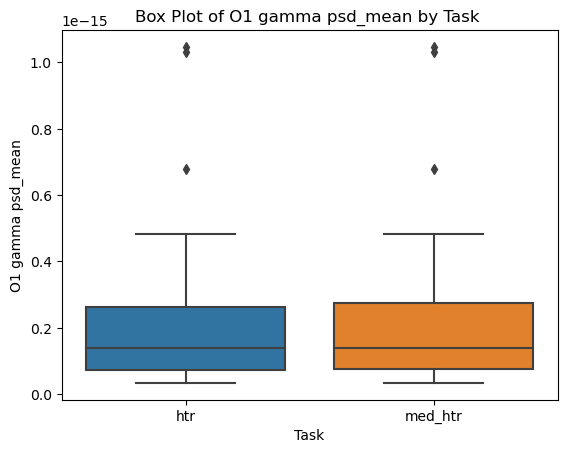

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

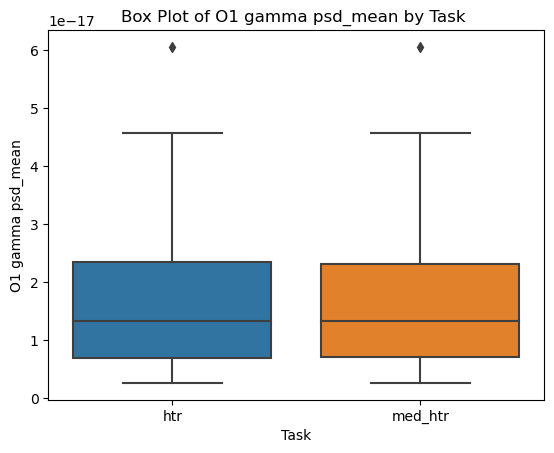

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_htr','htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

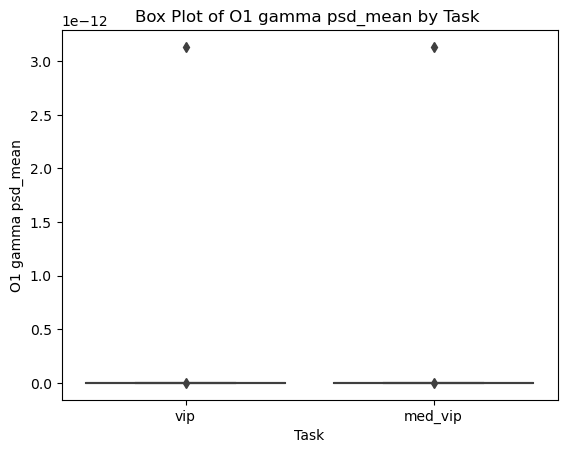

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

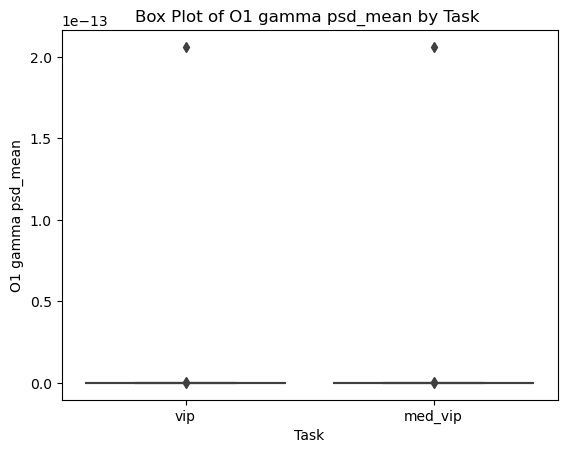

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_vip','vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

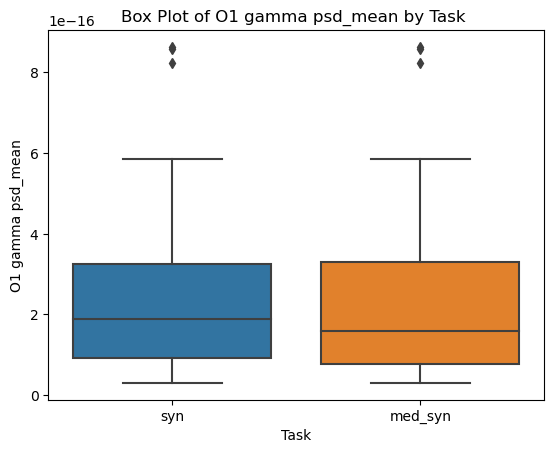

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

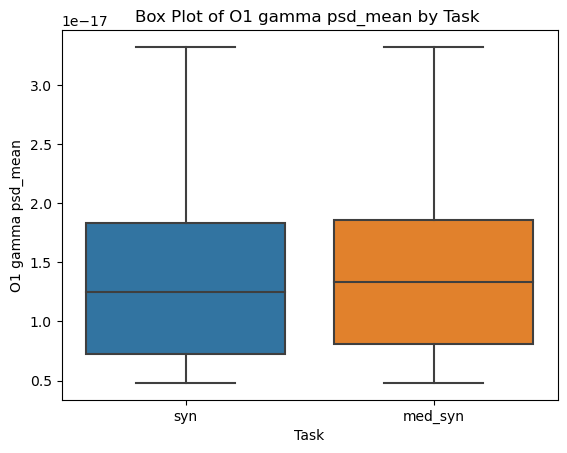

In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['med_syn','syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

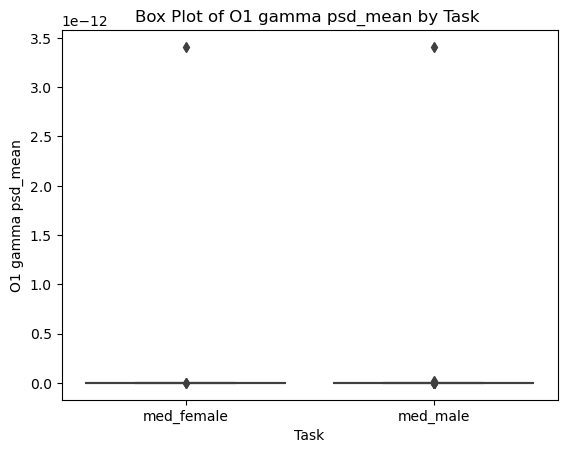

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_male_female.csv')

# Specify the two categories you want to include
selected_categories = ['med_female','med_male']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O2 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

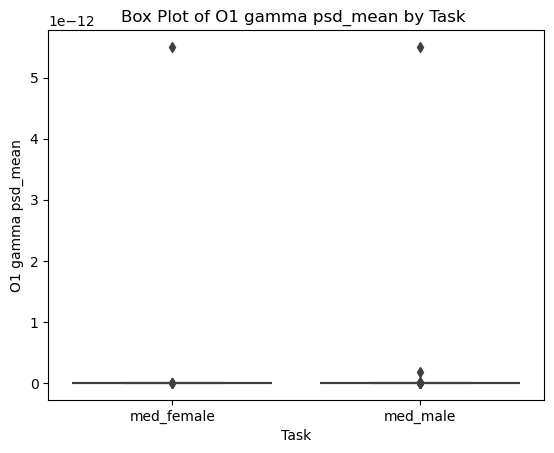

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_male_female.csv')

# Specify the two categories you want to include
selected_categories = ['med_female','med_male']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

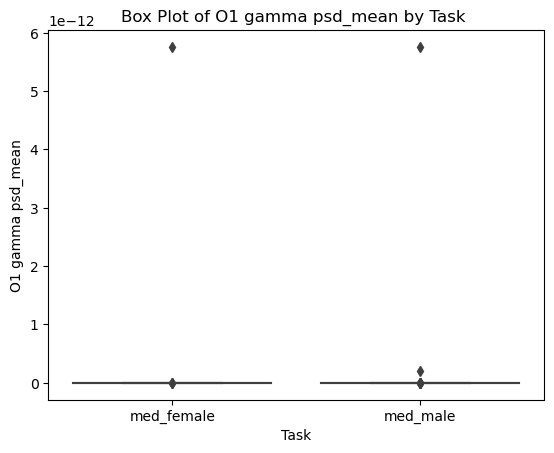

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_male_female.csv')

# Specify the two categories you want to include
selected_categories = ['med_female','med_male']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC5 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

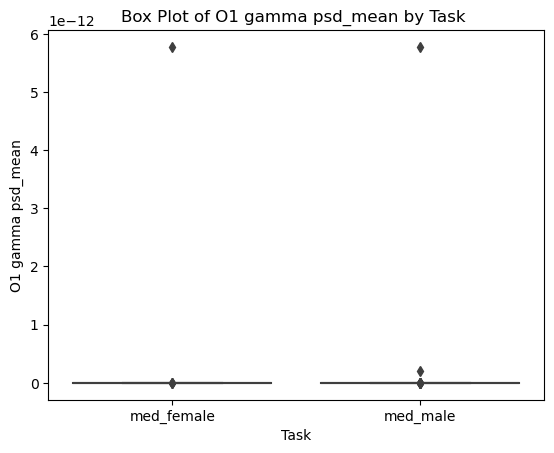

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_male_female.csv')

# Specify the two categories you want to include
selected_categories = ['med_female','med_male']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

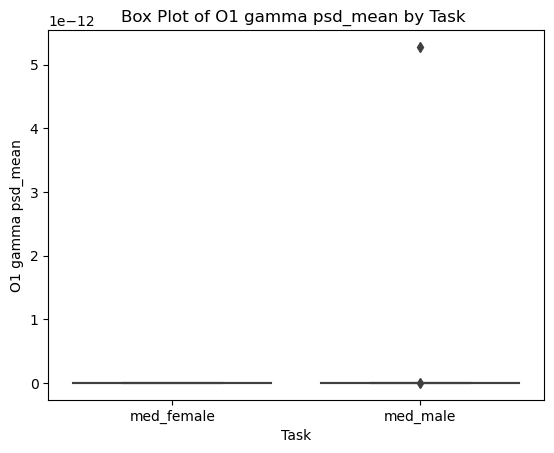

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_male_female.csv')

# Specify the two categories you want to include
selected_categories = ['med_female','med_male']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

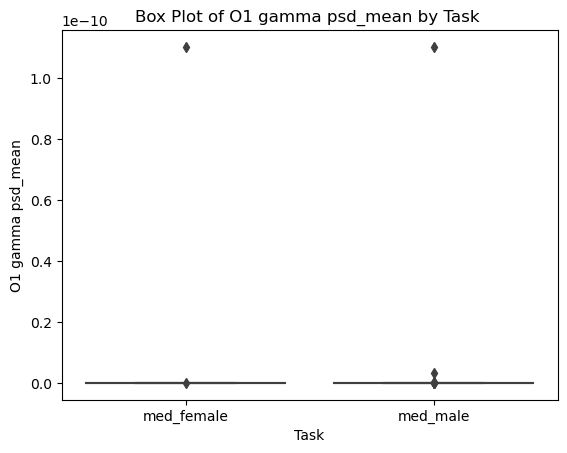

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_male_female.csv')

# Specify the two categories you want to include
selected_categories = ['med_female','med_male']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')
plt.title('Box Plot of O1 gamma psd_mean by Task ')
plt.show()

In [68]:
# FINAL CODE FOR T TEST 

import pandas as pd
from math import sqrt
from numpy import mean
from scipy.stats import sem
from scipy.stats import t

# Function for calculating the t-test for two independent samples
def independent_ttest_from_csv(file_path, alpha):
    # Load data from the CSV file into a pandas DataFrame
    df = pd.read_csv(file_path)

    # Select rows where "task" is "htr" for data1 and "med_htr" for data2
    data1 = df[df['task'] == 'med_syn']['FC6 beta psd_mean'].head(20)
    data2 = df[df['task'] == 'think_syn']['FC6 beta psd_mean'].head(20)

    # Calculate means
    mean1, mean2 = mean(data1), mean(data2)
    # Calculate standard errors
    se1, se2 = sem(data1), sem(data2)
    # Standard error on the difference between the samples
    sed = sqrt(se1**2.0 + se2**2.0)
    # Calculate the t statistic
    t_stat = (mean1 - mean2) / sed
    # Degrees of freedom
    df = len(data1) + len(data2) - 2
    # Calculate the critical value
    cv = t.ppf(1.0 - alpha, df)
    # Calculate the p-value
    p = (1.0 - t.cdf(abs(t_stat), df)) * 2.0

    # Return everything
    return t_stat, df, cv, p

# Example usage
alpha = 0.40
file_path = 'merged_dataset_final_forplot.csv'  # Replace 'your_file.csv' with the actual file path
t_stat, df, cv, p = independent_ttest_from_csv(file_path, alpha)

print('t=%.3f, df=%d, cv=%.3f, p=%.3f' % (t_stat, df, cv, p))

# Interpret via critical value
if abs(t_stat) <= cv:
    print('Accept null hypothesis that the means are equal.')
else:
    print('Reject the null hypothesis that the means are equal.')

# Interpret via p-value
if p > alpha:
    print('Accept null hypothesis that the means are equal.')
else:
    print('Reject the null hypothesis that the means are equal.')


t=0.070, df=33, cv=0.255, p=0.945
Accept null hypothesis that the means are equal.
Accept null hypothesis that the means are equal.


Extracting EDF parameters from C:\Dataset_meditation\rishikesh_dataset\control\sub-025_task-med2_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 619519  =      0.000 ...   604.999 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1041 samples (1.017 s)

Setting up band-pass filter

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- 

- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1041 samples (1.017 s)

Setting up band-pass filter from 30 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 30.00
- Lower transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1041 samples (1.017 s)

Setting up band-pass filter from 30 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, 


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1041 samples (1.017 s)

Setting up band-pass filter from 30 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 30.00
- Lower transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 26.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 451 samples (0.440 s)

Se

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 30.00
- Lower transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 26.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 451 samples (0.440 s)

Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setti

- Filter length: 451 samples (0.440 s)

Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1041 samples (1.017 s)

Sett

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

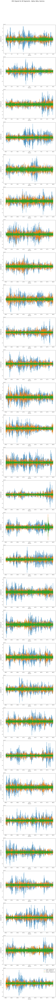

In [16]:
import mne
import matplotlib.pyplot as plt

# Load the .bdf file
file_path = "C:/Dataset_meditation/rishikesh_dataset/control/sub-025_task-med2_eeg.bdf"
raw = mne.io.read_raw_bdf(file_path, preload=True)

# Define the channels you want to select
selected_channels = ["AF3"]

# Select only the specified channels
raw.pick_channels(selected_channels)

# Segment duration in seconds
segment_duration = 20

# Frequency bands
alpha_band = (8, 13)
beta_band = (13, 30)
gamma_band = (30, 40)

# Get the total duration of the recording in seconds
total_duration = raw.times[-1]

# Calculate the number of segments
num_segments = int(total_duration / segment_duration)

# Plot all segments in a single plot
plt.figure(figsize=(10, 6*num_segments))

for i in range(num_segments):
    # Calculate the start and end times for each segment
    start_time = i * segment_duration
    end_time = (i + 1) * segment_duration

    # Get the corresponding indices for start and end times
    start_idx, end_idx = raw.time_as_index([start_time, end_time])

    # Extract data for the segment
    segment_data, times = raw[:, start_idx:end_idx]

    # Apply frequency filtering for each channel
    alpha_data = mne.filter.filter_data(segment_data, raw.info['sfreq'], *alpha_band)
    beta_data = mne.filter.filter_data(segment_data, raw.info['sfreq'], *beta_band)
    gamma_data = mne.filter.filter_data(segment_data, raw.info['sfreq'], *gamma_band)

    # Plot the EEG signals for the segment
    plt.subplot(num_segments, 1, i + 1)
    plt.plot(times, alpha_data.T, label=f'Alpha - Segment {i+1}')
    plt.plot(times, beta_data.T, label=f'Beta - Segment {i+1}')
    plt.plot(times, gamma_data.T, label=f'Gamma - Segment {i+1}')

    # Add axis labels
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (μV)')

plt.suptitle('EEG Signals for All Segments - Alpha, Beta, Gamma', fontsize=16)
plt.legend(loc='upper right')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


Extracting EDF parameters from C:\Dataset_meditation\rishikesh_dataset\med2\sub-047_task-med2_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 615423  =      0.000 ...   600.999 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Wind

Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1041 samples (1.017 s)

Setting up band-pass filter from 30 - 40 Hz

FIR 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Setting up band-pass filter from 30 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 30.00
- Lower transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 26.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 451 samples (0.440 s)

Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- 

- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 451 samples (0.440 s)

Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work


Setting up band-pass filter from 30 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 30.00
- Lower transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 26.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 451 samples (0.440 s)

Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
-

- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 451 samples (0.440 s)

Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1041 samples (1.017 s)

Sett

- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1041 samples (1.017 s)

Setting up band-pass filter from 30 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 30.00
- Lower transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 26.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 1691 samples (1.651 s)

Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 1041 samples (1.017 s)

Sett

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

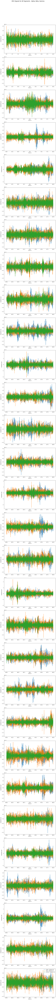

In [17]:
import mne
import matplotlib.pyplot as plt

# Load the .bdf file
file_path = "C:/Dataset_meditation/rishikesh_dataset/med2/sub-047_task-med2_eeg.bdf"
raw = mne.io.read_raw_bdf(file_path, preload=True)

# Define the channels you want to select
selected_channels = ["AF3"]

# Select only the specified channels
raw.pick_channels(selected_channels)

# Segment duration in seconds
segment_duration = 20

# Frequency bands
alpha_band = (8, 13)
beta_band = (13, 30)
gamma_band = (30, 40)

# Get the total duration of the recording in seconds
total_duration = raw.times[-1]

# Calculate the number of segments
num_segments = int(total_duration / segment_duration)

# Plot all segments in a single plot
plt.figure(figsize=(10, 6*num_segments))

for i in range(num_segments):
    # Calculate the start and end times for each segment
    start_time = i * segment_duration
    end_time = (i + 1) * segment_duration

    # Get the corresponding indices for start and end times
    start_idx, end_idx = raw.time_as_index([start_time, end_time])

    # Extract data for the segment
    segment_data, times = raw[:, start_idx:end_idx]

    # Apply frequency filtering for each channel
    alpha_data = mne.filter.filter_data(segment_data, raw.info['sfreq'], *alpha_band)
    beta_data = mne.filter.filter_data(segment_data, raw.info['sfreq'], *beta_band)
    gamma_data = mne.filter.filter_data(segment_data, raw.info['sfreq'], *gamma_band)

    # Plot the EEG signals for the segment
    plt.subplot(num_segments, 1, i + 1)
    plt.plot(times, alpha_data.T, label=f'Alpha - Segment {i+1}')
    plt.plot(times, beta_data.T, label=f'Beta - Segment {i+1}')
    plt.plot(times, gamma_data.T, label=f'Gamma - Segment {i+1}')

    # Add axis labels
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (μV)')

plt.suptitle('EEG Signals for All Segments - Alpha, Beta, Gamma', fontsize=16)
plt.legend(loc='upper right')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


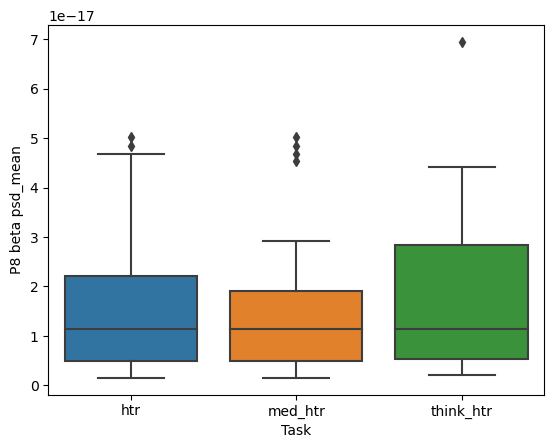

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 beta psd_mean')

plt.show()

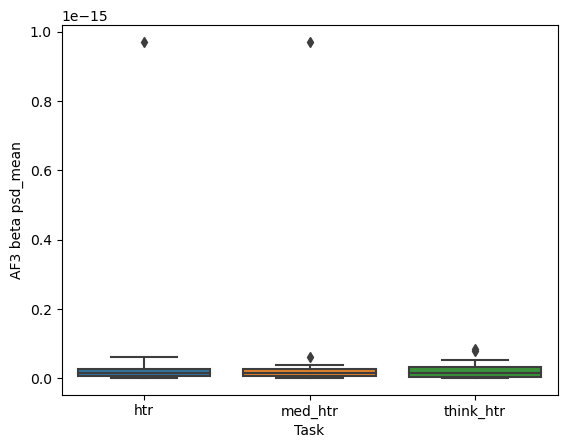

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF3 beta psd_mean')

plt.show()

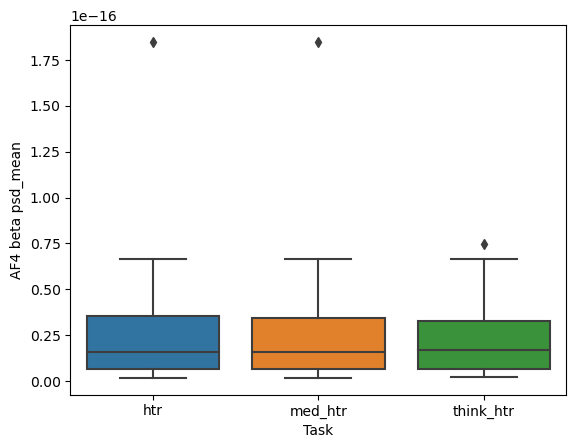

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF4 beta psd_mean')

plt.show()

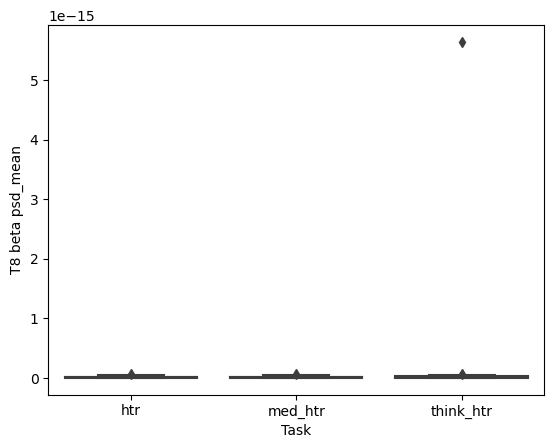

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T8 beta psd_mean')

plt.show()

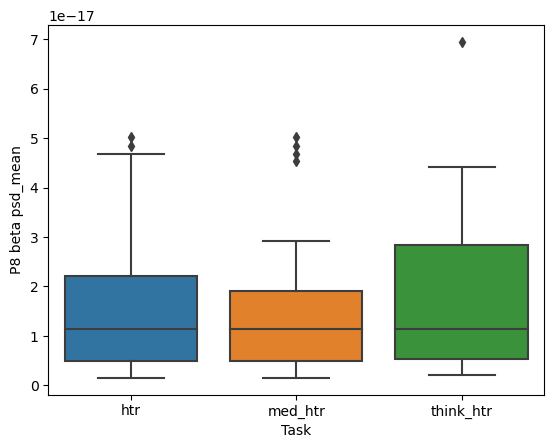

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 beta psd_mean')

plt.show()

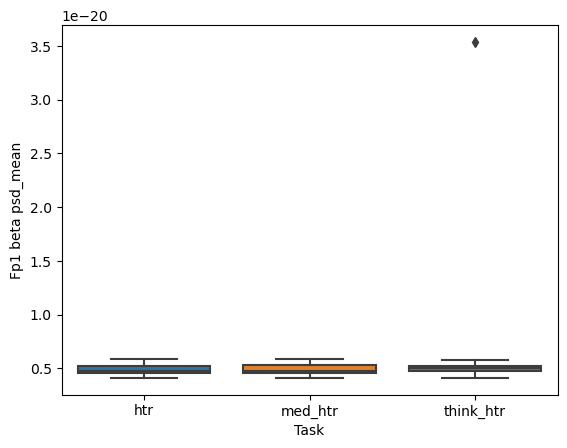

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp1 beta psd_mean')

plt.show()

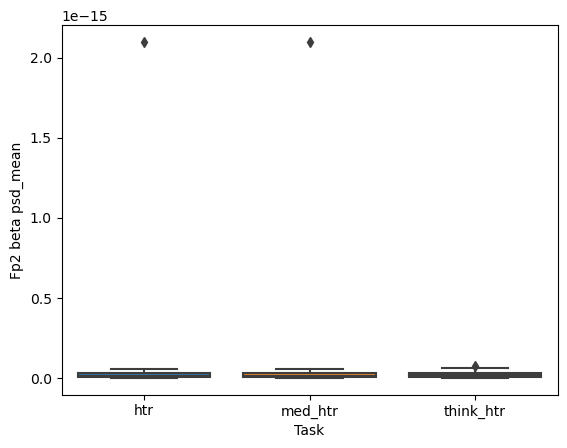

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp2 beta psd_mean')

plt.show()

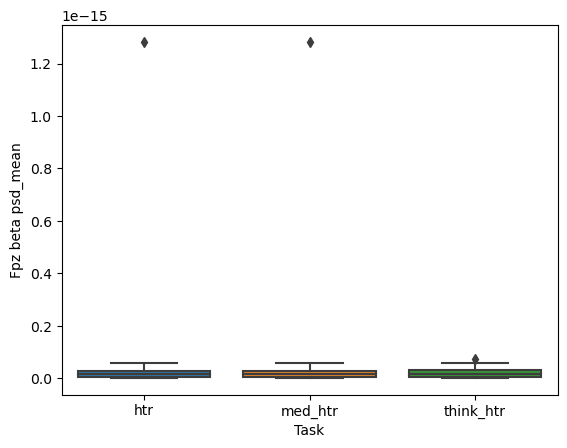

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fpz beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fpz beta psd_mean')

plt.show()

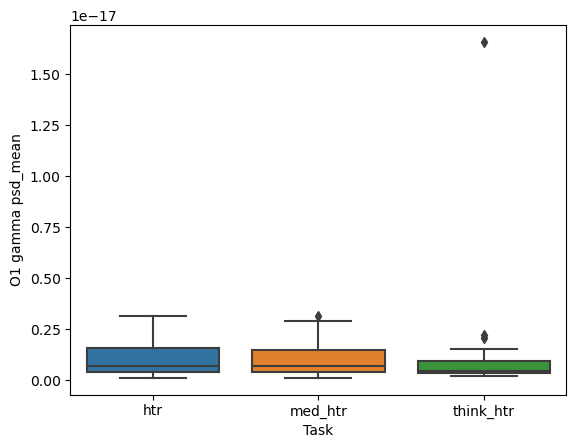

In [8]:

# O1 gamma psd_mean
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')

plt.show()



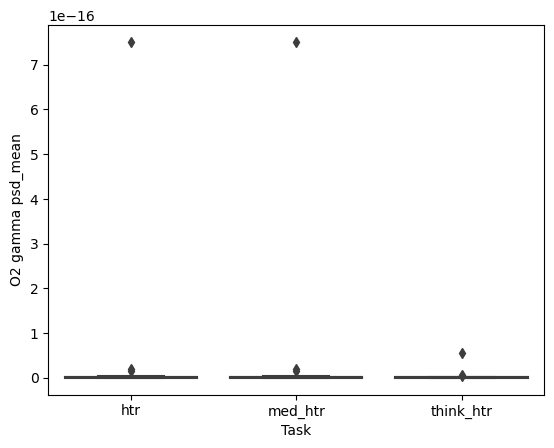

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['htr', 'med_htr','think_htr']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O2 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O2 gamma psd_mean')

plt.show()



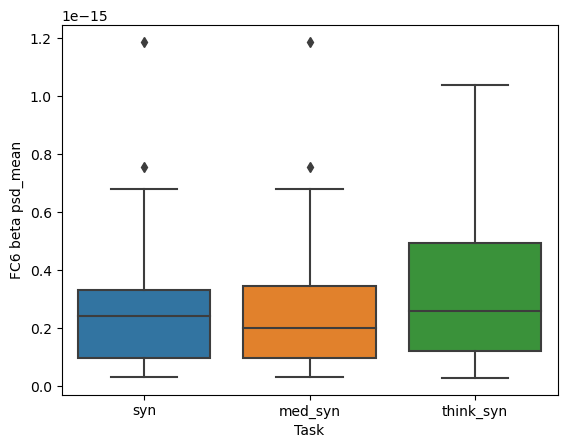

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC6 beta psd_mean')

plt.show()

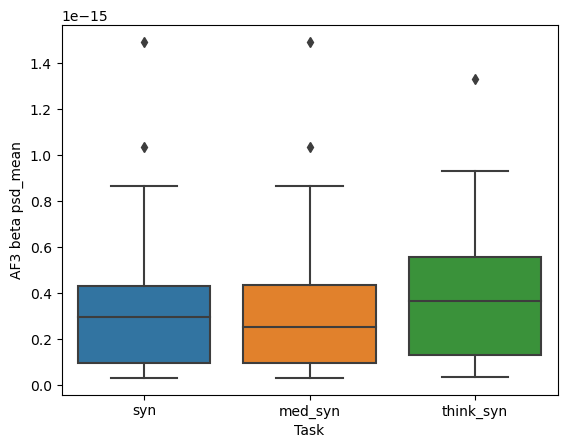

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF3 beta psd_mean')

plt.show()

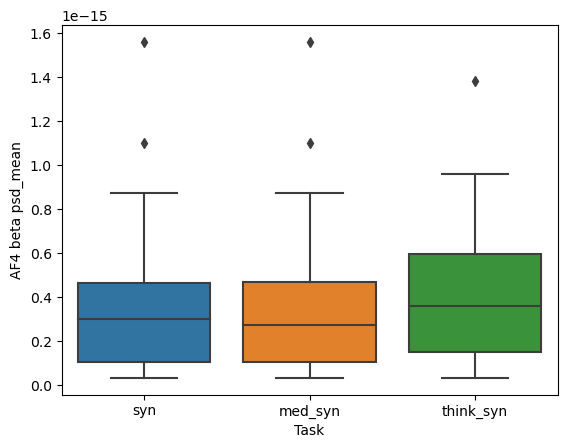

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF4 beta psd_mean')

plt.show()

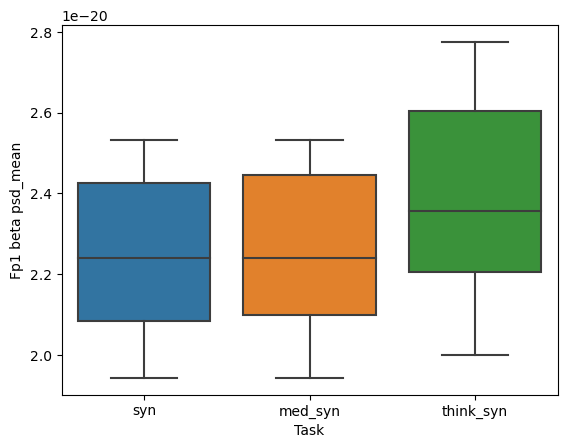

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp1 beta psd_mean')

plt.show()

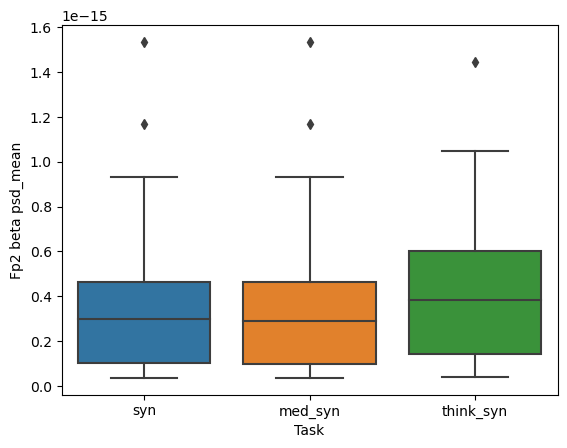

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp2 beta psd_mean')

plt.show()

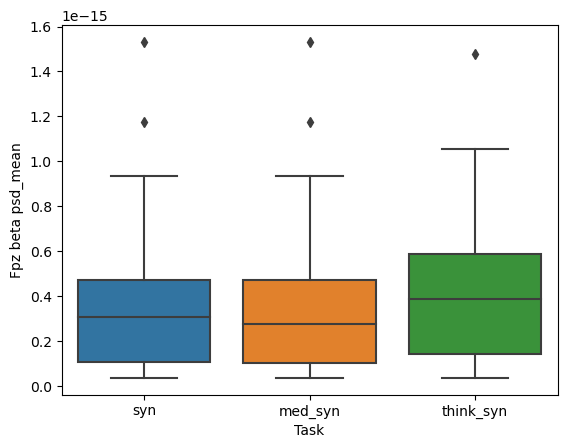

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fpz alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fpz beta psd_mean')

plt.show()

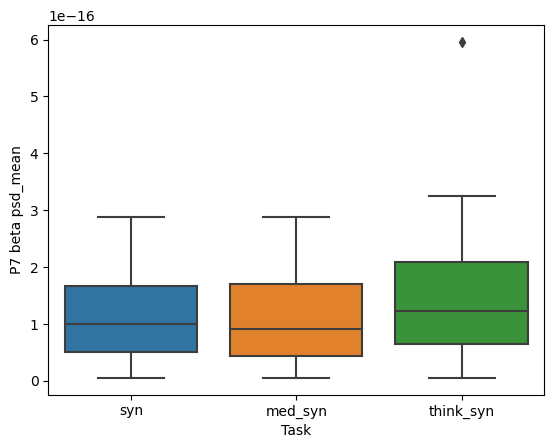

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 beta psd_mean')

plt.show()

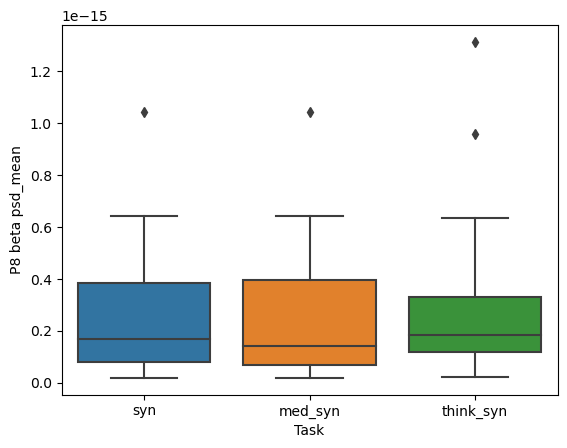

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 beta psd_mean')

plt.show()

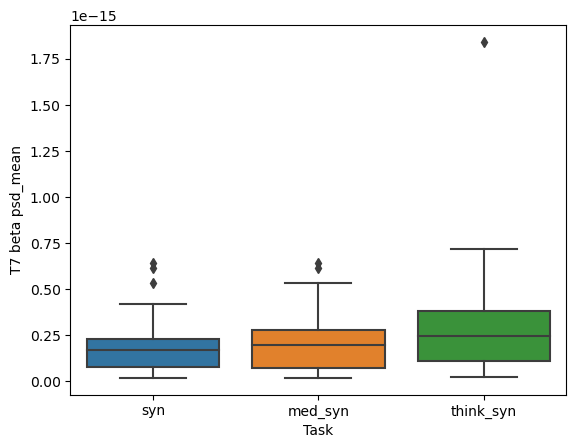

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T7 beta psd_mean')

plt.show()

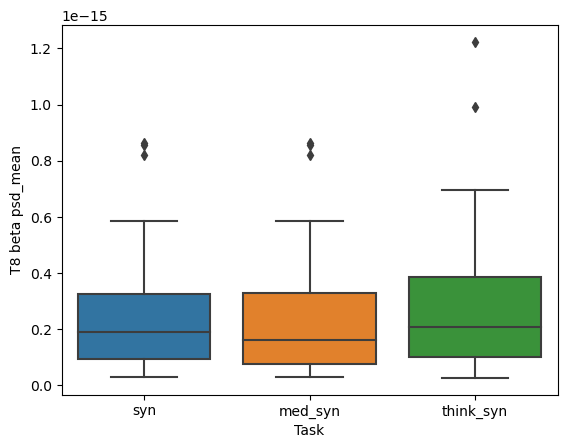

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T8 beta psd_mean')

plt.show()

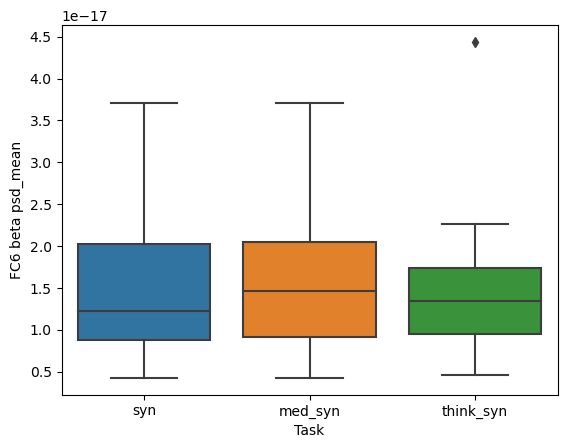

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='FC6 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('FC6 beta psd_mean')

plt.show()

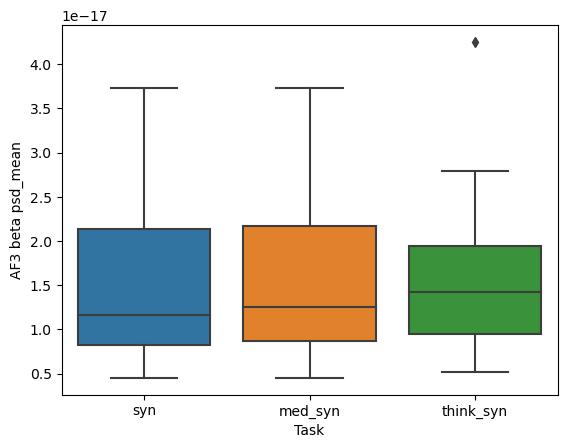

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF3 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF3 beta psd_mean')

plt.show()

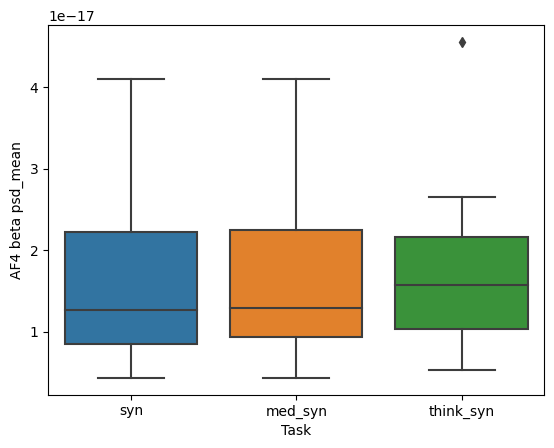

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='AF4 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('AF4 beta psd_mean')

plt.show()

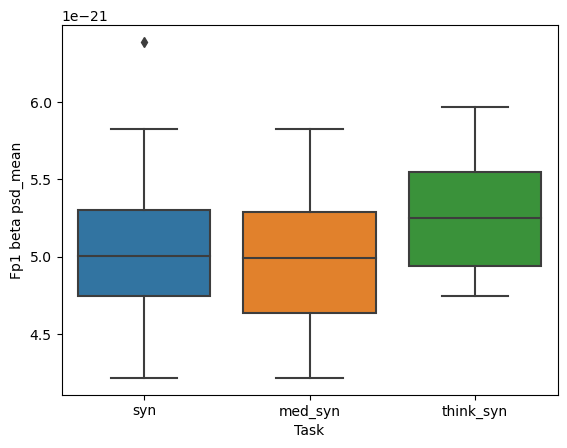

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp1 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp1 beta psd_mean')

plt.show()

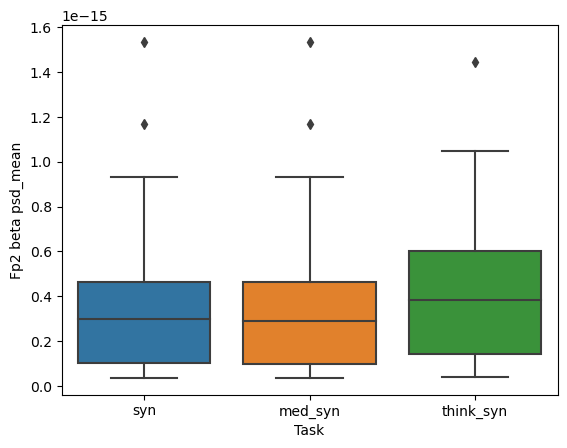

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fp2 alpha psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fp2 beta psd_mean')

plt.show()

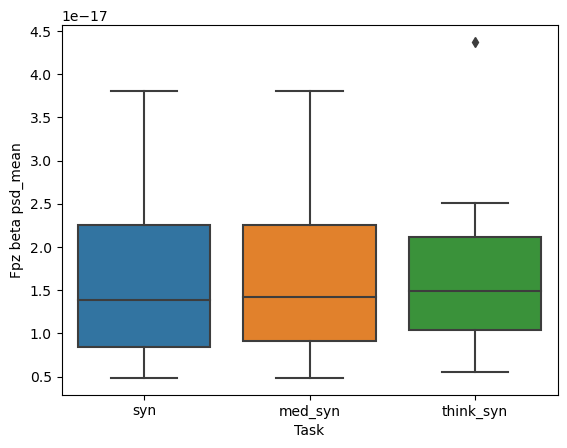

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='Fpz beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('Fpz beta psd_mean')

plt.show()

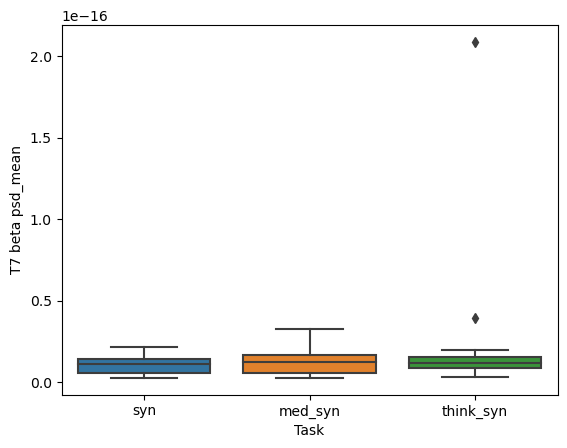

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T7 beta psd_mean')

plt.show()

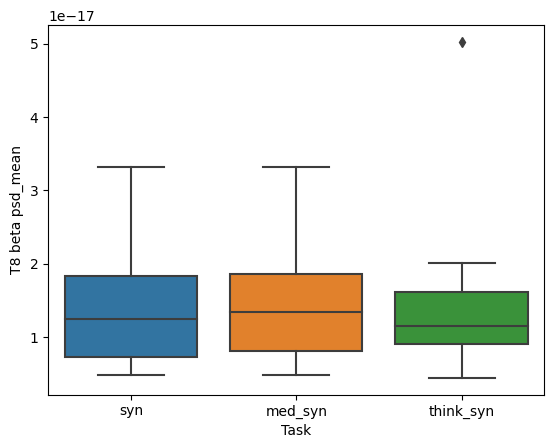

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='T8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('T8 beta psd_mean')

plt.show()

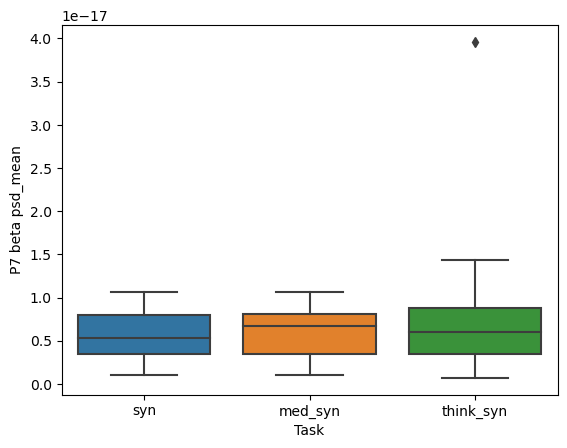

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P7 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 beta psd_mean')

plt.show()

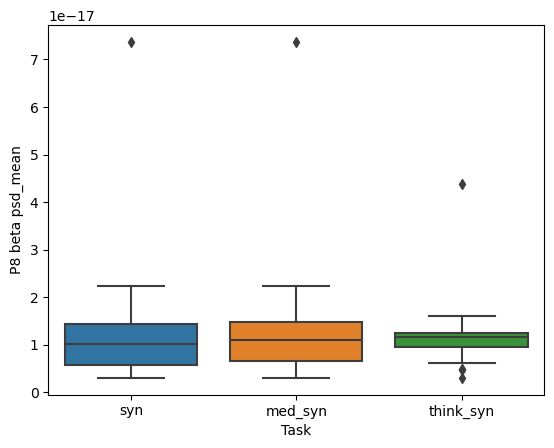

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='P8 beta psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P8 beta psd_mean')

plt.show()

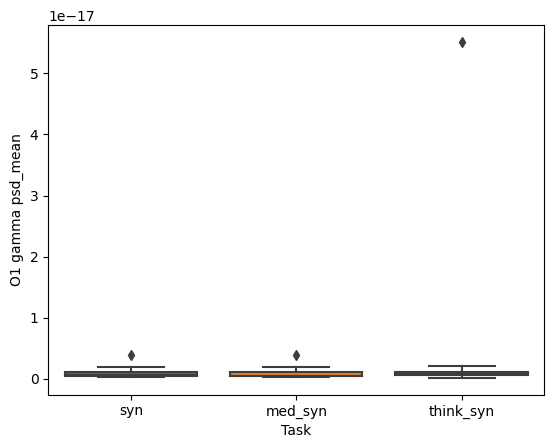

In [54]:
# O1 gamma psd_mean
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O1 gamma psd_mean')

plt.show()


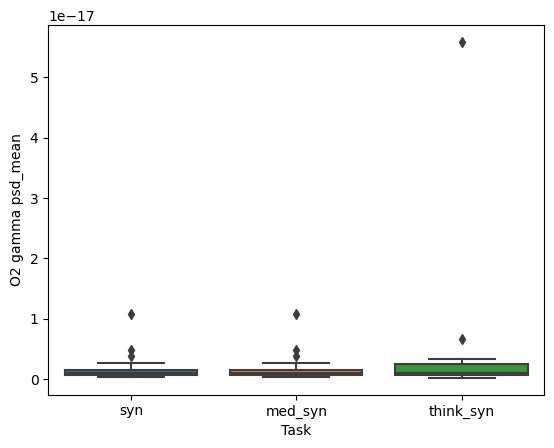

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['syn', 'med_syn','think_syn']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O2 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('O2 gamma psd_mean')

plt.show()


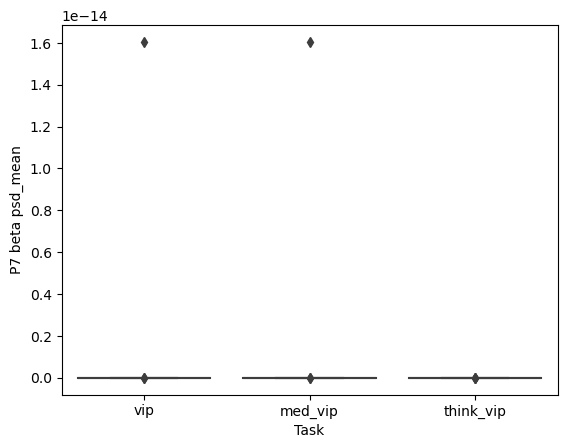

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'your_file.csv' with the actual path to your CSV file
df = pd.read_csv('merged_dataset_final_forplot.csv')

# Specify the two categories you want to include
selected_categories = ['vip', 'med_vip','think_vip']  # Replace with your actual category names

# Filter the DataFrame based on the selected categories
filtered_df = df[df['task'].isin(selected_categories)]

# Create a box plot using the filtered DataFrame
sns.boxplot(x='task', y='O1 gamma psd_mean', data=filtered_df)
plt.xlabel('Task')
plt.ylabel('P7 beta psd_mean')

plt.show()